# Projet Velib - Analyse de données - Notebook Python

----------------------------------------------
Manon Julia, Mathilde Marais, Damien Piot

4 GMM, Année universitaire 2023-2024

Promotion 57/58

Groupe 2

----------------------------------------------

Le notebook Python est le notebook le plus développé. C'est à celui-ci qu'il faudra se référer.

Ce projet en Analyse de données à pour objectif d'étudier un jeu de données sur les chargements des stations de Velib dans la ville de Paris sur une période d'une semaine entre le 1 et le 7 septembre 2014. 

Un premier jeu de données contient les taux de chargements des stations de distribution des vélos. 
* Un taux de chargement à 0 indique que la station est vide et qu'aucun vélo n'est disponible. 
* Un taux de chargement à 1 indique que la station est pleine et que tous les vélos qu'elle peut contenir sont disponibles. 

Un second jeu de données contient les coordonnées (longitude et latitude) associées à chaque station, ainsi qu'un élément Bonus.
* Un bonus à 1 signifie que la station est au sommet d'une colline ou se trouve sur un relief particulier. 
* Un bonus à 0 signifie que la station se situe au niveau du référentiel sur le plan de l'altitude. 

Du point de vue de l'analyse de données, les individus étudiés sont les stations. Il y a 168 variables qui correspondent aux 168 heures d'une semaine. 

Au cours de ce projet, nous allons étudier ces jeux de données. Pour ce faire, nous réaliserons une analyse descriptive de nos données dans une première partie. Dans un second temps, nous verrons s'il est possible d'en réduire la dimension. Puis nous étudierons les possibilités de classifications des données. Enfin, nous interprèterons et comparerons nos résultats avant de présenter nos conclusions.

# 1 - Etude descriptive du jeu de données

## 1.1 - Ouverture et étude des jeux de données

### 1.1.1 - Packages

Nous allons importer les packages dont nous allons nous servir dans ce Notebook. Ils sont regroupés dans la cellule ci-contre.

In [1]:
import pandas as pd
import numpy as np
import random as rd

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')

import matplotlib.cm as cm
import matplotlib.patches as mpatches
import plotly.express as px
import matplotlib as mpl

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

### 1.1.2 - Visualisation

Dans un premier temps, nous allons ouvrir et visualiser les premières lignes de nos deux datasets. L'objectif est d'avoir un aperçu de nos jeux de données, avec leurs tailles, variables et individus étudiés.

In [2]:
# Aperçu des 5 premières lignes du dataset sur les taux de chargements
loading = pd.read_csv('data/velibLoading.csv',sep = " ") 
loading.head()

,Lun-00,Lun-01,Lun-02,Lun-03,Lun-04,Lun-05,Lun-06,Lun-07,Lun-08,Lun-09,...,Dim-14,Dim-15,Dim-16,Dim-17,Dim-18,Dim-19,Dim-20,Dim-21,Dim-22,Dim-23
1,0.038462,0.038462,0.076923,0.038462,0.038462,0.038462,0.038462,0.038462,0.107143,0.000000,...,0.296296,0.111111,0.111111,0.148148,0.307692,0.076923,0.115385,0.076923,0.153846,0.153846
2,0.478261,0.478261,0.478261,0.434783,0.434783,0.434783,0.434783,0.434783,0.260870,0.043478,...,0.043478,0.000000,0.217391,0.130435,0.045455,0.173913,0.173913,0.173913,0.260870,0.391304
3,0.218182,0.145455,0.127273,0.109091,0.109091,0.109091,0.090909,0.090909,0.054545,0.109091,...,0.259259,0.259259,0.203704,0.129630,0.148148,0.296296,0.314815,0.370370,0.370370,0.407407
4,0.952381,0.952381,0.952381,0.952381,0.952381,0.952381,0.952381,1.000000,1.000000,1.000000,...,1.000000,1.000000,0.904762,0.857143,0.857143,0.857143,0.761905,0.761905,0.761905,0.761905
5,0.927536,0.811594,0.739130,0.724638,0.724638,0.724638,0.724638,0.724638,0.753623,0.971014,...,0.227273,0.454545,0.590909,0.833333,1.000000,0.818182,0.636364,0.712121,0.621212,0.575758


In [3]:
# Aperçu des 5 premières lignes du dataset sur les coordonnées
coord = pd.read_csv('data/velibCoord.csv',sep = " ") 
coord.head() 

,longitude,latitude,bonus,names
1,2.377389,48.886300,0,EURYALE DEHAYNIN
2,2.317591,48.890020,0,LEMERCIER
3,2.330447,48.850297,0,MEZIERES RENNES
4,2.271396,48.833734,0,FARMAN
5,2.366897,48.845887,0,QUAI DE LA RAPEE


In [4]:
# Affichage des dimensions du dataframe coord
print(coord.shape) 
print(f""" La table coord contient {coord.shape[0]} lignes et {coord.shape[1]} colonnes.""")

(1189, 4)
 La table coord contient 1189 lignes et 4 colonnes.


### 1.1.3 - Vérification que le dataframe ne contient pas de valeurs manquantes

Il est maintenant intéressant de se demander si nos jeux de données sont complets, c'est à dire si les colonnes ne contiennent pas d'éléments vides, nuls ou à NaN.

In [5]:
loading_missing_value = loading.isna().sum().sort_values(ascending=False)

print('--- Loading ---')
print(loading_missing_value.sum())

print('')

coord_missing_value = coord.isna().sum().sort_values(ascending=False)

print('--- Coord ---')
print(coord_missing_value)

--- Loading ---
0

--- Coord ---
longitude    0
latitude     0
bonus        0
names        0
dtype: int64


Interprétation : 

On a réalisé un affichage par ordre décroissant avec 'ascending=False', cela nous permet d'affirmer qu'il n'y a pas de valeurs manquantes dans les jeux de données.

### 1.1.4 - Etude des lignes dupliquées dans le dataframe 

On va étudier si nos jeux de données contiennent des lignes dupliquées, c'est à dire des lignes où les valeurs pour chaque variables sont identiques.

In [6]:
print('--- Loading ---')
print(loading.duplicated().sum())

print('')

print('--- Coord ---')
print(coord.duplicated().sum())

--- Loading ---
0

--- Coord ---
0


Sur le même principe que dans la cellule précédente, il n'y a pas de lignes dupliquées dans nos jeux de données.

### 1.1.5 - Etude des doublons dans le dataframe 

Nous avons observé ci-dessus qu'il n'y a pas de lignes dupliquées dans nos jeux de données. Cependant, il faut également étudier si le jeu de données présentant les coordonnées des stations nous donne plusieurs informations différentes pour une même station. 

In [7]:
# Calcul des fréquences d'apparition des noms des stations
station_names_counts = coord['names'].value_counts()

# Filtrage pour ne garder que les noms avec une fréquence de 2 ou plus
duplicates = station_names_counts[station_names_counts > 1]

# Affichage des noms en doublons par ordre décroissant de fréquence
print(duplicates)
print(duplicates.size)


names
PORTE DES LILAS          3
GARE D'AUSTERLITZ        3
PORTE DE BAGNOLET        2
CHERCHE MIDI             2
LEGENDRE                 2
BROCHANT                 2
ALEXANDRE DUMAS          2
JOURDAIN                 2
BASTILLE                 2
BOURSE DU TRAVAIL        2
CLICHY                   2
FAURE (AUBERVILLIERS)    2
LACEPEDE                 2
SAINT MARCEL             2
GARE DE L'EST            2
WILSON (LEVALLOIS)       2
PARC DE BELLEVILLE       2
PORT ROYAL               2
BELLEVILLE               2
FRANCE (LEVALLOIS)       2
RICHARD LENOIR           2
SAINT HONORE             2
SAINT AUGUSTIN           2
PORTE DE SAINT OUEN      2
DODU                     2
AQUEDUC                  2
Name: count, dtype: int64
26


Cette commande indique le nombre d'occurences des stations. Ainsi, nous pouvons voir que la station PORTE DES LILAS et la station GARE D'AUSTERLITZ apparaissent 3 fois dans notre jeu de données par exemple. On obtient que notre dataset contient 26 éléments qui aparaissent deux fois ou plus. 

In [8]:
# Visualisation des doublons pour le premier élément de la liste des doublons
station_names = coord.names.value_counts().sort_values(ascending=False)
name = station_names.index[0]
coord[coord.names == name]

,longitude,latitude,bonus,names
362,2.404770,48.876604,1,PORTE DES LILAS
450,2.405960,48.875412,1,PORTE DES LILAS
957,2.411046,48.878099,1,PORTE DES LILAS


Cette commande permet de visualiser un élément de la liste affichée dans la cellule précédente. Ainsi, pour la station PORTE DES LILAS, nous confirmons qu'elle apparaît bien 3 fois dans notre jeu de données. La première colonne indique les numéros de lignes auxquelles les occurences de la station apparaissent.  L'élément bonus indique que la station se situe en hauteur d'une colline lorsque bonus prend la valeur 1. Ces occurences diffèrent au niveau des coordonnées géographiques de la station. Il pourrait y avoir des erreurs de saisie ou de transcription des coordonnées géographiques. Si plusieurs bornes de stationnement sont présentes dans une zone proche et sont enregistrées sous le même nom de station dans la base de données, cela pourrait expliquer les différentes coordonnées. Les coordonnées pourraient avoir été collectées à l'aide de différents instruments ou méthodes, ce qui peut entraîner des variations dans les données enregistrées

## 1.2 - Visualisation des données de chargement

### 1.2.1 - Comparaison des stations

Nous souhaitons observer l'évolution du taux de chargement d'un pannel de stations au cours de la semaine. Cela va nous permettre, dans un premier temps, de faire des hypothèses sur les tendances d'utilisations des vélos en fonction des jours de la semaine, ou des moments de la journée. Dans un second temps, nous allons pouvoir comparer les différences entre les stations de notre pannel. L'idée est de voir si les taux de chargements sont similaires d'une station à l'autre, ou si on observe des variations radicales en fonction des stations de vélib. 

Pour cela, nous allons représenter les courbes d'évolution des taux de chargement pour un pannel de 16 stations choisies au hasard dans la liste de notre jeu de données. Nous allons, pour chaque graphique, représenter des lignes verticales correspondant aux séparations des jours de la semaine. Et en représentant nos 16 graphiques simultanément, nous allons pouvoir réaliser l'étude présentée ci-dessus.

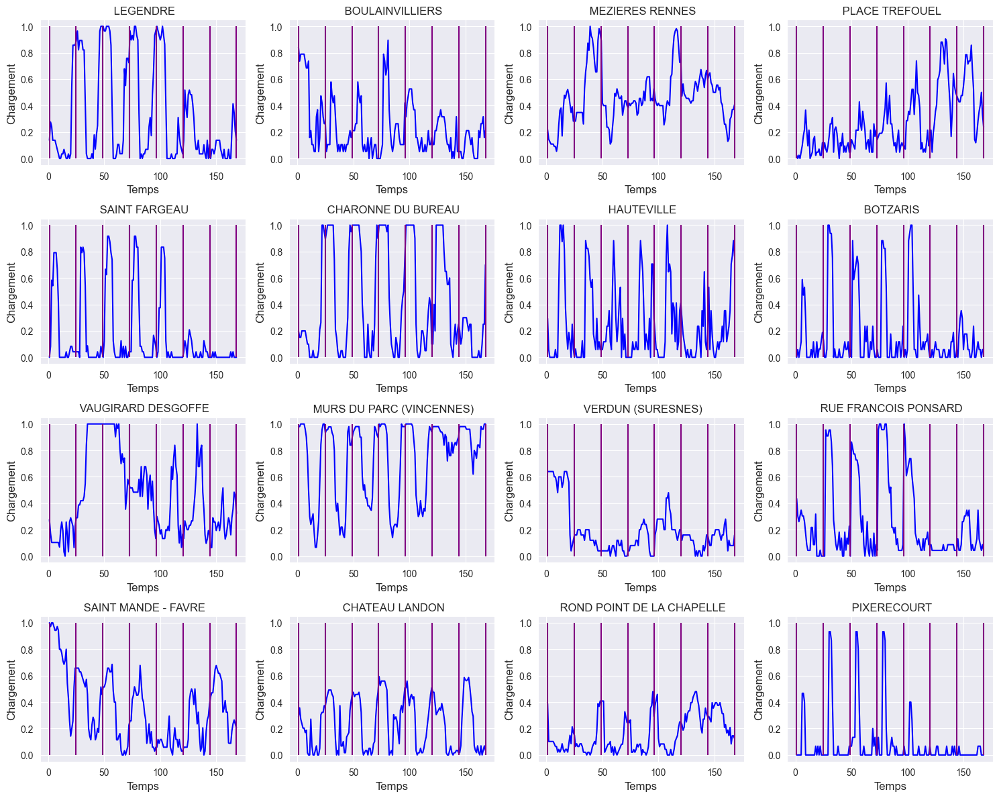

In [9]:
# On prend 16 stations au hasard
loading_data = loading.to_numpy() 

n_steps    = loading.shape[1]  # nombre de pas de temps observés
time_range = np.linspace(1, n_steps, n_steps)  # intervalle de temps observé
time_tick  = np.linspace(1, n_steps, 8)  # début de chaque jour


stations = np.arange(loading.shape[0])
rd.shuffle(stations)
stations = stations[:16] 


fig, axs = plt.subplots(4, 4, figsize = (15,12))

for i in range(4):
    for j in range(4):
        k_station = stations[4 * i + j] # on parcourt les 16 premiers éléments de la liste (de 0 à 15)
        axs[i, j].plot(time_range, loading_data[k_station, :], color = 'blue')
        axs[i, j].vlines(x = time_tick, ymin = 0, ymax = 1, colors = "purple")
        axs[i, j].set_title(coord.names[1 + k_station], fontsize = 12)

for ax in axs.flat:
    ax.set_xlabel('Temps', fontsize = 12)
    ax.set_ylabel('Chargement', fontsize = 12)
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)
    
plt.tight_layout()
plt.show()

On observe une série de graphiques qui représente le niveau de chargement des stations de Vélib à Paris prises au hasard sur une période de temps d'une semaine, avec des intervalles de temps horaires sur l'axe des abscisses et le niveau de chargement sur l'axe des ordonnées.

* Variations temporelles : Chaque graphique montre les variations dans la semaine du nombre de vélos disponibles dans les 16 stations prises au hasard. Les valeurs à 1 indiquent que tous les vélos sont disponibles à ce moment-là. On observe sur 16 stations une variété assez importante de profil avec des stations en général très remplies et des stations plutôt vides. Dans la plupart des stations, on voit des variations importantes de chargement sur la journée, qui sont en général assez proches d'un jour à l'autre. On remarque également une temporalité hebdomadaire dans certaines stations, avec des taux de chargements similaires sur les 5 premiers jours de la semaine, et des différences au niveau des chargements les week-ends.

* Comparaison entre les stations : En comparant les graphiques entre eux, on peut identifier les stations qui ont un taux de rotation élevé des vélos (grand nombre de variations entre des valeurs élevées et basses) et celles qui sont moins utilisées (moins de variation ou des niveaux plus constants).

### 1.2.2 - Etude du chargement médian des stations

Avec les courbes précédentes, nous avons pu constater des variations importantes entre les stations. Malgré cela, on retrouve des similitudes communes sur la plupart des stations, avec notamment un profil quotidien qui se répète sur plusieurs jours. Nous allons étudier le chargement médian des stations pour étudier cette temporalité. Le plus pertinent est ici d'afficher une superposition de boxplots, afin d'étudier la valeur médiane, ainsi que les valeurs des quantiles, en fonction des heures tout au long de la semaine. 

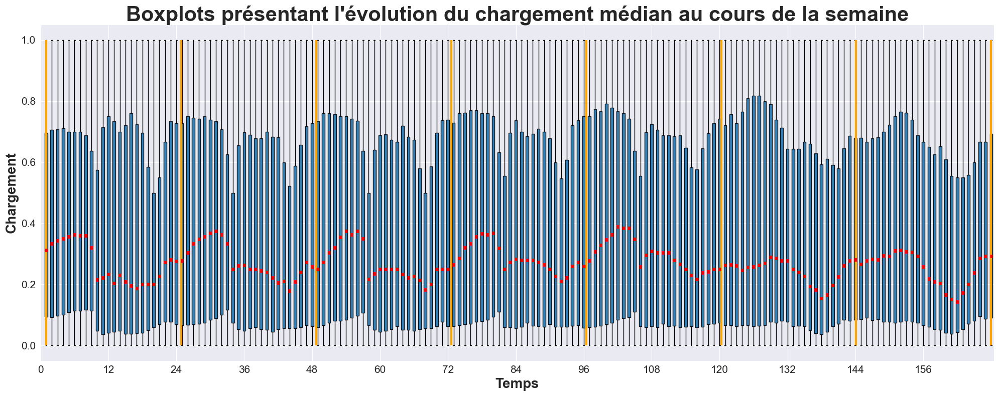

In [10]:
plt.figure(figsize=(20,8))

bp = plt.boxplot(loading_data,patch_artist = True)
    
for box in bp['boxes']:
    box.set_alpha(0.9) #To make it transparent
    
for median in bp['medians']:
    median.set(color = "red", linewidth=5)
    
plt.vlines(x = time_tick, ymin = 0, ymax = 1, colors = "Orange", linewidth = 3) 
# time_tick, déjà défini et correspond aux jours

plt.xlabel('Temps', fontsize = 20, fontweight='demibold')
plt.ylabel('Chargement', fontsize = 20, fontweight='demibold')
plt.title("Boxplots présentant l'évolution du chargement médian au cours de la semaine", fontsize = 30, fontweight='bold')
plt.xticks(ticks = np.arange(0, 168, 12), labels=np.arange(0, 168, 12), fontsize = 15)
plt.yticks(fontsize = 15)


plt.tight_layout()
plt.show()

Ce graphique présente une superposition de boxplots montrant l'évolution du chargement des stations vélib au au fil des heures sur une semaine. 

* Série temporelle : La ligne rouge représente la médiane du chargement des stations au fil du temps. Elle montre l'évolution du niveau de chargement des stations. Ainsi, on peut identifier un modèle cyclique sur les 5 premiers jours de la semaine, qui pourrait correspondre aux déplacements pendulaires pour se rendre sur les lieux de travail. Ainsi, on voit une forte diminution du taux de chargement tous les matins du lundi au vendredi à la même heure et de la même amplitude sur le boxplot. Puis, le taux de chargement remonte progressivement dans la journée, de manière similaire sur les jours ouvrés. Pour le week-end, on remarque une différence avec une forte atténuation de cet effet pendulaire. Le taux de chargement est plus constant au cours de la journée, avec une forte diminution correspondant à une plus forte utilisation des vélos en fin de journée sur le samedi et dimanche. 

* Amplitude des valeurs : On observe un écart très important entre le premier et le troisième quartile, ce qui traduit une grande variation du taux de chargement entre les stations. De plus, la valeur du premier quartile diminue fortement au cours de la matinée. Cela traduit le fait que beaucoup de stations se déchargent sur cette période. Cela se remarque aussi avec les pics bi-pendulaires observés sur le troisème quartile. En effet, on remarque deux pics bien plus bas que sur les box-plots des autres horaires. Ces pics correspondent aux moments de la journée où les vélos sont les plus utilisés : la valeur du troisième quartile diminue nettement. 

### 1.2.3 - Etude de la temporalité du chargement moyen au cours de la semaine

Nous avons conjecturé précedemment que l'évolution des taux de chargement était similaire sur les jours de travail, mais assez différents les week-ends. Nous souhaitons vérifier cette hypothèse. Pour ce faire, nous allons calculer le chargement moyen des stations sur chaque heure d'une journée, puis comparer l'évolution de cette moyenne en fonction des jours de la semaine. Nous affichons également la moyenne globale sur la semaine pour étudier la tendance suivie.

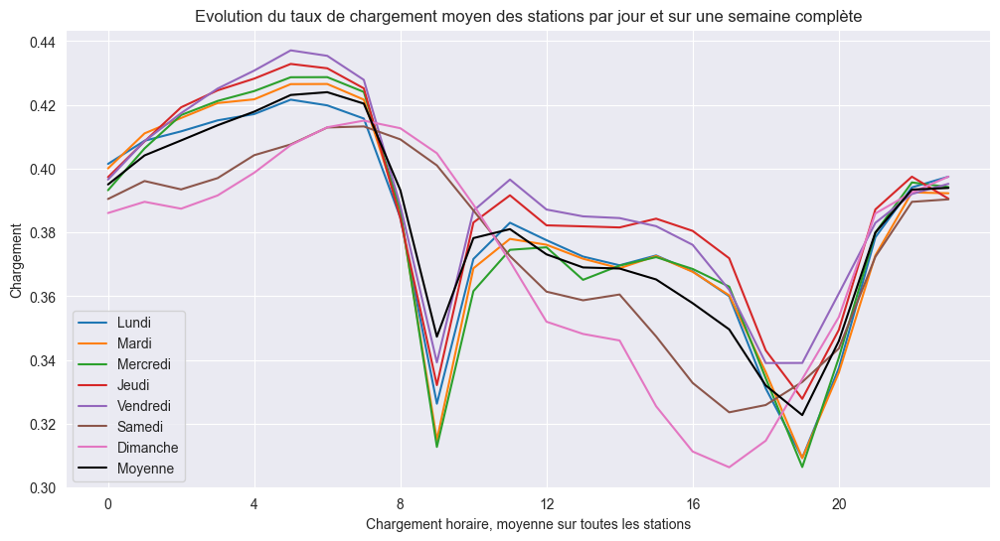

In [11]:
mean_per_hour_per_day = loading.mean(axis = 0).to_numpy()
mean_per_hour_per_day = mean_per_hour_per_day.reshape((7, 24)) # 7 jours et 24 heures

mean_per_hour = mean_per_hour_per_day.mean(axis=0)

days = ["Lundi", "Mardi", "Mercredi","Jeudi", "Vendredi", "Samedi", "Dimanche"]
plt.figure(figsize = (12,6))

plt.plot(mean_per_hour_per_day.transpose())
plt.plot(mean_per_hour, color = "black")

plt.xlabel('Chargement horaire, moyenne sur toutes les stations')
plt.ylabel('Chargement')
plt.legend(days + ['Moyenne'])
plt.xticks(ticks = np.arange(0,24,4), labels=np.arange(0,24,4))
plt.title("Evolution du taux de chargement moyen des stations par jour et sur une semaine complète")
  
plt.tight_layout
plt.show()

Tout d'abord, on peut visualiser les variations quotidiennes, avec les lignes colorées représentant les différents jours de la semaine, et la ligne noire représentant la moyenne sur toute la semaine. On peut observer les tendances de chargement des stations pour chaque jour ouvré, qui sont très similaires. Le graphe confirme également que le taux de chargement est différent pendant les week-ends, avec néanmoins une similarité observée entre le samedi et le dimanche. De plus, la moyenne hebdomadaire suit plutôt la tendance des jours travaillés, car ces jours représentent la majorité des jours de la semaine.

On remarque des plages horaires où les stations sont plus chargées en moyenne, ce qui correspond aux heures avec peu d'utilisation des vélos : principalement la nuit, avant que les gens ne se rendent au travail ou à l'école, et dans une moindre mesure en journée durant les jours ouvrés. On observe également des creux qui représentent les heures où les stations sont les moins chargées, ce qui pourrait correspondre aux heures de pointe où les vélos sont utilisés pour les trajets. Cela va dans le même sens que nos hypothèses sur les boxplots superposés.

On peut en déduire des habitudes dans les comportements des utilisateurs. Par exemple, si les stations sont moins chargées vers 8h et 18h, cela pourrait indiquer les heures de début et de fin de journée de travail typiques.

En examinant les différences entre les jours de la semaine, on peut identifier des tendances spécifiques, comme des jours avec une plus grande utilisation des vélos. Par exemple, si les lignes pour le samedi et le dimanche montrent un chargement plus faible pendant la journée, cela pourrait indiquer une utilisation récréative plus importante pendant les week-ends.


### 1.2.4 - Etude des stations vélib sur une carte 

Nous avons constaté des fortes disparités du taux de chargement en fonction des stations en affichant un pannel aléatoire de 16 sations de notre jeu de données. Nous nous demandons si cette disparité est due à l'emplacement géographique des stations. Par exemple, nous pouvons nous demander si les stations commençant la journée avec un taux de chargement faible peuvent être des stations se situant dans des quartiers de bureaux (généralement au centre, ou vers La Défense...), et se remplissent fortement dans la matinée. A contrario, certaines stations situées en périphérie pourraient commencer la journée avec un taux de remplissage élevé, puis se vider sur la période de départ au travail/école, et se remplir à nouveau en fin de journée. 

Pour étudier cela, nous allons étudier le taux de remplissage des stations sur une carte sur une même journée (le lundi), à différentes heures.

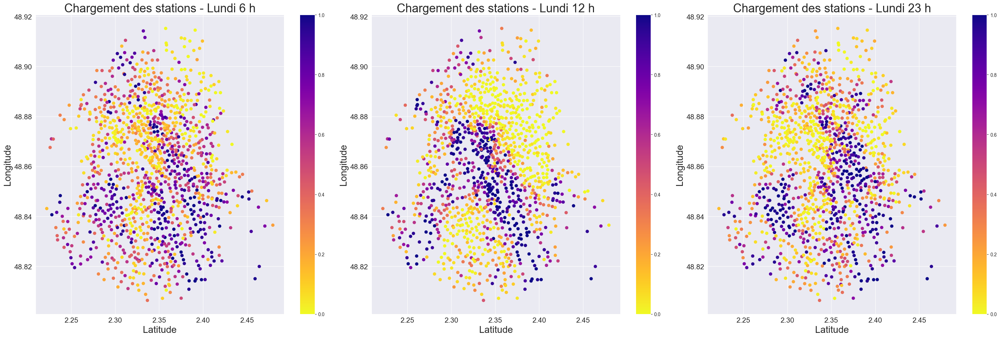

In [12]:
hours = [6, 12, 23] # les différents moments de la journée qu'on étudie.

s, n = 10, len(hours)
fig, axs = plt.subplots(1, n, figsize = (s*n, s))

for (i,h) in enumerate(hours):
    im = axs[i].scatter(coord.longitude, coord.latitude, c = loading_data[:,h], cmap = cm.plasma_r)
    axs[i].set_title('Chargement des stations - Lundi {} h'.format(h), fontsize = 25)
    plt.colorbar(im, ax=axs[i])
        
for ax in axs.flat:
    ax.set_xlabel('Latitude', fontsize = 20)
    ax.set_ylabel('Longitude', fontsize = 20)
    ax.tick_params(axis='x', labelsize=15)
    ax.tick_params(axis='y', labelsize=15)

plt.tight_layout()
plt.show()

Les axes représentent la latitude et la longitude, positionnant ainsi les stations de Vélib sur une carte de Paris.
La couleur de chaque point représente le niveau de chargement de la station à l'heure indiquée, avec un code couleur allant du jaune (peu ou pas de vélos disponibles) au violet (station complètement chargée).

* Analyse à 6 heures (premier graphique à gauche) :

À 6 heures du matin, on observe une majorité de stations avec un chargement moyen à élevé (beaucoup de points violets). Cela suggère que les vélos ne sont pas encore largement utilisés à cette heure, ce qui est attendu tôt le matin. Les stations plus remplies sont plutôt périphériques, ce qui confirme l'hypothèse sur les stations en banlieue ou périphérie.

* Analyse à 12 heures (graphique du milieu) :

À midi, les couleurs sont peu variées. En effet, les stations sont soit assez pleines, soit assez vides : il n'y a pas vraiment de station avec un taux de chargement moyen. De plus, on observe un regroupement central des stations présentant de la disponibilité. Ce regroupement, qui suit globalement le tracé de la Seine, peut correspondre aux quartiers de bureaux, où les travailleurs ont laissés leur vélo en arrivant au travail. A l'inverse, les quartiers périphériques sont presque tous vides.

* Analyse à 23 heures (dernier graphique à droite) :

À 23 heures, on observe une situation qui se rapproche de celle à 6h du matin. Cela pourrait indiquer que les gens ont rentrés dans des quartiers résidentiels, et que les vélos ont été retournés aux stations après les déplacements de la journée. Néanmoins, les stations restent un petit peu moins pleines qu'à 6h, ce qui montre que certains vélos sont encore utilisés à 23h.


Ces cartes de chaleur peuvent également aider les gestionnaires de Vélib à identifier les zones où il y a une demande élevée de vélos à certaines heures, et où un rééquilibrage pourrait être nécessaire pour s'assurer que les utilisateurs trouvent des vélos disponibles en fonction de l'heure.

Finalement, cette analyse concorde avec nos hypothèses sur les taux de remplissages en fonction des types de quartiers (résidentiels ou de bureaux). 

### 1.2.5 - Etude des déplacements pendulaires sur une carte

Pour mettre en lumière les déplacements pendulaires, et ainsi confirmer ou invalider nos hypothèses, nous allons représenter ce même style de graphique avant les déplacements pendulaires (par exemple le matin assez tôt), et après (par exemple en milieu de matinée).

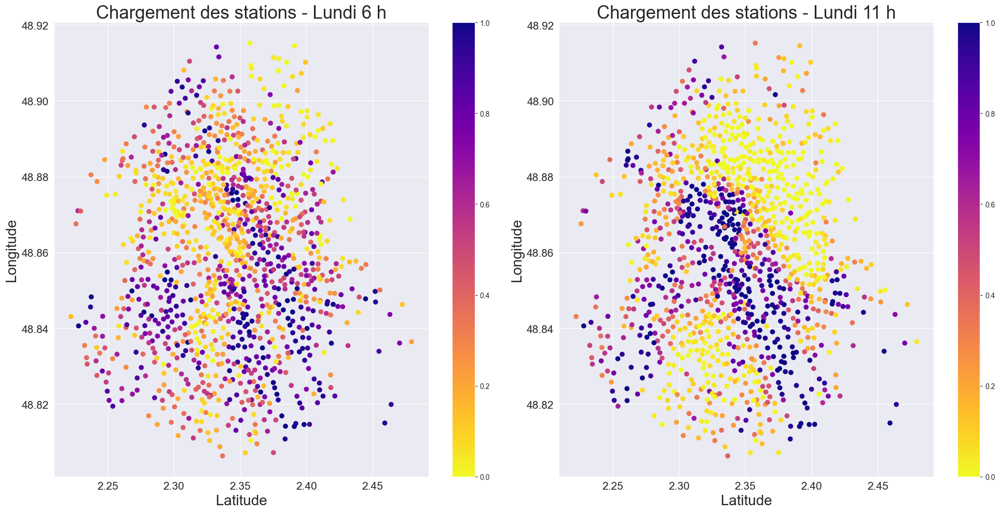

In [13]:
hours = [6, 11] # les différents moments de la journée qu'on étudie.

s, n = 10, len(hours)
fig, axs = plt.subplots(1, n, figsize = (s*n, s))

for (i,h) in enumerate(hours):
    im = axs[i].scatter(coord.longitude, coord.latitude, c = loading_data[:,h], cmap = cm.plasma_r)
    axs[i].set_title('Chargement des stations - Lundi {} h'.format(h), fontsize = 25)
    plt.colorbar(im, ax=axs[i])
        
for ax in axs.flat:
    ax.set_xlabel('Latitude', fontsize = 20)
    ax.set_ylabel('Longitude', fontsize = 20)
    ax.tick_params(axis='x', labelsize=15)
    ax.tick_params(axis='y', labelsize=15)

plt.tight_layout()
plt.show()

Sur cette carte, nous observons clairement que les stations en périphérie se vident au profit des stations au centre. De plus, puisque les tendances observées sur tous les jours travaillés sont les mêmes (cf : Etude de la temporalité du chargement moyen au cours de la semaine), on peut alors valider notre hypothèse selon laquelle les déplacements pendulaires font que les vélos sont utilisés de l'extérieur de la ville vers le centre, où sont regroupés les quartiers de bureaux. 

In [14]:
h = 11
hours = np.arange(h, 168, 24)
load_per_hour = loading_data[:, hours].mean(axis=1)

fig = px.scatter_mapbox(coord, lat = 'latitude', lon = 'longitude', 
                        mapbox_style = "carto-positron",
                        color = load_per_hour, color_continuous_scale = px.colors.sequential.Plasma_r, #size = load_per_hour,
                        zoom  = 10, opacity = .9,
                        title = 'Chargement des stations - Moyenne hebdomadaire à {} h'.format(h))

fig.show()

Conformément à nos hypothèses, on observe que les stations Vélib avec beaucoup de disponibilité sont majoritairement concentrées au centre de la ville et le long de la Seine. Sur la carte de Paris, on remarque que les mobilités urbaines sont orientées vers Boulogne Billancourt, où se situent de nombreux sièges sociaux, le Quartier Latien, le 8E, Bastille, Opera, République, Montparnasse, Bercy, Ivry-sur-Seine. La plupart de ces quartiers sont soit de bureaux, soit avec une forte identité culturelle et touristique. Ainsi, ils se remplissent dans la matinée et se vident en soirée en terme de fréquentation. Cela va dans le sens de nos hypothèses de déplacements pendulaires.

De l'autre côté, les quartiers en périphéries sont ceux dont les stations ont un fort taux de remplissage tôt le matin et tard le soir, et se vidant au cours de la journée. Ces quartiers périphériques étant en majorité résidentiels, on peut supposer que les utilisateurs des Vélib se déplacent vers leur lieu d'exercice au centre et rentrent à leur domicile le soir.

### 1.2.6 - Influence de l'altitude des stations sur les taux de chargement

Nous avons présenté la colonne bonus dans l'introduction de ce projet. Nous allons regarder si cet élément à une influence sur le taux de chargement des stations. Pour ce faire, nous allons commencer par étudier la répartition des stations en altitude.

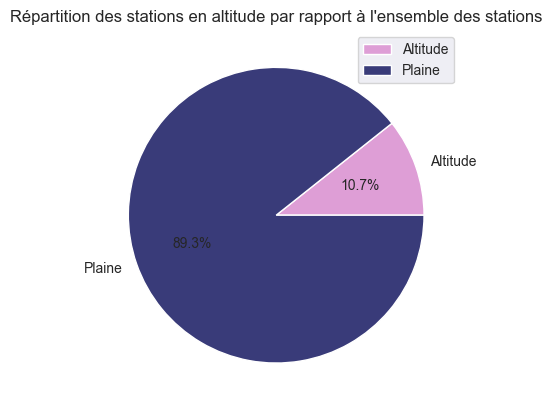

In [15]:
loading_hill   = loading_data[coord.bonus == 1]
loading_valley = loading_data[coord.bonus == 0]

size = [len(loading_hill), len(loading_valley)]
labels = ['Altitude', 'Plaine']

plt.pie(size, labels = labels, autopct="%1.1f%%", 
        colors = [sns.color_palette('tab20b')[-1],sns.color_palette('tab20b')[0]])

plt.legend()
plt.title("Répartition des stations en altitude par rapport à l'ensemble des stations")
plt.show()

La grande majorité des stations Vélib, soit 89.3%, sont situées en plaine. Cela suggère que la plupart des stations sont dans des zones relativement plates de la ville. Seulement 10.7% des stations sont situées en altitude. Ces stations peuvent se trouver sur des collines ou dans des zones élevées de la ville.

Cette répartition peut avoir des implications sur l'usage des vélos. Les stations en plaine sont probablement plus fréquentées en raison de la facilité de pédalage sur terrain plat. Les stations en altitude pourraient avoir moins de fréquentation en raison de l'effort supplémentaire requis pour y accéder ou en partir, bien qu'elles puissent servir des zones résidentielles situées en hauteur.

Cela peut avoir un impact sur des opérations logistiques. Il peut y avoir des opérations de rééquilibrage des vélos (s'assurer que les stations ne soient ni vides ni pleines). Il peut être plus difficile de maintenir un bon équilibre pour les stations en altitude, en particulier si les utilisateurs ont tendance à prendre les vélos en descente et non en montée.

### 1.2.7 - Représentation des stations en altitude sur une carte

Nous allons étudier la répartition géographique des stations en altitude. De manière analogue aux premières visualisations sur cartes, nous allons représenter la répartition des stations en altitude sous forme de nuage de points. En s'appuyant sur nos observations précédentes, nous allons voir si cet élément peut avoir une influence sur les chargements des stations.

Nous allons également juxtaposer la carte montrant le taux de chargement à 6h du matin pour comparer avec le taux de chargement des stations.

<Figure size 800x800 with 0 Axes>

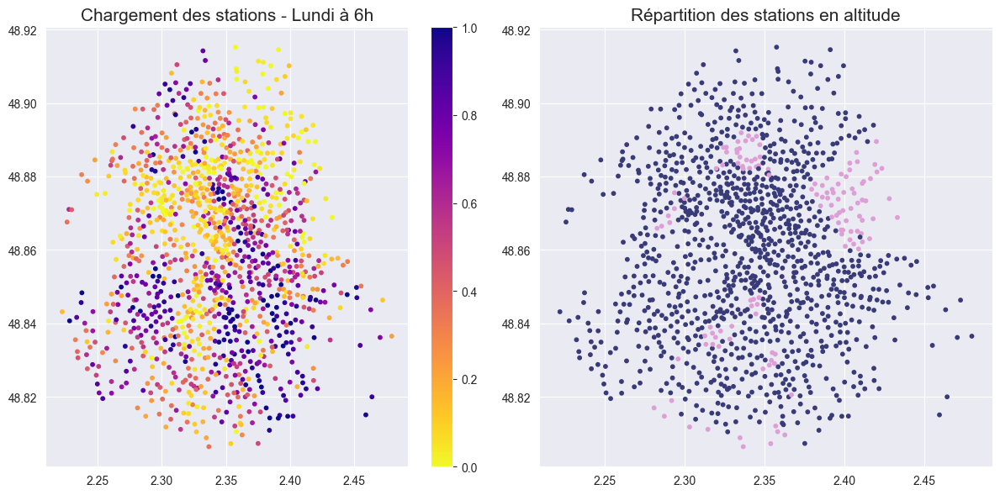

In [16]:
plt.figure(figsize = (8, 8))

coord['hill'] = coord['bonus'].astype('category') # convert to categorical

fig = px.scatter_mapbox(coord, lat = 'latitude', lon = 'longitude', 
                        mapbox_style = "carto-positron",
                        color = 'hill', 
                        color_discrete_map = {0:'midnightblue', 1:'plum'},
                        labels = {0: "hello", 1: "hi"},
                        zoom = 10, opacity = .9,
                        title = 'Stations en altitude')


fig.show()


hours = [6] 

s = 6
n = len(hours) +1
fig, axs = plt.subplots(1, n, figsize = (s*n, s))

im = axs[0].scatter(coord.longitude, coord.latitude, c = loading_data[:,hours], cmap = cm.plasma_r,s=10)
axs[0].set_title('Chargement des stations - Lundi à 6h'.format(hours), fontsize = 15)
plt.colorbar(im, ax=axs[0])
        
im = axs[1].scatter(coord['longitude'], coord['latitude'], 
                      c = coord['bonus'], cmap = sns.color_palette('tab20b', as_cmap=True),s=10)
axs[1].set_title('Répartition des stations en altitude'.format(hours), fontsize = 15)


plt.tight_layout()
plt.show()


    Distribution géographique :

Les stations situées en plaine sont largement réparties sur toute la carte, indiquant une bonne couverture de ces zones par le réseau Vélib. Les stations en altitude sont moins nombreuses et semblent être groupées dans certaines zones, ce qui est cohérent avec le diagramme en camembert précédent indiquant que seulement 10,7 % des stations sont en altitude.

    Accessibilité et préférences d'utilisation :

Comme les stations en plaine sont plus nombreuses et probablement plus accessibles, elles sont susceptibles d'être plus utilisées, comme nous l'avons discuté précédemment. Cela pourrait être dû à la facilité de pédaler sur un terrain plat. Les stations en altitude peuvent avoir des taux d'utilisation plus faibles, notamment parce que les efforts nécessaires pour atteindre ces stations sont plus importants, ce qui peut dissuader leur utilisation, surtout lorsqu'il s'agit de remonter.

    Implications pour la planification urbaine :

L'emplacement des stations en altitude peut nécessiter une attention particulière de la part des planificateurs urbains et des gestionnaires de Vélib pour garantir une distribution équilibrée des vélos et pour encourager leur utilisation, peut-être en offrant des incitations. Cependant, en juxtaposant les deux cartes comme dans la deuxième partie du graphique, on remarque que les stations en altitudes ont un faible taux de remplissage le matin à 6h. On en déduit que les vélos ne sont pas nécéssairement remontés dans ces stations, peut être parce qu'ils ne sont pas beaucoup demandé. Cela va dans le sens du caractère plus sportif de leur accessibilité.

    Corrélation avec la topographie :

La concentration des stations en altitude dans des zones spécifiques peut correspondre à la topographie de Paris, avec des collines comme Montmartre ou Belleville. Cela montre que le réseau Vélib tient compte du relief de la ville dans la planification de l'emplacement des stations.

## 1.3 - Conclusion sur l'étude descriptive

L'étude statistique a fourni des perspectives significatives sur la dynamique d'utilisation des stations Vélib à Paris. Nous avons examiné plusieurs aspects, notamment la disponibilité des vélos à différentes heures de la journée et des jours de la semaine, la distribution géographique des stations par rapport à la topographie de la ville et la répartition des stations entre les zones de plaine et les zones en altitude.

Les graphiques temporels ont montré des modèles d'utilisation distincts au cours de la journée, avec des pics de disponibilité des vélos tôt le matin et tard le soir, et une diminution pendant les heures de pointe. Ces tendances sont probablement liées aux habitudes de déplacement des parisiens, avec un usage plus intense lors des trajets pendulaires et une utilisation moindre durant les heures creuses.

La répartition spatiale des stations de Vélib a révélé que la majorité des stations sont situées en plaine, facilitant l'accès et l'utilisation. En revanche, une minorité de stations situées en altitude pourrait indiquer des défis spécifiques, tels que des efforts supplémentaires pour atteindre ces stations, pouvant expliquer une utilisation moins fréquente.

Nous allons maintenant étudier les possibilités de réduction de dimension de nos jeux de données.

# 2 - Réduction de dimension par ACP (Analyse en Composantes Principales)

Dans cette partie, nous allons procéder à une Analyse en Composantes Principales (ACP). L'objectif de cette méthode est de synthétiser les variables du jeu de données initial en un nombre limité de composantes principales, tout en conservant un maximun d'informations. Initialement, nous avons 168 variables, qui correspondent aux 168 heures d'une semaine. Nous allons étudier s'il est possible de réduire cette dimension, tout en conservant un maximum d'information. 

## 2.1 - Vérification du format des données

In [17]:
from sklearn.decomposition import PCA

In [18]:
print(loading.dtypes)
loading.head()

Lun-00    float64
Lun-01    float64
Lun-02    float64
Lun-03    float64
Lun-04    float64
           ...   
Dim-19    float64
Dim-20    float64
Dim-21    float64
Dim-22    float64
Dim-23    float64
Length: 168, dtype: object


,Lun-00,Lun-01,Lun-02,Lun-03,Lun-04,Lun-05,Lun-06,Lun-07,Lun-08,Lun-09,...,Dim-14,Dim-15,Dim-16,Dim-17,Dim-18,Dim-19,Dim-20,Dim-21,Dim-22,Dim-23
1,0.038462,0.038462,0.076923,0.038462,0.038462,0.038462,0.038462,0.038462,0.107143,0.000000,...,0.296296,0.111111,0.111111,0.148148,0.307692,0.076923,0.115385,0.076923,0.153846,0.153846
2,0.478261,0.478261,0.478261,0.434783,0.434783,0.434783,0.434783,0.434783,0.260870,0.043478,...,0.043478,0.000000,0.217391,0.130435,0.045455,0.173913,0.173913,0.173913,0.260870,0.391304
3,0.218182,0.145455,0.127273,0.109091,0.109091,0.109091,0.090909,0.090909,0.054545,0.109091,...,0.259259,0.259259,0.203704,0.129630,0.148148,0.296296,0.314815,0.370370,0.370370,0.407407
4,0.952381,0.952381,0.952381,0.952381,0.952381,0.952381,0.952381,1.000000,1.000000,1.000000,...,1.000000,1.000000,0.904762,0.857143,0.857143,0.857143,0.761905,0.761905,0.761905,0.761905
5,0.927536,0.811594,0.739130,0.724638,0.724638,0.724638,0.724638,0.724638,0.753623,0.971014,...,0.227273,0.454545,0.590909,0.833333,1.000000,0.818182,0.636364,0.712121,0.621212,0.575758


Notre dataframe sur le chargement contient uniquement des valeurs quantitatives (il est donc compatible pour une ACP). 

## 2.2 - Mise en place de l'ACP

Nous commençons par réaliser une ACP pour réduire nos données de 168 à 20 dimensions. Nous allons observer les poucentages de variances expliquées et le pourcentage de variance cumulée.

In [19]:
pca = PCA(20)  # projection from 168 to 20 dimensions
projected = pca.fit_transform(loading)

eig = pd.DataFrame(
    {
        "Dimension" : ["Dim" + str(x+1) for x in range(20)], 
        "Variance expliquée" : pca.explained_variance_,
        "% variance expliquée" : np.round(pca.explained_variance_ratio_ * 100),
        "% cum. var. expliquée" : np.round(np.cumsum(pca.explained_variance_ratio_) * 100)
    }
)
eig

,Dimension,Variance expliquée,% variance expliquée,% cum. var. expliquée
0,Dim1,7.979795,40.0,40.0
1,Dim2,4.813008,24.0,64.0
2,Dim3,1.022402,5.0,69.0
3,Dim4,0.858160,4.0,74.0
4,Dim5,0.624146,3.0,77.0
5,Dim6,0.374261,2.0,79.0
6,Dim7,0.328344,2.0,80.0
7,Dim8,0.313669,2.0,82.0
8,Dim9,0.250936,1.0,83.0
9,Dim10,0.228589,1.0,84.0


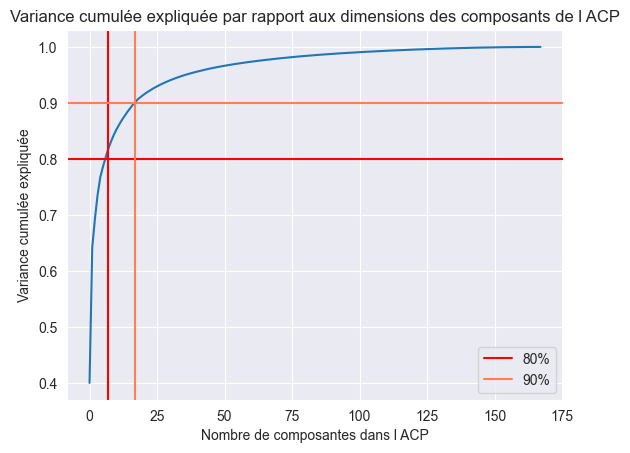

In [20]:
pca = PCA().fit(loading)

plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.axhline(y=0.8,color='red', label='80%')
plt.axvline(x=7,color='red')

plt.axhline(y=0.9,color='coral', label='90%')
plt.axvline(x=17,color='coral')
plt.title('Variance cumulée expliquée par rapport aux dimensions des composants de l ACP')
plt.xlabel('Nombre de composantes dans l ACP')
plt.ylabel('Variance cumulée expliquée') 
plt.legend()
plt.show()

Interprétation : 
* Dans un premier temps, le tableau nous présente la varianxce expliquée pour chaque dimension, ainsi que le pourcentage que cela représente. La dernière colonne nous donne les pourcentages de variances cumulées. En général, on peut se satisfaire de dimension représentant 80% de la variance cumulée. Ici, cela reviendrait à garder 7 composantes principales. Si on souhaite plus de précision, avec 90% de la variance cumulée, on peut alors garder 17 composantes principales. Cependant, on observe que les 2 premières composantes portent beaucoup d'information (64% de la variance cumulée), cela montre que ces 2 composantes portent à elles-seules beaucoup d'information. 

* Le graphique nous permet de vérifier ces observations. On remarque qu'à partir d'un certain seuil (environ 90%), il faut rajouter beaucoup de composantes dans l'ACP pour gagner de l'information sur la variance cumulée.

## 2.3 - Etude des composantes principales

Nous allons construire un nouveau dataframe avec les 7 premiers composantes de l'ACP. Comme présenté ci-dessus, cela nous permettra d'expliquer 80% de la variance. 

In [21]:
# Transformation en DataFrame des résultats de l'ACP
loading_pca = pd.DataFrame({
    "Dim1" : projected[:,0], 
    "Dim2" : projected[:,1],
    "Dim3" : projected[:,2],
    "Dim4" : projected[:,3],
    "Dim5" : projected[:,4],
    "Dim6" : projected[:,5],
    "Dim7" : projected[:,6],
   
})

# Résultat (premières lignes)
loading_pca.head()

,Dim1,Dim2,Dim3,Dim4,Dim5,Dim6,Dim7
0,-0.898351,-2.323003,0.458663,1.478544,-0.898676,0.064386,0.196054
1,2.549737,-3.931784,0.242345,1.073339,-0.461765,0.457613,-0.777379
2,1.051734,1.056763,0.857191,0.939237,-0.981841,-0.143359,-0.610886
3,-0.083203,3.523981,-0.585202,-2.053466,1.582912,-0.248149,0.980354
4,1.381803,2.717041,-0.639688,0.940382,0.599742,1.076949,-0.194704


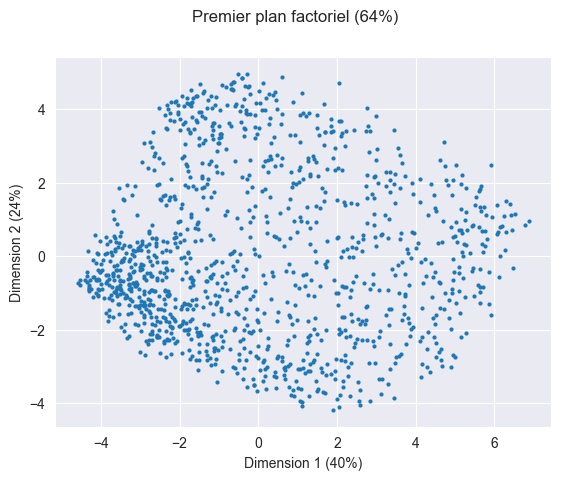

In [22]:
# Affichage de la répartition des données en fonction des 2 premières dimensions

loading_pca.plot.scatter("Dim1", "Dim2", s=4) # nuage de points
plt.xlabel("Dimension 1 (40%)") # modification du nom de l'axe X
plt.ylabel("Dimension 2 (24%)") # idem pour axe Y
plt.suptitle("Premier plan factoriel (64%)") # titre général
plt.show()



Il est maintenant possible de représenter les données sur le premier plan factoriel. Nous avons projeté le nuage des individus sur le premier plan factoriel, c’est-à-dire sur un plan composé des 2 premières composantes principales. Ici, on observe que : 

* Le premier axe (Dimension 1) explique 40% de la variance des données, et le deuxième axe (Dimension 2) en explique 24%. Ensemble, ils représentent 64% de la variance totale des données. Ceci indique que le premier plan factoriel donne une représentation assez informative des données, même si une part non négligeable de la variance reste non expliquée.
* Les points sont dispersés sur le graphe, ce qui suggère qu'il y a de la variabilité dans les données. Idéalement, pour une interprétation plus aisée, on aurait aimé voir des groupes de points distincts, ce qui indiquerait des clusters ou des regroupements naturels au sein des données.

Cependant, ce graphique n'est pas très pertinent et contient beaucoup d'informations supplémentaires qui ne peuvent pas êtres analysées correctement dans notre cas.  

* Bien que 64% ne soit pas un mauvais résultat, on pourrait espérer un pourcentage plus élevé pour une représentation fidèle des données.
* On remarque que les données sont uniformément dispersées et il n'y a pas de pattern visible de groupes ou de tendances. Cela peut indiquer que les deux principales composantes ne capturent pas bien les structures sous-jacentes.
    

## 2.4 - Mise en place d'hypothèses sur la signification des composantes principales

### 2.4.1 - Composante principale 1

On a choisi de conserver les 7 premières composantes principales de l'ACP afin de pouvoir expliquer 80% de la variance. Nous allons maintenant étudier la signification de ces composantes, afin d'améliorer l'interprétation de nos résultats par la suite.

Notre stratégie pour cette partie est la suivante : pour chaque composante principale conservée, nous récupérons les 5 indices des valeurs maximales pour cette composante, idem pour les valeurs minimales. Suite à cela, nous affichons le profil de chargement des stations correspondantes. Ainsi, nous pourrons observer les points communs entre ces stations et émettre des conjectures sur la signification de chaque composante principale. Nous vérifierons nos hypothèses dans une partie ultérieure.

In [23]:
# On récupère les 5 valeurs min et max pour la première composante

max1 = loading_pca["Dim1"].nlargest(5).index
print("Indices des valeurs max")
print(max1)
print("---------")
min1 = loading_pca["Dim1"].nsmallest(5).index
print("Indices des valeurs min")
print(min1)

Indices des valeurs max
Index([1106, 977, 440, 362, 402], dtype='int64')
---------
Indices des valeurs min
Index([996, 84, 904, 1087, 1132], dtype='int64')


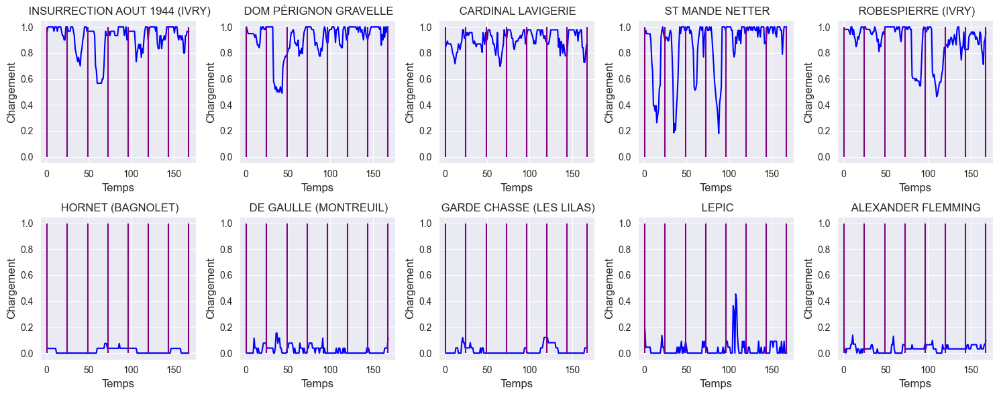

In [24]:
# On affiche l'évolution du chargement des stations correspondant aux indices que nous venons de récupérer

n_steps    = loading.shape[1]  # nombre de pas de temps observés
time_range = np.linspace(1, n_steps, n_steps)  # intervalle de temps observé
time_tick  = np.linspace(1, n_steps, 8)  # début de chaque jour


fig, axs = plt.subplots(2, 5, figsize = (15,6))

for j in range(5):
    k_station = max1[j] # on parcourt les 16 premiers éléments de la liste (de 0 à 15)
    axs[0, j].plot(time_range, loading_data[k_station, :], color = 'blue')
    axs[0, j].vlines(x = time_tick, ymin = 0, ymax = 1, colors = "purple")
    axs[0, j].set_title(coord.names[1 + k_station], fontsize = 12)
    
for j in range(5):
    k_station = min1[j] # on parcourt les 16 premiers éléments de la liste (de 0 à 15)
    axs[1, j].plot(time_range, loading_data[k_station, :], color = 'blue')
    axs[1, j].vlines(x = time_tick, ymin = 0, ymax = 1, colors = "purple")
    axs[1, j].set_title(coord.names[1 + k_station], fontsize = 12)

for ax in axs.flat:
    ax.set_xlabel('Temps', fontsize = 12)
    ax.set_ylabel('Chargement', fontsize = 12)
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)
    
plt.tight_layout()
plt.show()


   * Les 5 graphes situés sur la première rangée représentent les 5 stations correspondant aux plus grandes valeurs de la dimension 1 de notre ACP. On observe que ces 5 stations ont un taux de chargement très elevée. 
   * De même, les 5 graphes de la seconde ligne représentent les stations avec les valeurs les plus petites de la dimension 1. Ces 5 stations sont très peu chargées tout au long de la semaine d'étude.

A partir des graphes affichés, on peut émettre l'hypothèse que la première dimension porte l'information sur le taux de chargement des stations. Plus la dimension 1 est élevée, plus le chargement est important. A l'inverse, plus la dimension 1 est faible et plus la station est vide. On pourrait vérifier cette hypothèse en calculant le chargement moyen et en étudiant la corrélation avec la dimension 1.

### 2.4.2 - Composante principale 2

Nous allons maintenant procéder à la même analyse pour la deuxième composante.

In [25]:
# On récupère les 5 valeurs min et max pour la deuxième composante

max2 = loading_pca["Dim2"].nlargest(5).index
print("Indices des valeurs max")
print(max2)
print("---------")
min2 = loading_pca["Dim2"].nsmallest(5).index
print("Indices des valeurs min")
print(min2)

Indices des valeurs max
Index([1175, 474, 219, 628, 266], dtype='int64')
---------
Indices des valeurs min
Index([1094, 570, 1180, 398, 353], dtype='int64')


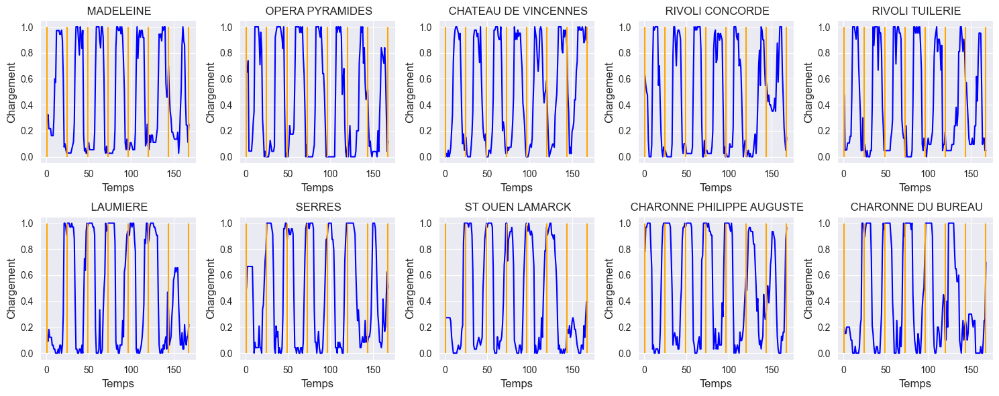

In [26]:
# On affiche l'évolution du chargement des stations correspondant aux indices que nous venons de récupérer

n_steps    = loading.shape[1]  # nombre de pas de temps observés
time_range = np.linspace(1, n_steps, n_steps)  # intervalle de temps observé
time_tick  = np.linspace(1, n_steps, 8)  # début de chaque jour


fig, axs = plt.subplots(2, 5, figsize = (15,6))

for j in range(5):
    k_station = max2[j] # on parcourt les 16 premiers éléments de la liste (de 0 à 15)
    axs[0, j].plot(time_range, loading_data[k_station, :], color = 'blue')
    axs[0, j].vlines(x = time_tick, ymin = 0, ymax = 1, colors = "orange")
    axs[0, j].set_title(coord.names[1 + k_station], fontsize = 12)
    
for j in range(5):
    k_station = min2[j] # on parcourt les 16 premiers éléments de la liste (de 0 à 15)
    axs[1, j].plot(time_range, loading_data[k_station, :], color = 'blue')
    axs[1, j].vlines(x = time_tick, ymin = 0, ymax = 1, colors = "orange")
    axs[1, j].set_title(coord.names[1 + k_station], fontsize = 12)

for ax in axs.flat:
    ax.set_xlabel('Temps', fontsize = 12)
    ax.set_ylabel('Chargement', fontsize = 12)
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)
    
plt.tight_layout()
plt.show()

De manière analogue à l'analyse de la première composante, nous représentons ici l'évolution des taux de chargements des stations correspondants aux 5 indices max et 5 indices min que nous avons récupéré pour la deuxième composante. 

* On remarque sur la première ligne de graphique que les pics correspondant aux valeurs maximales des taux de chargements pour chaque station se trouvent aux milieux des journées, alors que les valeurs les plus faibles se trouvent lors des changements de jours (changements de dates). 
* Sur la deuxième ligne de graphiques, les observations sont inversées : les pics maxima se trouvent aux changements des jours et les pics correspondant aux minima sont au milieu de chaque journée. 

On peut supposer ici que la deuxième composante porte de l'information sur a différence de remplissage des stations entre le jour et la nuit. Une valeur élevée pour la deuxième composante indique que les stations ont un taux de remplissage faible la nuit et élevé la journée. Inversement, une faible valeur pour la deuxième composante pourrait indiquer que les taux de remplissage des stations sont faibles la journée et élevés la nuit. Cette hypothèse pourrait être vérifier à l'aide d'une variable présentant la différence de chargement entre le jour et la nuit. Il faudrait alors étudier l'évolution et les corrélations de cette variable. 

### 2.4.3 - Composante principale 3

Nous réitérons l'analyse avec la troisème composante.

In [27]:
# On récupère les 5 valeurs min et max pour la troisème composante

max3 = loading_pca["Dim3"].nlargest(5).index
print("Indices des valeurs max")
print(max3)
print("")
min3 = loading_pca["Dim3"].nsmallest(5).index
print("Indices des valeurs min")
print(min3)

Indices des valeurs max
Index([1127, 659, 133, 701, 775], dtype='int64')

Indices des valeurs min
Index([750, 1035, 423, 13, 249], dtype='int64')


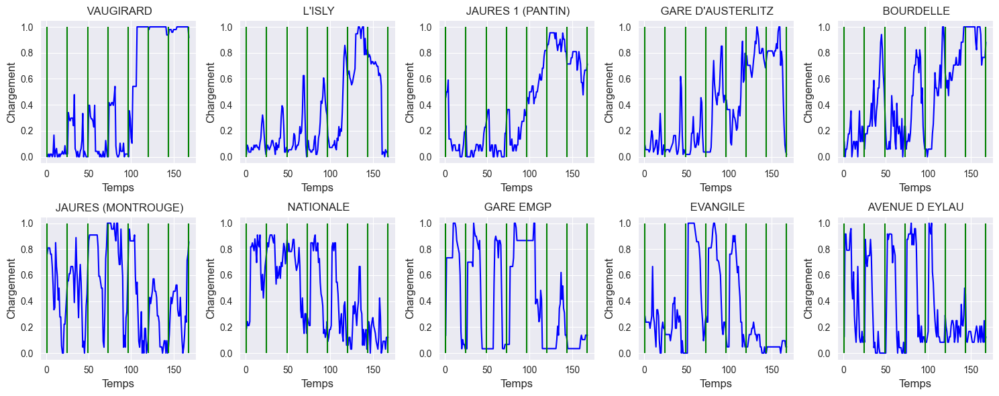

In [28]:
# On affiche l'évolution du chargement des stations correspondant aux indices que nous venons de récupérer

n_steps    = loading.shape[1]  # nombre de pas de temps observés
time_range = np.linspace(1, n_steps, n_steps)  # intervalle de temps observé
time_tick  = np.linspace(1, n_steps, 8)  # début de chaque jour


fig, axs = plt.subplots(2, 5, figsize = (15,6))

for j in range(5):
    k_station = max3[j] # on parcourt les 16 premiers éléments de la liste (de 0 à 15)
    axs[0, j].plot(time_range, loading_data[k_station, :], color = 'blue')
    axs[0, j].vlines(x = time_tick, ymin = 0, ymax = 1, colors = "green")
    axs[0, j].set_title(coord.names[1 + k_station], fontsize = 12)
    
for j in range(5):
    k_station = min3[j] # on parcourt les 16 premiers éléments de la liste (de 0 à 15)
    axs[1, j].plot(time_range, loading_data[k_station, :], color = 'blue')
    axs[1, j].vlines(x = time_tick, ymin = 0, ymax = 1, colors = "green")
    axs[1, j].set_title(coord.names[1 + k_station], fontsize = 12)

for ax in axs.flat:
    ax.set_xlabel('Temps', fontsize = 12)
    ax.set_ylabel('Chargement', fontsize = 12)
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)
    
    
plt.tight_layout()
plt.show()

Toujours dans la même démarche que précedemment, nous représentons ici l'évolution des taux de chargements des stations correspondants aux 5 indices max et 5 indices min que nous avons récupéré pour la troisième composante. 
* Sur la première ligne, on a représenté les stations correspondant aux indices des 5 valeurs les plus élevées pour la dimension 3. On observe que le taux de chargement des stations sur cette ligne est globalement moyen à faible en semaine et élevé lors des week-ends. 
* Sur la deuxième ligne, on a représenté les stations correspondant aux indices des 5 valeurs les plus faibles pour la dimension 3. On observe que le taux de chargement des stations sur cette ligne est globalement moyen à faible durant les week-ends et élevé en semaines. 

On peut faire la supposition que la troisème composante représente la différence de chargement entre jours travaillés et week-ends d'une station. Une valeur élevée pour la troisème dimension pourrait indiquer que les stations sont assez peu chargées en semaine et pleines durant les week-ends. Inversement, une faible valeur pour la dimension 3 pourrait signifier que les stations présentent de la disponibilité en semaine et sont plus sollicitées lors des week-ends. On pourrait étudier la véracité de cette hypothèse en créant une nouvelle variable et en procédant à une étude, comme présenté pour l'hypothèse sur la deuxième composante.

### 2.4.4 - Composante principale 4

Nous réitérons l'analyse avec la quatrième composante.

In [29]:
# On récupère les 5 valeurs min et max pour la quatrième composante

max4 = loading_pca["Dim4"].nlargest(5).index
print("Indices des valeurs max")
print(max4)
print("")
min4 = loading_pca["Dim4"].nsmallest(5).index
print("Indices des valeurs min")
print(min4)

Indices des valeurs max
Index([669, 206, 222, 184, 210], dtype='int64')

Indices des valeurs min
Index([434, 1127, 416, 1097, 844], dtype='int64')


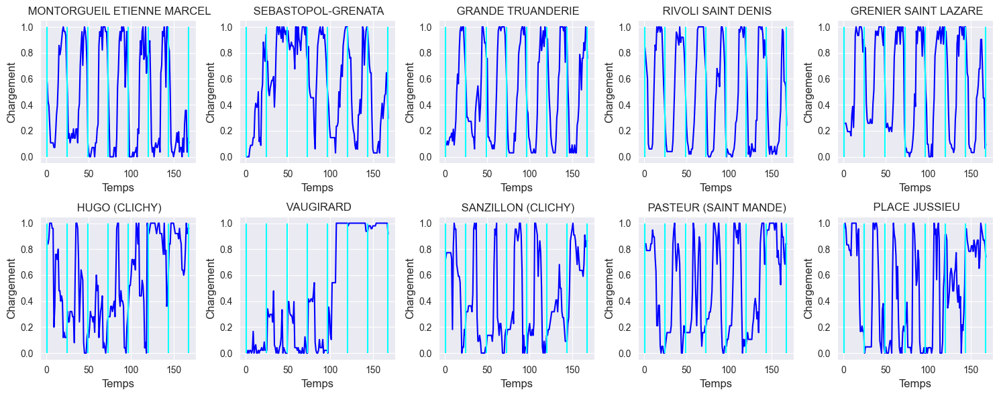

In [30]:
# On affiche l'évolution du chargement des stations correspondant aux indices que nous venons de récupérer

n_steps    = loading.shape[1]  # nombre de pas de temps observés
time_range = np.linspace(1, n_steps, n_steps)  # intervalle de temps observé
time_tick  = np.linspace(1, n_steps, 8)  # début de chaque jour


fig, axs = plt.subplots(2, 5, figsize = (15,6))

for j in range(5):
    k_station = max4[j] # on parcourt les 16 premiers éléments de la liste (de 0 à 15)
    axs[0, j].plot(time_range, loading_data[k_station, :], color = 'blue')
    axs[0, j].vlines(x = time_tick, ymin = 0, ymax = 1, colors = "cyan")
    axs[0, j].set_title(coord.names[1 + k_station], fontsize = 12)
    
for j in range(5):
    k_station = min4[j] # on parcourt les 16 premiers éléments de la liste (de 0 à 15)
    axs[1, j].plot(time_range, loading_data[k_station, :], color = 'blue')
    axs[1, j].vlines(x = time_tick, ymin = 0, ymax = 1, colors = "cyan")
    axs[1, j].set_title(coord.names[1 + k_station], fontsize = 12)

for ax in axs.flat:
    ax.set_xlabel('Temps', fontsize = 12)
    ax.set_ylabel('Chargement', fontsize = 12)
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)
    
    
plt.tight_layout()
plt.show()

In [31]:
# On va étudier les noms des stations en altitude, c'est à dire où la valeur dans la colonne 'Bonus' vaut 1

bonus_stations = coord[coord['bonus'] == 1]
print(bonus_stations)

nom_station_recherche = 'VAUGIRARD'

# Remplacez 'nom_colonne' par le nom réel de la colonne qui contient les noms des stations dans votre dataframe
est_present = nom_station_recherche in bonus_stations['bonus'].values

print(est_present)

      longitude   latitude  bonus                          names hill
11     2.400977  48.867925      1                      PELLEPORT    1
36     2.296008  48.830269      1                        J DUPRE    1
46     2.392961  48.875518      1   BELLEVILLE PRE SAINT GERVAIS    1
59     2.382592  48.875070      1                  SIMON BOLIVAR    1
85     2.432975  48.868812      1          DE GAULLE (MONTREUIL)    1
...         ...        ...    ...                            ...  ...
1133   2.403179  48.881770      1             ALEXANDER FLEMMING    1
1147   2.413240  48.873338      1                   NOISY LE SEC    1
1153   2.336710  48.806380      1               DOUMER (ARCUEIL)    1
1169   2.395040  48.869413      1                       PYRENEES    1
1187   2.314630  48.811102      1    GEORGES MESSIER (MONTROUGE)    1

[127 rows x 5 columns]
False


Nous avons cherché si toutes les stations présentes dans une même ligne du graphique étaient des stations en altitude. Cependant, les stations de la première colonne du graphique se situent en plaine. Cette hypothèse n'est pas possible. De plus, nous avons déjà émis des hypothèses sur le taux de chargement moyen, l'alternance entre le jour et la nuit et l'alternance entre jours travaillés et week-ends. Puisque la quatrième composante principale ne correspond pas forcément au fait qu'une station se trouve ou non en altitude, nous avons étudiés les significations principales possibles des composantes principales.

On observe des pics en fin de journée sur la première rangée de graphique et des creux en début de journée. Sur la deuxième ligne de graphique, on constate que les pics sont visibles en début de journée et les creux en fin de journée. On pourrait donc supposer que la quatrième composante principale symbolise l'alternance entre le matin et l'après-midi dans une journée.

### 2.4.5 - Composante principale 5

In [32]:
# On récupère les 5 valeurs min et max pour la cinquième composante

max5 = loading_pca["Dim5"].nlargest(5).index
print("Indices des valeurs max")
print(max5)
print("")
min5 = loading_pca["Dim5"].nsmallest(5).index
print("Indices des valeurs min")
print(min5)

Indices des valeurs max
Index([1055, 295, 9, 425, 821], dtype='int64')

Indices des valeurs min
Index([349, 430, 495, 780, 565], dtype='int64')


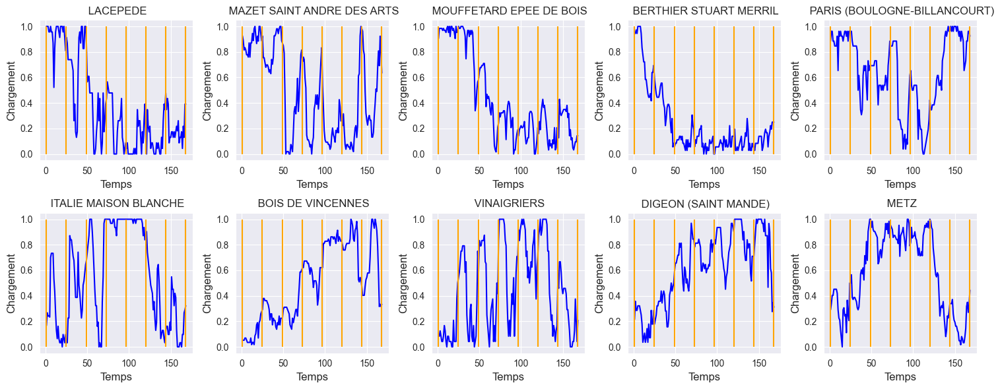

In [33]:
# On affiche l'évolution du chargement des stations correspondant aux indices que nous venons de récupérer

n_steps    = loading.shape[1]  # nombre de pas de temps observés
time_range = np.linspace(1, n_steps, n_steps)  # intervalle de temps observé
time_tick  = np.linspace(1, n_steps, 8)  # début de chaque jour


fig, axs = plt.subplots(2, 5, figsize = (15,6))

for j in range(5):
    k_station = max5[j] # on parcourt les 16 premiers éléments de la liste (de 0 à 15)
    axs[0, j].plot(time_range, loading_data[k_station, :], color = 'blue')
    axs[0, j].vlines(x = time_tick, ymin = 0, ymax = 1, colors = "orange")
    axs[0, j].set_title(coord.names[1 + k_station], fontsize = 12)
    
for j in range(5):
    k_station = min5[j] # on parcourt les 16 premiers éléments de la liste (de 0 à 15)
    axs[1, j].plot(time_range, loading_data[k_station, :], color = 'blue')
    axs[1, j].vlines(x = time_tick, ymin = 0, ymax = 1, colors = "orange")
    axs[1, j].set_title(coord.names[1 + k_station], fontsize = 12)

for ax in axs.flat:
    ax.set_xlabel('Temps', fontsize = 12)
    ax.set_ylabel('Chargement', fontsize = 12)
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)
    
    
plt.tight_layout()
plt.show()


Sur les 5 premiers graphiques, on remarque que le taux de chargement moyen des stations est plus important en début de semaine qu'en fin de semaine, particulièrement les lundis et mardis. A l'inverse, sur les 5 derniers graphiques, les stations sont beaucoup moins chargées, voir vides sur ces mêmes jours. En fin de semaine (du mercredi au vendredi), on remarque que les 5 premières stations sont beaucoup moins remplies. A l'inverse, les 5 dernières stations présente un taux de chargement moyen plus élevé sur ces mêmes jours. On peut donc émettre l'hypothèse que la 5ème composante représente la différence de chargement entre lundi/mardi et mercredi/jeudi/vendredi. 

Il se pourrait que ces phénomènes soient liés dans certains cas au déplacement de vélos à partir ou en direction de la station correspondante par du personnel de gestion des Velib.

Pour confirmer cette hypothèse, nous allons créer une variable représentant le taux de chargement moyen sur lundi/mardi et une autre sur mercredi/jeudi/vendredi et étudier la corrélation avec la 5ème composante. 

### 2.4.6 - Composante principale 6

In [34]:
# On récupère les 5 valeurs min et max pour la sixième composante

max6 = loading_pca["Dim6"].nlargest(5).index
print("Indices des valeurs max")
print(max6)
print("")
min6 = loading_pca["Dim6"].nsmallest(5).index
print("Indices des valeurs min")
print(min6)

Indices des valeurs max
Index([40, 1040, 727, 872, 903], dtype='int64')

Indices des valeurs min
Index([337, 1133, 1157, 1187, 566], dtype='int64')


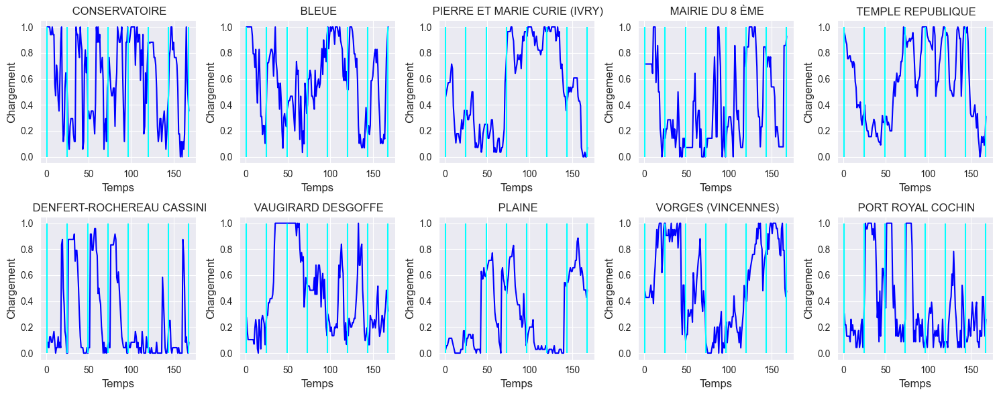

In [35]:
# On affiche l'évolution du chargement des stations correspondant aux indices que nous venons de récupérer

n_steps    = loading.shape[1]  # nombre de pas de temps observés
time_range = np.linspace(1, n_steps, n_steps)  # intervalle de temps observé
time_tick  = np.linspace(1, n_steps, 8)  # début de chaque jour


fig, axs = plt.subplots(2, 5, figsize = (15,6))

for j in range(5):
    k_station = max6[j] # on parcourt les 16 premiers éléments de la liste (de 0 à 15)
    axs[0, j].plot(time_range, loading_data[k_station, :], color = 'blue')
    axs[0, j].vlines(x = time_tick, ymin = 0, ymax = 1, colors = "cyan")
    axs[0, j].set_title(coord.names[1 + k_station], fontsize = 12)
    
for j in range(5):
    k_station = min6[j] # on parcourt les 16 premiers éléments de la liste (de 0 à 15)
    axs[1, j].plot(time_range, loading_data[k_station, :], color = 'blue')
    axs[1, j].vlines(x = time_tick, ymin = 0, ymax = 1, colors = "cyan")
    axs[1, j].set_title(coord.names[1 + k_station], fontsize = 12)

for ax in axs.flat:
    ax.set_xlabel('Temps', fontsize = 12)
    ax.set_ylabel('Chargement', fontsize = 12)
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)
    
    
plt.tight_layout()
plt.show()

Il n'y a pas de tendance remarquable qui se dégage clairement comme c'était le cas pour les composantes principales. Il pourrait être judicieux de tester si cette composante pourrait représenter l'altitude. Une valeur élevée pourrait signifier une caractéristique vis-à-vis de l'altitude (station en altitude, ou l'inverse). Nous vérifierons cette hypothèse ultérieurement.

### 2.4.7 - Composante principale 7

In [36]:
# On récupère les 5 valeurs min et max pour la septième composante

max7 = loading_pca["Dim7"].nlargest(5).index
print("Indices des valeurs max")
print(max7)
print("")
min7 = loading_pca["Dim7"].nsmallest(5).index
print("Indices des valeurs min")
print(min7)

Indices des valeurs max
Index([476, 551, 903, 415, 885], dtype='int64')

Indices des valeurs min
Index([833, 213, 17, 438, 806], dtype='int64')


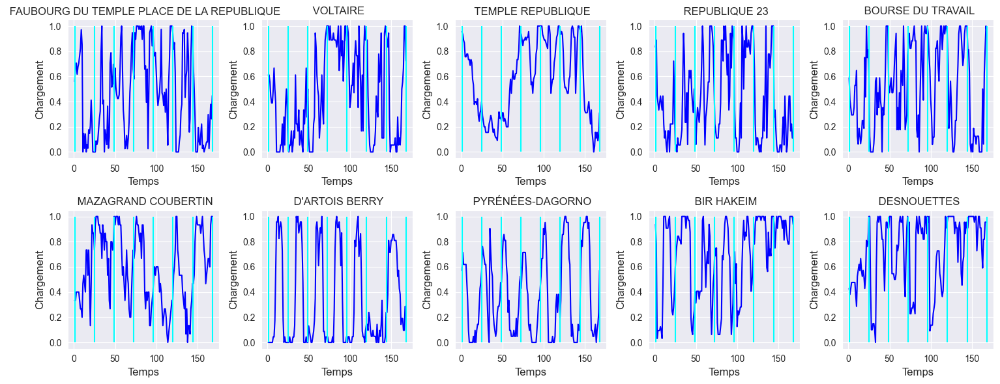

In [37]:
# On affiche l'évolution du chargement des stations correspondant aux indices que nous venons de récupérer

n_steps    = loading.shape[1]  # nombre de pas de temps observés
time_range = np.linspace(1, n_steps, n_steps)  # intervalle de temps observé
time_tick  = np.linspace(1, n_steps, 8)  # début de chaque jour


fig, axs = plt.subplots(2, 5, figsize = (15,6))

for j in range(5):
    k_station = max7[j] # on parcourt les 16 premiers éléments de la liste (de 0 à 15)
    axs[0, j].plot(time_range, loading_data[k_station, :], color = 'blue')
    axs[0, j].vlines(x = time_tick, ymin = 0, ymax = 1, colors = "cyan")
    axs[0, j].set_title(coord.names[1 + k_station], fontsize = 12)
    
for j in range(5):
    k_station = min7[j] # on parcourt les 16 premiers éléments de la liste (de 0 à 15)
    axs[1, j].plot(time_range, loading_data[k_station, :], color = 'blue')
    axs[1, j].vlines(x = time_tick, ymin = 0, ymax = 1, colors = "cyan")
    axs[1, j].set_title(coord.names[1 + k_station], fontsize = 12)

for ax in axs.flat:
    ax.set_xlabel('Temps', fontsize = 12)
    ax.set_ylabel('Chargement', fontsize = 12)
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)
    
    
plt.tight_layout()
plt.show()

On peut faire la même analyse que pour la sixième composante principale. Il n'y a pas de tendance remarquable qui se dégage clairement comme c'était le cas pour les composantes principales. Il pourrait être judicieux de tester si cette composante pourrait représenter l'altitude. Une valeur élevée pourrait signifier une caractéristique vis-à-vis de l'altitude (station en altitude, ou l'inverse). Nous vérifierons cette hypothèse ultérieurement.

### 2.4.8 - Test d'un éventuel lien avec l'altitude

Dans cette sous-partie nous allons tester un éventuel lien entre les dimensions de notre ACP et le caractère 'Bonus' lié à l'altitude. Nous allons pour cela calculer les valeurs moyennes selon chaque composante des stations en altitude. Une valeur absolue éloignée de 0 indiquerait un lien important entre l'altitude et la composante correspondante, tandis qu'une valeur proche de 0 indique qu'il n'y a probablement pas de lien entre l'altitude et la composante.

In [38]:
# On va étudier les noms des stations en altitude, c'est à dire où la valeur dans la colonne 'Bonus' vaut 1

bonus_stations = coord[coord['bonus'] == 1]

# On réupère ensuite les valeurs de l'ACP pour les différentes composantes, et calculer les valeurs moyennes pour essayer de voir le lien avec l'altitude

bonus_stations_PCA=loading_pca.iloc[bonus_stations.index,:]

print("Valeur moyenne des stations en altitude sur chaque composante :")
print(bonus_stations_PCA.mean())

Valeur moyenne des stations en altitude sur chaque composante :
Dim1    0.036258
Dim2    0.251761
Dim3   -0.076079
Dim4    0.025384
Dim5    0.045720
Dim6   -0.032868
Dim7   -0.000189
dtype: float64


Nous n'observons pas de lien suffisament significatif entre les valeurs dans chaque composante et l'altitude des stations pour que ce soit une hypothèse importante. La corrélation positive un peu plus importante avec la composante 2, qui indique que les stations en altitude sont plus remplies en journée que la nuit, est possiblement lié à la présence de plus de quartiers de bureau en altitude à Paris que de quartiers résidentiel.

## 2.5 - Vérification des hypothèses

### 2.5.1 - Introduction de la méthode

Dans cette partie, nous allons introduire de nouvelles variables découlant des hypothèses sur la signification de nos composantes principales. L'objectif est de tester les corrélations entre les composantes retenues et les nouvelles variables introduites. Ainsi, nous pourrons valider, ou non, nos hypothèses. Pour ce faire, nous allons définir : 
* load_mean : Variable représentant le taux de chargement moyen pour l'hypothèse 1
* diff_jn : Variable représentant la différence de chargement moyen entre le jour et la nuit pour l'hypoyhèse 2
* diff_tw : Variable représentant la différence de chargement moyen entre les jours travaillés et les week-ends pour l'hypoyhèse 3
* diff_ms : Variable représentant la différence de chargement moyen entre le matin et la fin de journée (après-midi et soir) pour l'hypothèse 4 
* diff_df : Variable représentant la différence de chargement moyen entre le début et la fin de la semaine pour l'hypothèse 5

Pour calibrer la variable jour/nuit, nous avons utilisé le graphique superposant les boxplots pour chaque heure de la semaine. On a étudié les temps marquant une rupture entre les moments du jour et de la nuit. Cette rupture est visible avec des pics plus bas observés sur les troisièmes quantiles des boxplots, et confirmée par les valeurs des médianes. Ainsi, on considère une plage de jour allant de 10h à 17h (ce qui cohérent avec les heures de bureau) et une plage de nuit entre 22h à 7h. Entre 18h et 22h, le chargement des stations est plus bas car la mobilité est importante sur ce créneau. Pour la variable matin/soir, nous avons observé de manière similaire un intervalle 6h-11h pour le matin, et 14h-24h pour le soir. Enfin pour la dernière hypothèse sur variable 5 : lundi-mardi contre mercredi-jeudi-vendredi.

In [39]:
# Définition des nouvelles variables
# ---------------------------------

# Chargement moyen 
# ---------------------------------
load_mean = loading.mean(axis=1)

# Différence de chargement moyen entre le jour et la nuit
# ---------------------------------
# nuit : 22h-7h  (ou 21h-7h)  jour : 10h-17h

data_jour=[j+24*i for i in range(7) for j in range(10,18)]
data_nuit=[j+24*i for i in range(7) for j in list(range(8)) + [22,23]]
#print(data_jour)
#print(data_nuit)

diff_jn = loading[loading.columns[data_jour]].mean(axis=1)-loading[loading.columns[data_nuit]].mean(axis=1)
#print(diff_jn)

# Différence de chargement moyen entre les jours travaillés et les week-ends
# ---------------------------------
# weekend : vendredi 20h -> dimanche 20h  semaine : lundi 10h -> vendredi 17h
data_weekend=list(range(4*24+20,6*24+21))
data_week=list(range(10,4*24+18))

diff_tw = loading[loading.columns[data_week]].mean(axis=1)-loading[loading.columns[data_weekend]].mean(axis=1)

# Différence de chargement moyen entre le matin et les fins de journées
# ---------------------------------
# matin : 6h-11h   fin journée : 14h-00h

data_matin=[j+24*i for i in range(7) for j in range(6,11)]
data_soir=[j+24*i for i in range(7) for j in list(range(14,23)) + [0]]

diff_ms = loading[loading.columns[data_matin]].mean(axis=1)-loading[loading.columns[data_soir]].mean(axis=1)

# Différence de chargement moyen entre début et fin de semaine
# ---------------------------------
# début : lundi et mardi    fin : mercredi-vendredi

data_debut=list(range(48))
data_fin=list(range(48,120))

diff_df = loading[loading.columns[data_debut]].mean(axis=1)-loading[loading.columns[data_fin]].mean(axis=1)

Une fois nos variables définies, nous allons afficher, pour chaque variable introduite, la correspondance avec la composante principale associée. Nous espérons pouvoir observer des corrélations. Cela permettrait la validation, ou dans le cas contraire le rejet, de nos hypothèses établies dans la partie précédente.

Avant de calculer les corrélations, nous allons afficher nos 5 premières composantes en fonction de la variable créée correspondante. Si le nuage de point des stations s'approche d'une droite, cela signifie qu'il existe un lien linéaire très fort entre la composante et la variable en question.

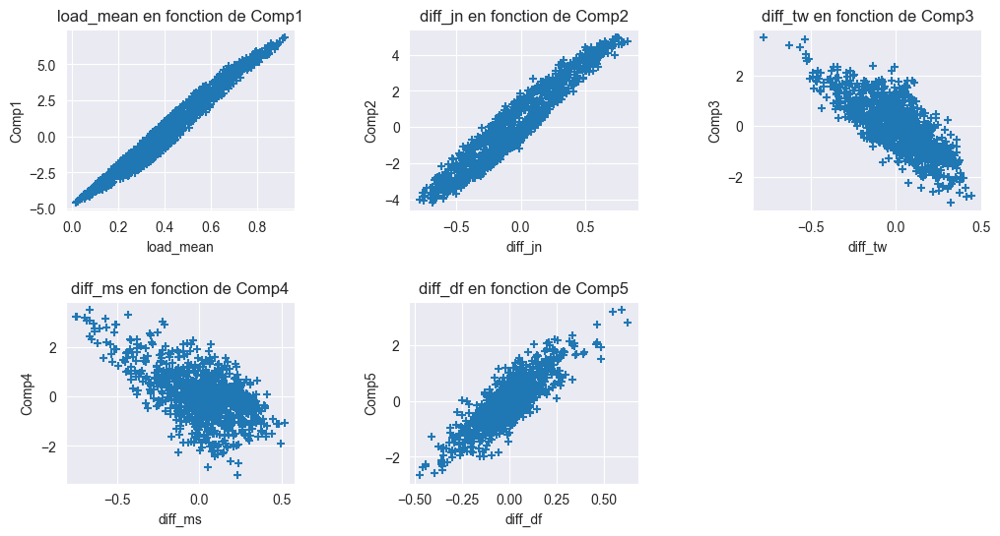

In [40]:
plt.figure(figsize=(12,6))

plt.subplot(231)
plt.scatter(load_mean,loading_pca["Dim1"],marker='+')
plt.title("load_mean en fonction de Comp1")
plt.xlabel('load_mean')
plt.ylabel('Comp1')

plt.subplot(232)
plt.scatter(diff_jn,loading_pca["Dim2"],marker='+')
plt.title("diff_jn en fonction de Comp2")
plt.xlabel('diff_jn')
plt.ylabel('Comp2') 

plt.subplot(233)
plt.scatter(diff_tw,loading_pca["Dim3"],marker='+')
plt.title("diff_tw en fonction de Comp3")
plt.xlabel('diff_tw')
plt.ylabel('Comp3') 

plt.subplot(234)
plt.scatter(diff_ms,loading_pca["Dim4"],marker='+')
plt.title("diff_ms en fonction de Comp4")
plt.xlabel('diff_ms')
plt.ylabel('Comp4') 

plt.subplot(235)
plt.scatter(diff_df,loading_pca["Dim5"],marker='+')
plt.title("diff_df en fonction de Comp5")
plt.xlabel('diff_df')
plt.ylabel('Comp5') 

# Ajuster les marges horizontales entre les subplots
plt.subplots_adjust(wspace=0.5,hspace=0.5)

plt.show()

Pour chacune des 3 premières variables introduites et pour la cinquième, on observe une corrélation forte avec la dimension de l'ACP associée, qui se traduit par une tendance linéaire clairement identifiable. Cette tendance est particulièrement marquée pour les 2 premières composantes principales et est également marquée pour la troisième et la cinquième composante. Comme un nuage de points fin et allongé indique une corrélation importante : nous pouvons valider nos hypothèses émises précedemment.

Pour la variable associée à la dimension 4, la tendance linéaire est moins marquée, mais on la devine quand même. On en déduit que si notre hypothèse reste valide pour cette dimension, ce n'est pas le seul élément que cette composante représente.

### 2.5.2 - Etude des corrélations avec les nouvelles variables

On va maintenant calculer les corrélations et les représenter sous forme d'un tableau. On va d'abord étudier les corrélations des composantes de l'ACP avec les variables nouvellement crées, puis avec nos 168 variables initiales, qui représentent le chargement à chaque heure de chaque jour de la semaine, afin de vérifier les plages horaires choisies.

In [41]:
# On va créer un DataFrame avec les composantes principales et les 5 variables créées 

# On créer le dataframe data1
data1 = pd.concat([load_mean,diff_jn,diff_tw,diff_ms,diff_df,loading_pca["Dim1"].shift(),loading_pca["Dim2"].shift(),loading_pca["Dim3"].shift(),loading_pca["Dim4"].shift(),loading_pca["Dim5"].shift()],axis=1)

# On utilise .shift sur les donénes de loading_pca car les données démarrent à 0, alors que data1 démarre à 1.
data1.columns=["Load mean","Diff jour-nuit","Diff semaine-we","Diff matin-soir","Diff debut-fin semaine","Dim1","Dim2","Dim3","Dim4","Dim5"]
print(data1.head())

# On construit une matrice de corrélation avec des valeurs 

cormat1 = data1.corr()
round(cormat1,2)


   Load mean  Diff jour-nuit  Diff semaine-we  Diff matin-soir  \
1   0.277860       -0.330065         0.064797         0.016020   
2   0.506223       -0.693012        -0.054610         0.165810   
3   0.466758        0.089350        -0.034952        -0.204947   
4   0.434604        0.493424        -0.046685         0.089162   
5   0.529899        0.244339         0.187231        -0.191223   

   Diff debut-fin semaine      Dim1      Dim2      Dim3      Dim4      Dim5  
1               -0.182364 -0.898351 -2.323003  0.458663  1.478544 -0.898676  
2               -0.076389  2.549737 -3.931784  0.242345  1.073339 -0.461765  
3               -0.022371  1.051734  1.056763  0.857191  0.939237 -0.981841  
4                0.246505 -0.083203  3.523981 -0.585202 -2.053466  1.582912  
5                0.139488  1.381803  2.717041 -0.639688  0.940382  0.599742  


,Load mean,Diff jour-nuit,Diff semaine-we,Diff matin-soir,Diff debut-fin semaine,Dim1,Dim2,Dim3,Dim4,Dim5
Load mean,1.00,-0.11,-0.33,-0.15,0.05,0.99,0.16,-0.06,0.00,-0.01
Diff jour-nuit,-0.11,1.00,0.24,-0.57,0.21,-0.27,0.95,0.01,-0.04,-0.08
Diff semaine-we,-0.33,0.24,1.00,-0.01,0.03,-0.41,0.17,-0.76,0.46,0.01
Diff matin-soir,-0.15,-0.57,-0.01,1.00,-0.23,-0.07,-0.65,-0.45,-0.57,-0.09
Diff debut-fin semaine,0.05,0.21,0.03,-0.23,1.00,0.01,0.27,0.02,0.00,0.84
Dim1,0.99,-0.27,-0.41,-0.07,0.01,1.00,-0.00,0.00,0.00,-0.00
Dim2,0.16,0.95,0.17,-0.65,0.27,-0.00,1.00,0.00,0.00,-0.00
Dim3,-0.06,0.01,-0.76,-0.45,0.02,0.00,0.00,1.00,-0.00,0.00
Dim4,0.00,-0.04,0.46,-0.57,0.00,0.00,0.00,-0.00,1.00,0.00
Dim5,-0.01,-0.08,0.01,-0.09,0.84,-0.00,-0.00,0.00,0.00,1.00


On observe des corrélations assez importantes en accord avec ce qui a été vu précédemment. Il y a une corrélation très élevée entre 'Load mean' et la dimension 1 avec une valeur de 0.99. De la même manière, il y a une corrélation très prononcée entre 'Diff jour-nuit' et la deuxième dimension, avec une valeur de 0.95. On observe également une corrélation négative assez importante entre 'Diff semaine-we' et la troisèeme composante principale, qui confirme notre hypothèse.

On remarque aus des corrélations qui valent 0 entre les différentes composantes. Ce résultat est cohérent avec la construction des composnates qui sont orthogonales entre elles.


<Axes: >

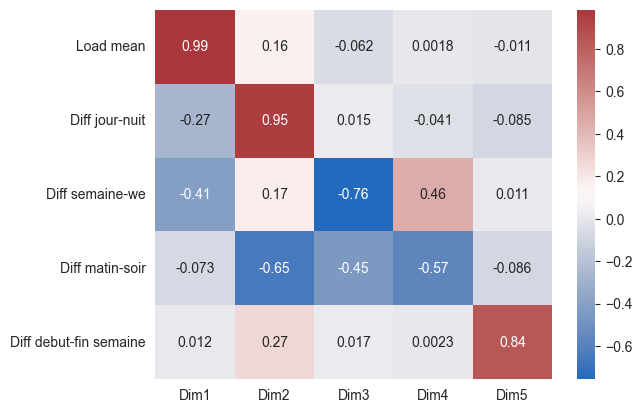

In [42]:
# Affichage de la matrice de corrélations en couleur
sns.heatmap(cormat1.iloc[:5,5:10],annot=True,cmap=sns.color_palette("vlag", as_cmap=True))

Les valeurs de corrélation vont de -1 à 1, où -1 indique une corrélation négative parfaite, 0 aucune corrélation et 1 une corrélation positive parfaite. Les couleurs allant du bleu au rouge indiquent la force et la direction de la corrélation (bleu pour les valeurs négatives et rouge pour les valeurs positives). Sur cette matrice, on observe que : 

- Load mean a une forte corrélation positive avec Dim1 (0.99), ce qui indique que cette dimension est principalement associée avec la moyenne de chargement des stations.
- De même, Diff jour-nuit est fortement corrélée avec Dim2 (0.95), ce qui suggère que cette dimension reflète les variations du taux de chargement entre le jour et la nuit.
- On voit que Diff semaine-we montre une forte corrélation négative avec Dim3 (-0.76), impliquant que cette dimension pourrait représenter la différence de chargement entre les jours de semaine et le weekend.
- Diff matin-soir est assez significativement corrélée négativement avec Dim2 (-0.65) et Dim4 (-0.57), ce qui laisse penser que ces dimensions pourraient être liées aux variations du taux de chargement entre le matin et le soir. Ce résultat est cohérent car on est très proche de l'alternance entre le jour et la nuit.
- Enfin, Diff début-fin semaine présente une forte corrélation positive avec Dim5 (0.84), ce qui nous laisse à penser que cette dimension pourrait capturer les variations entre le début et la fin de semaine.

Finalement, cette matrice confirme les observations sur le précédent graphique et permet la validation de nos hypothèses quant aux significations des composantes principales de l'ACP. Pour résumer, on a donc :

* Dim1 est fortement influencée par la moyenne de chargement des stations.
* Dim2 est principalement liée aux différences de chargement entre le jour et la nuit, et dans une moindre mesure, le matin et le soir.
* Dim3 est influencée négativement par la différence de chargement entre la semaine et le weekend.
* Dim4 semble avoir une relation négative plus modérée avec la variation matin-soir.
* Dim5 est principalement définie par la différence de chargement entre le début et la fin de semaine.

### 2.5.3 - Etude des corrélations avec les heures et les jours de la semaine

In [43]:
# On va créer un DataFrame avec les composantes principales en fonction des heures et des jours

# On créer le dataframe data2
data2 = pd.concat([loading_pca["Dim1"],loading_pca["Dim2"],loading_pca["Dim3"],loading_pca["Dim4"],loading_pca["Dim5"],loading_pca["Dim6"],loading_pca["Dim7"]],axis=1)

data2.columns=["Dim1","Dim2","Dim3","Dim4","Dim5","Dim6","Dim7"]
for i in range(168):
    data2.insert(i,str(i),loading_data[:,i])
    data2=data2.copy()

# On construit une matrice de corrélation avec les valeurs

cormat2 = data2.corr()
round(cormat2,2)


,0,1,2,3,4,5,6,7,8,9,...,165,166,167,Dim1,Dim2,Dim3,Dim4,Dim5,Dim6,Dim7
0,1.00,0.94,0.88,0.86,0.82,0.77,0.77,0.76,0.73,0.57,...,0.64,0.66,0.67,0.74,0.07,-0.05,-0.05,0.45,0.20,0.10
1,0.94,1.00,0.94,0.92,0.87,0.83,0.83,0.81,0.78,0.55,...,0.60,0.63,0.64,0.73,0.00,-0.12,-0.07,0.47,0.22,0.15
2,0.88,0.94,1.00,0.98,0.93,0.89,0.88,0.87,0.82,0.53,...,0.56,0.59,0.61,0.70,-0.06,-0.19,-0.09,0.49,0.23,0.20
3,0.86,0.92,0.98,1.00,0.96,0.91,0.90,0.89,0.83,0.52,...,0.56,0.59,0.61,0.70,-0.09,-0.20,-0.11,0.49,0.23,0.20
4,0.82,0.87,0.93,0.96,1.00,0.96,0.95,0.94,0.87,0.50,...,0.53,0.57,0.59,0.68,-0.12,-0.24,-0.12,0.49,0.22,0.24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Dim3,-0.05,-0.12,-0.19,-0.20,-0.24,-0.27,-0.27,-0.27,-0.26,-0.24,...,0.15,0.13,0.10,-0.00,0.00,1.00,-0.00,0.00,-0.00,0.00
Dim4,-0.05,-0.07,-0.09,-0.11,-0.12,-0.12,-0.12,-0.13,-0.16,-0.20,...,-0.12,-0.14,-0.18,0.00,-0.00,-0.00,1.00,0.00,0.00,0.00
Dim5,0.45,0.47,0.49,0.49,0.49,0.49,0.48,0.47,0.42,0.27,...,0.20,0.21,0.19,-0.00,-0.00,0.00,0.00,1.00,-0.00,0.00
Dim6,0.20,0.22,0.23,0.23,0.22,0.21,0.20,0.19,0.15,0.09,...,-0.02,0.03,0.05,0.00,0.00,-0.00,0.00,-0.00,1.00,0.00


Ce DataFrame n'est pas très lisible, nous décidons de représenter graphiquement chaque dimension au cours du temps. Sur le graphique ci-dessous, les lignes verticales oranges sont présentes toutes les 24 heures et marquent l'alternance entre les jours de la semaine.

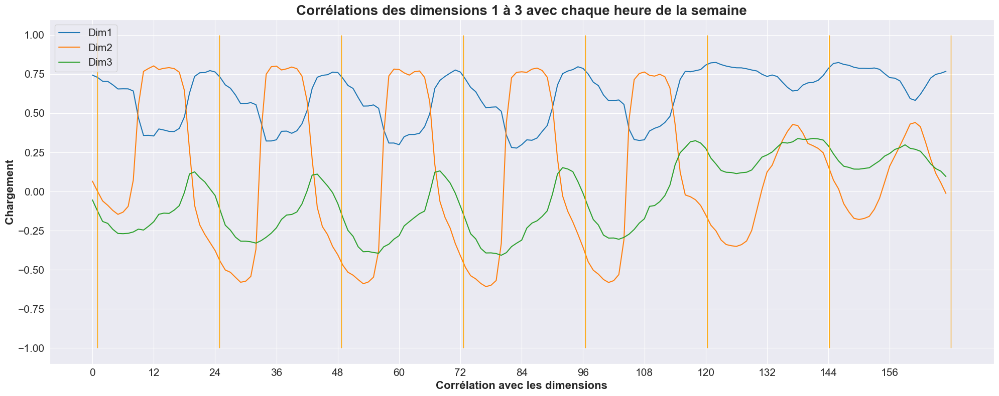

In [44]:
plt.figure(figsize=(20,8))

plt.plot(cormat2['Dim1'].iloc[:168],label="Dim1")
plt.plot(cormat2['Dim2'].iloc[:168],label="Dim2")
plt.plot(cormat2['Dim3'].iloc[:168],label="Dim3")
    
plt.vlines(x = time_tick, ymin = -1, ymax = 1, colors = "Orange", linewidth = 1) 
# time_tick, déjà défini et correspond aux jours

plt.xlabel('Corrélation avec les dimensions', fontsize = 16, fontweight='demibold')
plt.ylabel('Chargement', fontsize = 16, fontweight='demibold')
plt.title("Corrélations des dimensions 1 à 3 avec chaque heure de la semaine", fontsize = 20, fontweight='bold')
plt.xticks(ticks = np.arange(0, 168, 12), labels=np.arange(0, 168, 12), fontsize = 15)
plt.yticks(fontsize = 15)
plt.legend(fontsize = 15)

plt.tight_layout()
plt.show()

Ce graphique représente la corrélation entre les trois premières dimensions de votre ACP (Dim1, Dim2, Dim3) et chaque heure de la semaine.

Sur la Dim1 (en bleu), les variations importantes pourraient indiquer des moments spécifiques où la moyenne de chargement est très différente. Les pics positifs indiquent les heures où la moyenne de chargement est la plus élevée, tandis que les creux négatifs indiquent les heures les plus faibles. On y observe un cycle régulier, ce qui pourrait correspondre à des motifs récurrents comme les heures de pointe. Cela consolide l'hypothèse d'utilisation cyclique pendualire des vélos.

Sur la Dim2 (en orange), la nature cyclique de cette courbe suggère qu'elle capture bien les variations entre le jour et la nuit. Les pics de corrélation positive pourraient correspondre aux heures diurnes, où les stations Vélib sont plus fréquentées, et les cureux de corrélation négative aux heures nocturnes. Les pics du motifs permettent de valider le choix de la plage horaire faite lors de la définition de la variable associée.

Sur la Dim3 (en vert), les variations sont moins marquées de cette courbe. Cela pourrait signifier que les différences de chargement entre les jours de semaine et le weekend ne sont pas aussi tranchées que celles du jour et de la nuit ou que la moyenne générale de chargement. Cependant, on observe des changements dans la corrélation qui pourraient indiquer les périodes de transition entre les jours de semaine et le weekend.

Aussi, nous pouvons rajouter que pour chacune des courbes, les amplitudes entre les creux et les pics sont importantes et la tendance cyclique est marquée. 

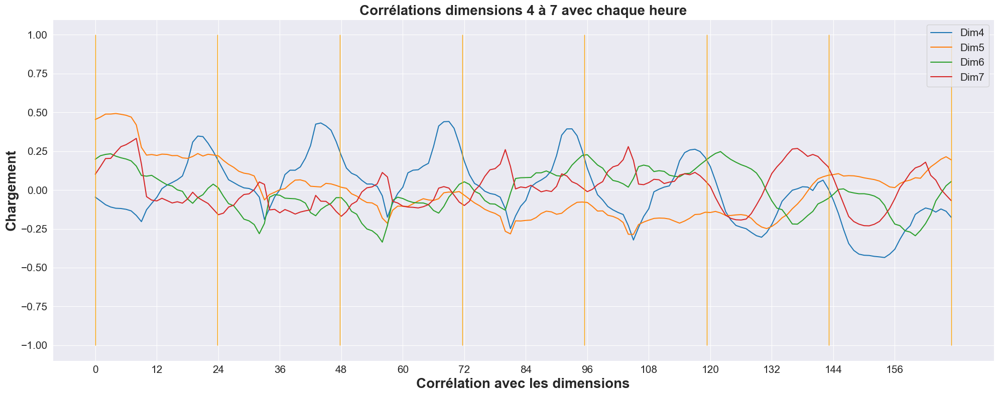

In [45]:
plt.figure(figsize=(20,8))

plt.plot(cormat2['Dim4'].iloc[:168],label="Dim4")
plt.plot(cormat2['Dim5'].iloc[:168],label="Dim5")
plt.plot(cormat2['Dim6'].iloc[:168],label="Dim6")
plt.plot(cormat2['Dim7'].iloc[:168],label="Dim7")
    
plt.vlines(x = time_tick-1, ymin = -1, ymax = 1, colors = "Orange", linewidth = 1) 
# time_tick, déjà défini et correspond aux jours

plt.xlabel('Corrélation avec les dimensions', fontsize = 20, fontweight='demibold')
plt.ylabel('Chargement', fontsize = 20, fontweight='demibold')
plt.title("Corrélations dimensions 4 à 7 avec chaque heure", fontsize = 20, fontweight='bold')
plt.xticks(ticks = np.arange(0, 168, 12), labels=np.arange(0, 168, 12), fontsize = 15)
plt.yticks(fontsize = 15)
plt.legend(fontsize = 15)

plt.tight_layout()
plt.show()

Ce graphique représente la corrélation entre quatre dimensions supplémentaires de notre ACP (Dim4, Dim5, Dim6, Dim7) et chaque heure de la semaine. En référence à la matrice de corrélation que nous avons analysée précédemment :

Dim4 et Dim5 pourraient être associées aux variations de chargement à différents moments de la semaine, comme indiqué par la corrélation avec les variables Diff matin-soir et Diff début-fin semaine. Leur comportement ondulatoire montre des motifs récurrents sur lesquels elles ont un impact significatif. Les pics positifs et négatifs alternés pourraient représenter des périodes comme les heures de pointe du matin et du soir, ou des variations entre le début et la fin de semaine.

Dim6 et Dim7 ne correspondaient pas à des variables spécifiques de la matrice de corrélation que nous avons vu précédemment, ce qui suggère qu'elles pourraient capter des aspects plus subtils ou complexes du comportement de chargement qui ne sont pas directement liés aux moyennes ou aux différences jour/nuit, semaine/weekend ou matin/soir. Les courbes montrent des schémas moins prévisibles et des fluctuations qui pourraient correspondre à des facteurs moins évidents ou à des interactions entre différents types de comportements d'usage, comme par exemple des variations entre la période de samedi soir à mardi midi et de mercredi soir à samedi après-midi. Mais ces composantes restent difficilement interprétables.

Enfin, on observe de manière générale que les amplitudes des quatre courbes sont moins importantes que sur le graphique précédent. Cela le rend plus difficilement interprétable, particulièrement pour les deux dernières composantes principales.

En conclusion, l'analyse en composantes principales a permis de réduire efficacement la dimension de notre jeu de données, en passant de 168 variables horaires à seulement 7 dimensions principales. Cette réduction significative a facilité l'interprétation des données tout en conservant les aspects les plus significatifs du comportement des utilisateurs.

Les premières dimensions (Dim1 à Dim3) ont révélé des schémas distincts de chargement des stations : Dim1 est fortement liée à la moyenne de chargement global, Dim2 capture les variations entre le jour et la nuit, et Dim3 présente les différences entre les jours de semaine et le weekend. Ces résultats confirment l'intuition que l'activité des stations Vélib est influencée par des facteurs temporels précis et qu'elle montre des variations significatives selon ces périodes.

Les dimensions suivantes (Dim4 à Dim7) ont également montré des corrélations intéressantes, même si plus nuancées, indiquant des variations plus légères qui pourraient correspondre à des périodes de transition ou à des interactions entre les habitudes des utilisateurs. L'analyse de ces dimensions supplémentaires pourrait révéler des informations pertinentes sur des motifs moins évidents, tels que les variations de l'utilisation des stations Vélib au cours d'une journée typique ou entre le début et la fin de semaine.

Nous allons maintenant nous intéresser à une méthode dont l'objectif est similaire à celui de l'ACP : l'analyse en composantes multiples (MCA).

# 3 - Analyse en composantes multiples (MCA)

La MCA, ou Analyse des Correspondances Multiples, est une méthode d'analyse statistique utilisée principalement dans le domaine de l'analyse des données catégorielles. Son principe repose sur la recherche de relations entre des variables catégorielles en examinant la similarité entre les profils de réponses des individus sur ces variables. Elle permet de mettre en évidence des associations entre les catégories de variables et de représenter graphiquement ces relations dans un espace de dimensions réduites. 

## 3.1 - Regroupements catégoriques

Comme la MCA est une méthode adaptée aux données qualitatives, nous allons devoir transformer notre jeu de données sur le chargement en créant des variables qualitatives. Nous ne pouvons pas nous contenter de discrétiser chacune de nos 168 variables horaire de chargement, nous aurions beaucoup trop de modalités. Nous allons donc devoir faire des regroupement sur nos données, en essayant de conserver un maximum d'information possible. Nous allons faire des regroupements selon les jours de la semaine et les heures de la journée. Ainsi nous allons créer 2 variables par jour : une correspondant au chargement durant le journée et une durant la nuit. En s'appuyant sur nos résultats de l'ACP, nous choisissons les plages horaires entre 20h et 7h pour la nuit, et entre 8h et 19h pour le jour.

In [46]:
# Créer un dictionnaire de groupes de colonnes pour heure jour de la semaine
groupes_jours = {
    'lun_n': ['Lun-00','Lun-01','Lun-02','Lun-03','Lun-04','Lun-05','Lun-06','Lun-07','Lun-20','Lun-21','Lun-22','Lun-23'],
    'lun_j': ['Lun-08','Lun-09','Lun-10','Lun-11','Lun-12','Lun-13','Lun-14','Lun-15','Lun-16','Lun-17','Lun-18','Lun-19'],
    
    'mar_n': ['Mar-00','Mar-01','Mar-02','Mar-03','Mar-04','Mar-05','Mar-06','Mar-07','Mar-20','Mar-21','Mar-22','Mar-23'],
    'mar_j': ['Mar-08','Mar-09','Mar-10','Mar-11','Mar-12','Mar-13','Mar-14','Mar-15','Mar-16','Mar-17','Mar-18','Mar-19'],
    
    'mer_n': ['Mer-00','Mer-01','Mer-02','Mer-03','Mer-04','Mer-05','Mer-06','Mer-07','Mer-20','Mer-21','Mer-22','Mer-23'],
    'mer_j': ['Mer-08','Mer-09','Mer-10','Mer-11','Mer-12','Mer-13','Mer-14','Mer-15','Mer-16','Mer-17','Mer-18','Mer-19'],
  
    'jeu_n': ['Jeu-00','Jeu-01','Jeu-02','Jeu-03','Jeu-04','Jeu-05','Jeu-06','Jeu-07','Jeu-20','Jeu-21','Jeu-22','Jeu-23'],
    'jeu_j': ['Jeu-08','Jeu-09','Jeu-10','Jeu-11','Jeu-12','Jeu-13','Jeu-14','Jeu-15','Jeu-16','Jeu-17','Jeu-18','Jeu-19'],

    'ven_n': ['Ven-00','Ven-01','Ven-02','Ven-03','Ven-04','Ven-05','Ven-06','Ven-07','Ven-20','Ven-21','Ven-22','Ven-23'],
    'ven_j': ['Ven-08','Ven-09','Ven-10','Ven-11','Ven-12','Ven-13','Ven-14','Ven-15','Ven-16','Ven-17','Ven-18','Ven-19'],
   
    'sam_n': ['Sam-00','Sam-01','Sam-02','Sam-03','Sam-04','Sam-05','Sam-06','Sam-07','Sam-20','Sam-21','Sam-22','Sam-23'],
    'sam_j': ['Sam-08','Sam-09','Sam-10','Sam-11','Sam-12','Sam-13','Sam-14','Sam-15','Sam-16','Sam-17','Sam-18','Sam-19'],

    'dim_n': ['Dim-00','Dim-01','Dim-02','Dim-03','Dim-04','Dim-05','Dim-06','Dim-07','Dim-20','Dim-21','Dim-22','Dim-23'],
    'dim_j': ['Dim-08','Dim-09','Dim-10','Dim-11','Dim-12','Dim-13','Dim-14','Dim-15','Dim-16','Dim-17','Dim-18','Dim-19']
    
}

# Définir une fonction pour effectuer une opération spécifique sur chaque groupe
def operation_sur_groupe(groupe):
    return groupe.mean(axis=1)

# Créer un DataFrame pour stocker les résultats
loading_group = pd.DataFrame()

for jour, colonnes in groupes_jours.items():
    resultat_jour = operation_sur_groupe(loading[colonnes])
    loading_group[jour] = resultat_jour

# Afficher le DataFrame de résultats
loading_group


,lun_n,lun_j,mar_n,mar_j,mer_n,mer_j,jeu_n,jeu_j,ven_n,ven_j,sam_n,sam_j,dim_n,dim_j
1,0.171703,0.050595,0.483466,0.109458,0.632937,0.124118,0.573964,0.148810,0.686287,0.150904,0.302138,0.187500,0.125000,0.143162
2,0.601449,0.083333,0.992754,0.166667,0.869565,0.152174,0.974638,0.170290,0.887681,0.170290,0.811594,0.398551,0.485507,0.322628
3,0.202899,0.344850,0.510408,0.742951,0.404545,0.374242,0.431818,0.481818,0.548485,0.594978,0.518827,0.545455,0.493827,0.339506
4,0.674603,0.845238,0.063492,0.670635,0.120370,0.498016,0.025132,0.635387,0.055556,0.567460,0.214286,0.408730,0.500000,0.805556
5,0.635559,0.837659,0.456683,0.760069,0.425841,0.675591,0.276676,0.623756,0.441444,0.754720,0.454693,0.258971,0.400253,0.416667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1185,0.040349,0.014987,0.253623,0.083333,0.351449,0.101449,0.503623,0.111825,0.097826,0.057971,0.210145,0.101449,0.159420,0.141304
1186,0.168519,0.337037,0.201852,0.488889,0.337037,0.661111,0.466667,0.746296,0.224074,0.425926,0.340741,0.470370,0.420370,0.418519
1187,0.436686,0.110153,0.316667,0.097222,0.180556,0.491667,0.408333,0.152778,0.283333,0.144444,0.218582,0.128927,0.597701,0.431034
1188,0.579365,0.753968,0.734127,0.884921,0.289365,0.570159,0.043333,0.140000,0.276667,0.213333,0.656667,0.843333,0.797059,0.911667


On définit maintenant une fonction qui permet de catégoriser les stations suivant leur taux de chargement et leur fréquentation. Nous choisissons arbitrairement des seuils : en dessous de $0.15$, on considère que la station est peu remplie, ie très fréquentée. Au-dessus de $0.6$, la station est très remplie, ie très fréquentée. Entre les deux seuils, la station est moyennement remplie.

In [47]:
# Fonction pour catégoriser les taux de chargement
def categorize_loading(value):
    if value < 0.15:
        return 0 # station peu remplie
    elif value > 0.6:
        return 2 # station très remplie
    else:
        return 1 # moyennement remplie

# Catégoriser les taux de chargement
loading_categorized = loading_group.applymap(categorize_loading)


# Ajouter les informations d'altitude
loading_categorized['Altitude'] = coord['bonus'].apply(lambda x: 1 if x == 1 else 0) # 1 pour une station en altitude et 0 en plaine
loading_categorized.head()

,lun_n,lun_j,mar_n,mar_j,mer_n,mer_j,jeu_n,jeu_j,ven_n,ven_j,sam_n,sam_j,dim_n,dim_j,Altitude
1,1,0,1,0,2,0,1,0,2,1,1,1,0,0,0
2,2,0,2,1,2,1,2,1,2,1,2,1,1,1,0
3,1,1,1,2,1,1,1,1,1,1,1,1,1,1,0
4,2,2,0,2,0,1,0,2,0,1,1,1,1,2,0
5,2,2,1,2,1,2,1,2,1,2,1,1,1,1,0


Les données sont catgorisées pour pouvoir appliquer des classifications ultérieurement.

## 3.2 - Mise en place de la MCA

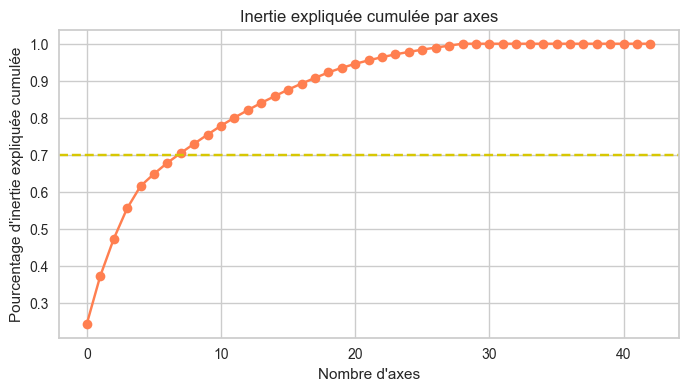

In [135]:
import prince 

# Initialisation de l'analyse MCA 
mca = prince.MCA(
    n_components=44,  # Nombre de dimensions initiales de notre dataframe
    n_iter=3,         # Nombre d'itérations pour l'optimisation
    copy=True,        # Pour éviter de modifier les données d'origine
    check_input=True,
    random_state=42
)

# Ajustement de la MCA aux données
mca = mca.fit(loading_categorized)

# Calcul de l'inertie expliquée à partir des valeurs propres
eigenvalues = mca.eigenvalues_  # Les valeurs propres obtenues après fit
total_inertia = sum(eigenvalues)  # L'inertie totale est la somme des valeurs propres
explained_inertia = [val / total_inertia for val in eigenvalues]  # Pourcentage d'inertie expliquée par chaque axe

# Affichage de l'inertie cumulée expliquée
plt.figure(figsize=(8, 4))
plt.plot(np.cumsum(explained_inertia), marker='o',color="coral")
plt.xlabel('Nombre d\'axes')
plt.ylabel('Pourcentage d\'inertie expliquée cumulée')
plt.title('Inertie expliquée cumulée par axes')
plt.axhline(y=0.7, color='y', linestyle='--')  # Ligne pour le seuil de 80%
plt.show()

# Affichage du tableau des inerties cumulées

Etant donné que l'inertie expliquée croit beaucoup plus lentement au delà de 5 axes, et afin de d'être consistant avec l'ACP effectuée précédemment, nous décidons de conserver 7 variables. Cela permet de garder un maximim d'information sur nos données tout en diminuant fortement le nombre de variables conservées (au moins 70% de l'inertie cumulée expliquée).

In [49]:
mca = prince.MCA(n_components=7, n_iter=3, copy=True, check_input=True, random_state=42)
# Ajustement de la MCA aux données
mca = mca.fit(loading_categorized)
coords = mca.column_coordinates(loading_categorized)


## 3.3 -  Analyse des résultats de la MCA

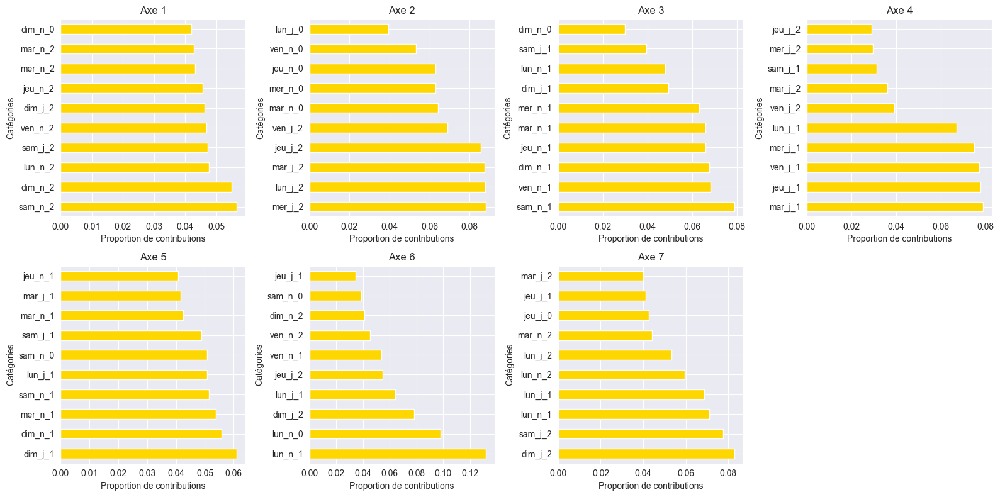

In [50]:
# Définir le nombre de lignes et de colonnes pour les subplots
num_rows = 2
num_cols = 4
# Contributions des catégories aux axes
contributions = mca.column_contributions_

fig, axs = plt.subplots(num_rows, num_cols, figsize=(16, 8))
index = 0

for i in range(num_rows):
    for j in range(num_cols):
        if index < 7:
            # Trier les contributions pour l'axe spécifique
            sorted_contributions = contributions[index].sort_values(ascending=False).head(10)
            sorted_contributions.plot(kind='barh', ax=axs[i, j],color='gold')
            axs[i, j].set_title(f'Axe {index+1}')
            axs[i, j].set_xlabel('Proportion de contributions')
            axs[i, j].set_ylabel('Catégories')
            index += 1
        else:
            axs[i, j].axis('off')

plt.tight_layout()
plt.show()


* On remarque que sur l'axe 1, les stations très remplies sont les plus représentées, et ce pour tous les jours de la semaine.
* Selon l'axe 2, les stations apportant beaucoup de contribution sont celles qui marquent l'alternance entre les stations peu remplies et les stations très remplies.
* L'axe 3 est fortement représenté par les stations à moyenne fréquentation. Tous les jours de la semaine sont représentés dans la contribution. 
* Les autres axes sont plus difficiles d'interprétation.

L'altitude ne semble pas contribuer fortement sur l'un des axes. Cela va dans le même sens que l'étude de nos hypothèses sur les résultats issus de l'ACP. 

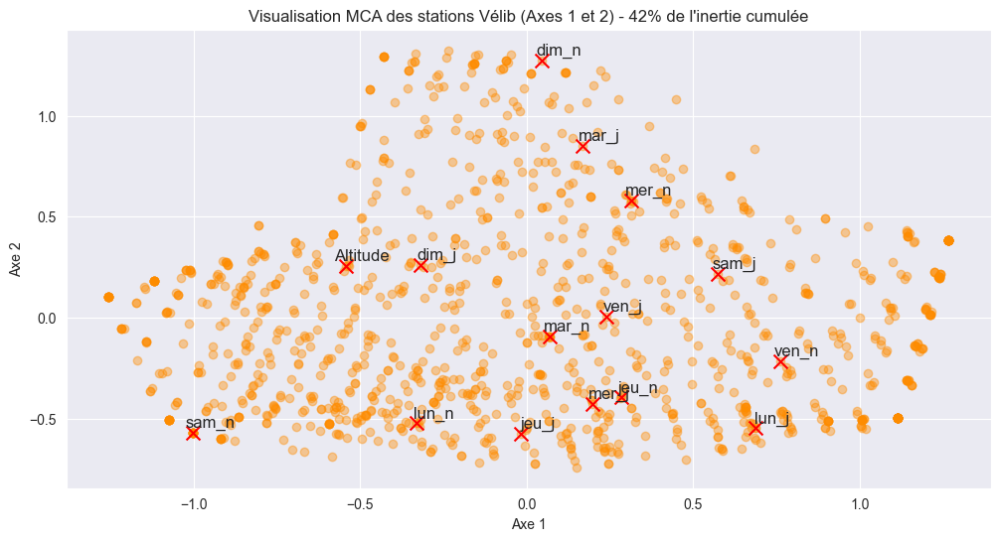

In [51]:
coordinates = mca.transform(loading_categorized)
# Créer un nuage de points avec les coordonnées des variables de la MCA
plt.figure(figsize=(12, 6))
plt.scatter(coordinates.iloc[:, 0], coordinates.iloc[:, 1], alpha=0.4,color="darkorange")  # Visualisation sur les deux premiers axes

# Ajouter les noms des variables
for i, nom_variable in enumerate(loading_categorized.columns):
    x_offset = 0.05  
    y_offset = 0.05 
    plt.text(coordinates.iloc[i, 0] + x_offset, coordinates.iloc[i, 1] + y_offset, nom_variable, fontsize=12, ha='center', va='center')
    plt.scatter(coordinates.iloc[i, 0], coordinates.iloc[i, 1], marker='x', color='red', s=100)  


plt.xlabel('Axe 1')
plt.ylabel('Axe 2')
plt.title('Visualisation MCA des stations Vélib (Axes 1 et 2) - 42% de l\'inertie cumulée')

plt.show()

Ce scatter plot présente la distribution des données issues de l'analyse en composantes multiples selon les deux premiers axes qui représentent 42% de l'inertie cumulée. On observe certaines zones (en bas et à gauche) où les points sont regroupés, ce qui indique des relations éventuelles entre les variables, et d'autres zones (en haut et au centre), où les points sont plus dispersés, ce qui montre de faibles relations entre nos variables. On remarque que les zones plus denses regroupent des stations aux taux de chargements assez faibles la nuit à l'exception des encodages dimanche_nuit et mardi_jour, et de celle présentées à l'instant, les autres variables semblent regroupées selon une droite centrée horizontale.

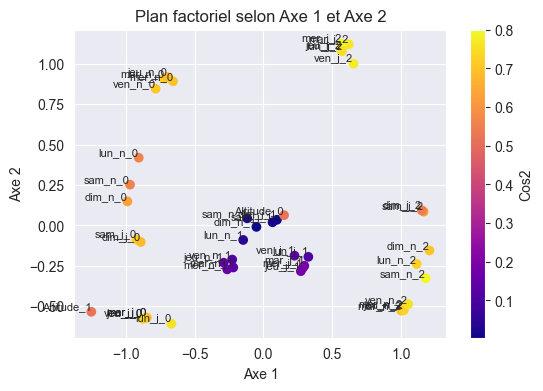

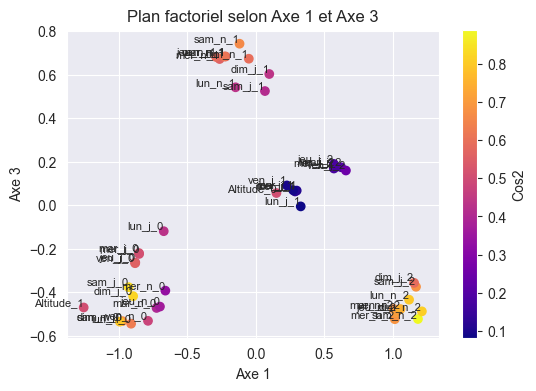

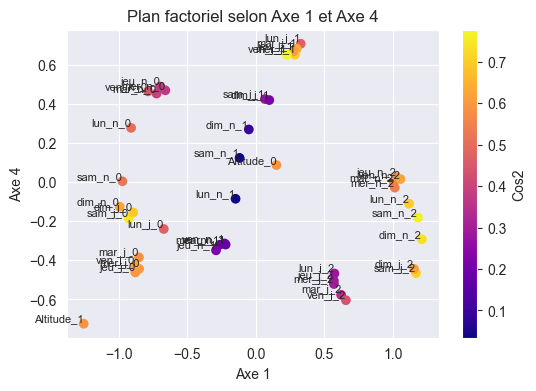

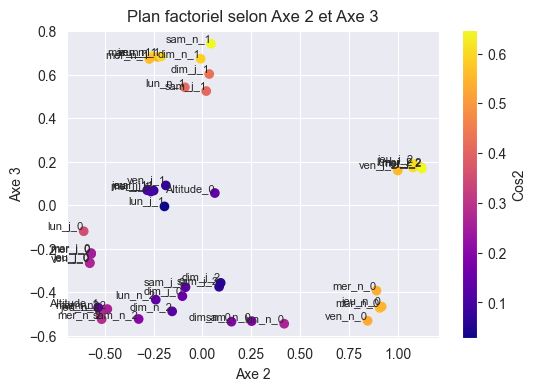

In [52]:
from colorspacious import cspace_converter

# Fonction pour calculer le cos2
def compute_cos2(coords, ax1, ax2):
    # Variance totale sur tous les axes 
    total_var_all_axes = (coords**2).sum()
    total_var_specified = coords[ax1]**2 + coords[ax2]**2
    return total_var_specified / total_var_all_axes

# Fonction pour visualiser les graphiques MCA en fonction du cos2
def plot_mca_variables(coords, ax1, ax2):
    plt.figure(figsize=(6, 4))
    cos2_values = coords.apply(lambda row: compute_cos2(row, ax1, ax2), axis=1)
    # print(cos2_values)
    plt.scatter(coords[ax1], coords[ax2], c=cos2_values, cmap=cm.plasma)

    # Annoter chaque point avec le nom de la catégorie
    for i, txt in enumerate(coords.index):
        x_offset = 0.5  
        y_offset = 0.5
        plt.annotate(txt, (coords[ax1][i], coords[ax2][i]), fontsize=8, ha='right', va='bottom')

    plt.xlabel(f'Axe {ax1 + 1}')
    plt.ylabel(f'Axe {ax2 + 1}')
    plt.title(f'Plan factoriel selon Axe {ax1 + 1} et Axe {ax2 + 1}')
    plt.colorbar(label="Cos2")
    plt.show()

# Affichage des plans factoriels pour les combinaisons d'axes
plot_mca_variables(coords, 0, 1)  # Axes 1 et 2
plot_mca_variables(coords, 0, 2)  # Axes 1 et 3
plot_mca_variables(coords, 0, 3)  # Axes 1 et 4
plot_mca_variables(coords, 1, 2)  # Axes 2 et 3

Selon l'axe 1, les stations très remplies sont celles qui ont sont le mieux représentées positivement. A l'inverse, les stations peu remplies sont bien représentées négativement. On remarque que les jours du week-end et le lundi sont proches de 0 selon l'axe 2. Les stations moyennement fréquentées sont proche de 0 pour les axes 1 et 2. Les variables du milieu de semaine sont fortement positivement représentées selon l'axe 2. On voit que l'altitude est fortement négativement représentée sur l'axe 1, tout comme les modalités représentant les stations peu remplies. Cela va danse le sens de la difficulté d'accessibilité aux stations en altitude avec un caractère plus sportif pour un vélo musculaire. D'après la valeur du cos², les stations moyennement remplies sont mal représentées par les axes 1 et 2 car le cos² a une valeur proche de 0. Les autres variables sont bien représentées car le cos² est proche de 1.

Les stations très et peu remplies sont plutôt représentées négativement sur l'axe 3 tandis que les stations moyennement remplies sont représentées positivement. Sur le plan factoriel selon les axes 1 et 3, on observe des groupes très distincts. Si on observe uniquement ces deux composantes, on peut bien distinguer nos catégories : ce qui pourra permettre un clustering intéressant par la suite. Au niveau des valeurs du cos², il n'y a pas de gros changement par rapport à l'analyse du premier plan factoriel.

On observe que la variable d'altitude est négativement représentée sur l'axe 4, tout comme sur l'axe 1. Les jours de la semaine où les stations sont peu remplies la nuit sont positivement représentées sur l'axe 4, alors que les jours de la semaine où les stations sont très remplies en journée sont négativement représentées. Sur le troisième plan factoriel, on remarque que les stations moyennement remplies en milieu de semaine sont bien représentées avce un cos² proche de 1. Les variables représentant les stations moyennement remplies le week-end et lundi sont mal représentées avec un cos² proche de 0. Mais ces dernières sont bien représentées sur les axes 2 et 3.

Globalement, toutes les modalités sont bien représentées sur au moins un des plans factoriel. Cela valide notre choix de découpage. On obtient des résultats similaires aux significations des dimensions principales de l'ACP et confirme notre analyse quant aux informations importantes sur le chargement des stations.

En résumé, à l'aide des plans factoriels, nous pouvons faire les hypothèses suivantes :

*  L'axe 1 représente l'alternance entre les stations peu et très remplies.
* L'axe 2 représente l'alternance entre les jours de la semaine travaillé et le week-end/lundi.
* L'axe 3 représente l'alternance des stations peu et très remplies avec les stations moyennement remplies.
* L'axe 4 permet d'observer des regroupements entre les variables sans signification particulière.
* Enfin on voit que l'altitude est corrélée avec les stations peu remplies, ce qui confirme nos hypothèses de difficulté d'accès attirant moins d'utiliateurs.
 

Nous allons maintenant voir si les classifications sur nos données apportent des informations sur les caractéristiques des stations, leurs activités, où les quartiers où elles se situent.

# 4 - Classification

Dans cette partie, nous allons étudier les différentes possibilités de classifications. La classification des stations Vélib dans notre jeu de données pourrait servir plusieurs objectifs intéressants et pratiques, tels que :
* L'optimisation de la gestion des stations
* L'amélioration de la répartition des vélos
* L'identification des comportements d'utilisateurs

In [53]:
# Importation des packages pour cette partie

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from matplotlib import colors
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import jaccard_score
from sklearn.metrics import fowlkes_mallows_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch

## 4.1 - Classification sur les données issues de l'ACP par K-means

K-Means est un algorithme simple d’apprentissage non supervisé utilisé pour résoudre les problèmes de clustering. Il suit une procédure simple consistant à classer un ensemble de données dans un nombre de clusters, défini par la lettre `k`, qui est fixé au préalable.

### 4.1.1 - Détermination du nombre optimal de clusters pour la méthode du K-means

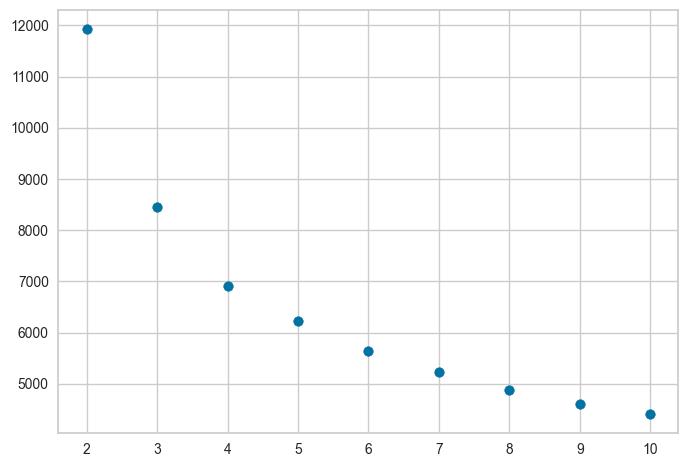

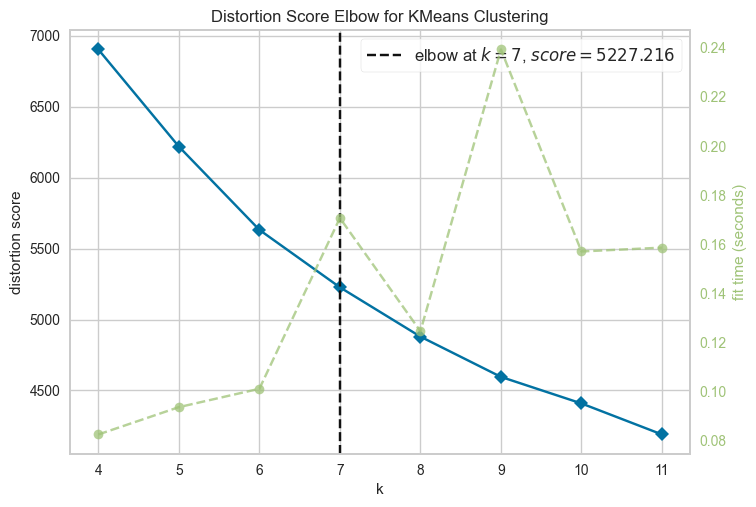

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [54]:
# A la main
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=100, random_state=42)
    kmeans.fit(loading_pca)
    inertia.append(kmeans.inertia_)
inertia = np.array(inertia)

plt.scatter(range(2, 11), inertia[1:])
plt.show()


# Using yellowbrick

kmeans = KMeans(init='k-means++', n_init=10, max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans, k=(4,12))

visualizer.fit(loading_pca)    # Fiter les données
visualizer.show()  

Le graphique montre que le nombre optimal de clusters pour la méthode du K-Means de notre jeu de données est de 7, comme déterminé par la méthode du coude. Ce choix équilibre bien la compacité des clusters et la complexité computationnelle, ce qui devrait permettre une bonne segmentation des stations Vélib. Cela peut également se confirmer par les observations sur la mise en place de la méthode "à la main".

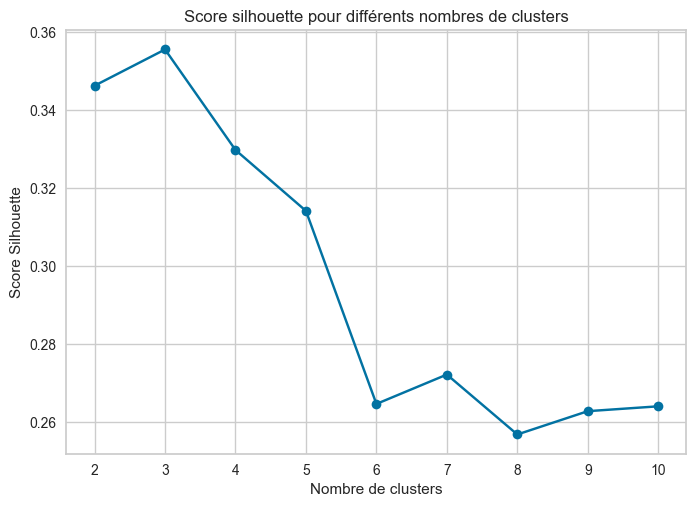

Nombre optimal de clusters d'après le score silhouette : 3


In [55]:
# Liste pour stocker les scores de silhouette
silhouette_scores = []

# Range de nombre de clusters à tester
k_range = range(2, 11)

# Calcul des scores de silhouette pour chaque nombre de clusters
for k in k_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=100, random_state=42)
    cluster_labels = kmeans.fit_predict(loading_pca)
    silhouette_avg = silhouette_score(loading_pca, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Tracer les scores de silhouette en fonction du nombre de clusters
plt.plot(k_range, silhouette_scores, marker='o')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score Silhouette')
plt.title('Score silhouette pour différents nombres de clusters')
plt.show()

# Trouver le nombre optimal de clusters
optimal_num_clusters = k_range[np.argmax(silhouette_scores)]
print("Nombre optimal de clusters d'après le score silhouette :", optimal_num_clusters)


Le graphique présente le score de silhouette pour différents nombres de clusters allant de 2 à 10. Le score de silhouette mesure la qualité du clustering en calculant combien point est similaire à son propre cluster comparé aux autres clusters. Le score est compris entre -1 et 1, où un score élevé indique que les points sont bien adaptés à leur propre cluster et mal adaptés aux clusters voisins. Dans ce cas, le score de silhouette le plus élevé est obtenu avec 3 clusters, et il diminue généralement à mesure que le nombre de clusters augmente.

Le résultat obtenu par cette méthode n'est pas le même que celui donné par la méthode du coude. En effet, le score de silhouette et la méthode du coude sont deux approches différentes pour évaluer le nombre optimal de clusters :

* La méthode du coude se concentre sur la minimisation de la variance au sein des clusters. Elle cherche le point où l'ajout de clusters supplémentaires n'entraîne pas une amélioration significative de la somme totale des carrés au sein des clusters.

* Le score de silhouette, évalue à la fois la cohésion (à quel point les points sont proches les uns des autres au sein du même cluster) et la séparation (à quel point les clusters sont loin les uns des autres).

La différence entre les résultats de ces deux méthodes peut survenir parce qu'ils mesurent des aspects légèrement différents de la structure des données. Alors que la méthode du coude peut indiquer que 7 clusters minimisent la variance intra-cluster sans considération significative pour la séparation entre les clusters, le score de silhouette indique que 3 clusters offrent la meilleure combinaison de séparation et de cohésion.

Pour la classification des stations Vélib, cela signifie que l'utilisation de 3 clusters pourrait conduire à des groupes plus définis et clairement séparés, tandis que 7 clusters pourraient capturer plus de nuances dans les données. 

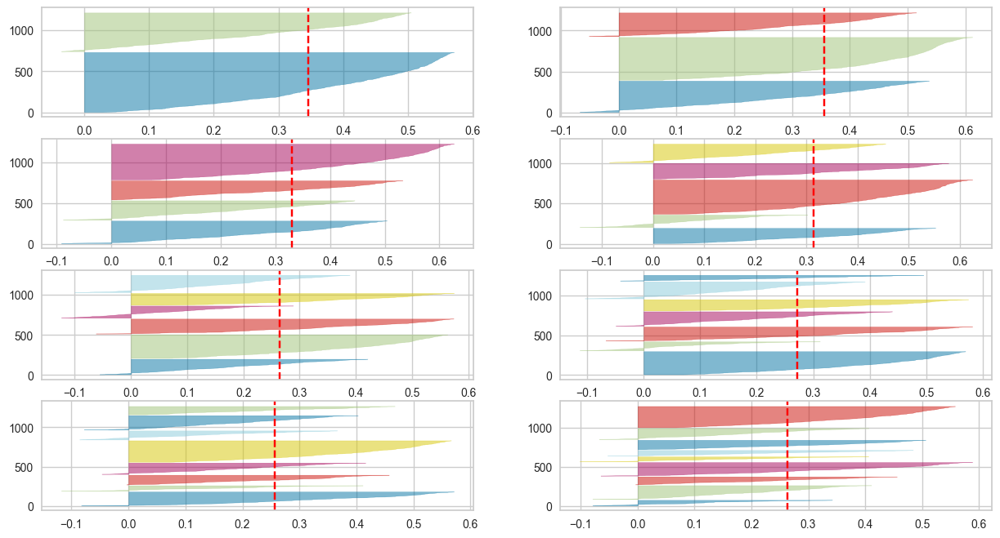

In [56]:
fig, ax = plt.subplots(4, 2, figsize=(15,8))

for k in range(2, 10):
    '''
    Create KMeans instance for different number of clusters
    '''
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(k, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(loading_pca)

Largeur des silhouettes : La largeur des formes pour chaque cluster indique le score de silhouette des points dans ce cluster. Un score proche de 1 signifie que les points sont bien adaptés à leur cluster et mal adaptés aux clusters voisins. Un score proche de 0 indique que les points sont à la frontière de la décision entre deux clusters adjacents. Un score négatif suggère que les points ont été attribués au mauvais cluster.

Cohérence des tailles de clusters : La hauteur des formes indique le nombre de points dans chaque cluster. Des clusters de tailles équivalentes peuvent être le signe d'un bon clustering, alors que des différences importantes de tailles peuvent indiquer une mauvaise répartition des points.

Analyse par valeur de k :

* k=2 : Il semble y avoir une distinction raisonnable entre les deux clusters, même si l'un des clusters a une gamme plus large de scores, ce qui indique une variabilité interne.

* k=3 : Les scores de silhouette pour les trois clusters semblent bons, avec des scores pour la plupart positifs, suggérant un bon ajustement des points à leurs clusters respectifs. Cela est cohérent avec le graphique précédent sur le score de la maximisation du score de la silhouette.

* k=4 à k=9 : À mesure que le nombre de clusters augmente, nous commençons à voir plus de variabilité dans les scores de silhouette, avec certains clusters présentant des scores de silhouette bas ou même négatifs, ce qui indique une moins bonne adéquation des points à ces clusters.

La ligne rouge en pointillés dans chaque sous-graphique représente la moyenne du score de silhouette pour cette valeur spécifique de k. Plus cette moyenne est élevée, mieux c'est.

Le choix entre les deux recommandations (score silhouette ou méthode du coude) dépend des objectifs de l'analyse. Si le but est de maximiser la différenciation entre les clusters, on pourrait privilégier le score de silhouette, qui suggère k=3. Cela donnerait des clusters clairement distincts et bien définis.

Si, en revanche, l'objectif est de capturer autant de structure sous-jacente dans les données que possible, même si cela signifie des frontières moins nettes entre certains clusters, on pourrait choisir k=7, comme le suggère la méthode du coude. Cela pourrait révéler des nuances plus fines dans le comportement des utilisateurs des stations Vélib.

### 4.1.2 - Classification par K-Means

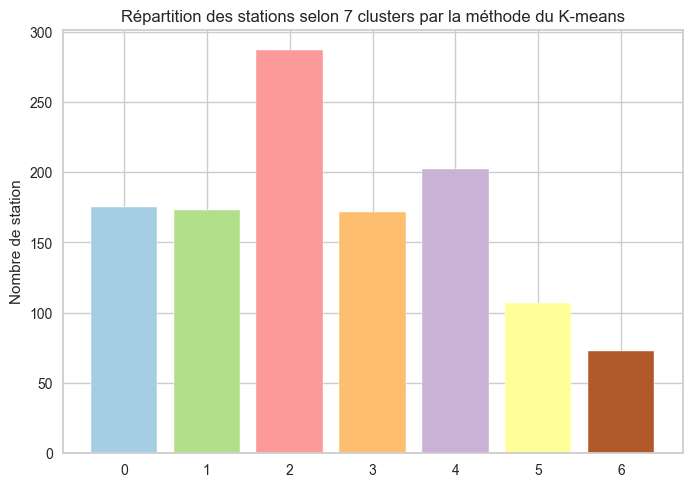

In [57]:
# Classification par K-means avec 7 clusters
K = 7 # D'après la méthode du coude

kmeans_pca7 = KMeans(n_clusters=K, random_state=0)
clusters_pca7 = kmeans_pca7.fit_predict(loading_pca)


cmap = plt.get_cmap('Paired',K)
plt.bar(*np.unique(clusters_pca7, return_counts=True), color=cmap.colors)
plt.ylabel("Nombre de station")
plt.title("Répartition des stations selon "+ str(K)+" clusters par la méthode du K-means")
plt.show()

Ce graphique est un histogramme qui montre la répartition des stations Vélib selon 7 clusters déterminés par la méthode K-means. Chaque barre représente le nombre de station dans chacun des clusters (de 0 à 6). On remarque que le cluster 1 contient le plus grand nombre de stations, tandis que les clusters 0 et 6 en contiennent un peu moins. Les autres clusters sont assez bien répartis.

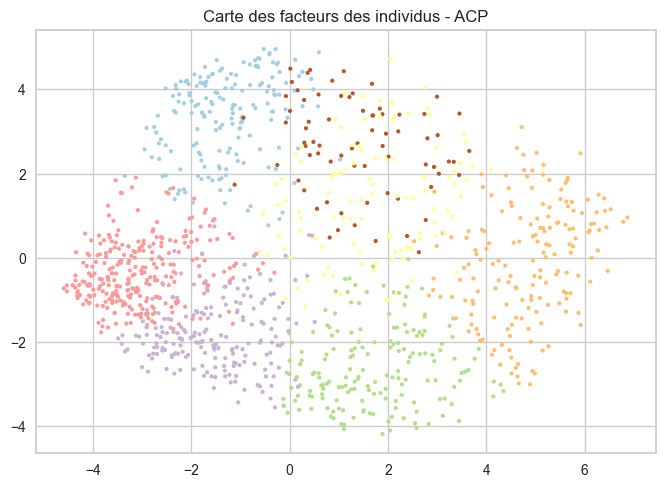

In [58]:
# Visualisation sur le plan factoriel

plt.scatter(loading_pca.values[:, 0], loading_pca.values[:, 1], c=clusters_pca7, s=4, linewidths=1, cmap=cmap)

plt.title("Carte des facteurs des individus - ACP")

plt.show()

Ce graphe est une carte des facteurs individuels issus de l'ACP. Chaque point représente une station Vélib, et les couleurs correspondent aux 7 clusters identifiés par la méthode du K-means. Les deux axes représentent les deux premières composantes principales qui capturent la plus grande partie de la variance dans les données (64% comme vu dans la partie ACP). On peut voir comment les stations sont distribuées dans l'espace réduit des composantes principales, et on observe une séparation assez claire entre les clusters, à part pour les deux clusters centrés en haut au centre, qui se chevauchent.

Nous allons maintenant étudier le cas de 6 clusters pour voir si les 2 clusters mélangés au centre du premier plan fatoriel seraient mieux classifiés.

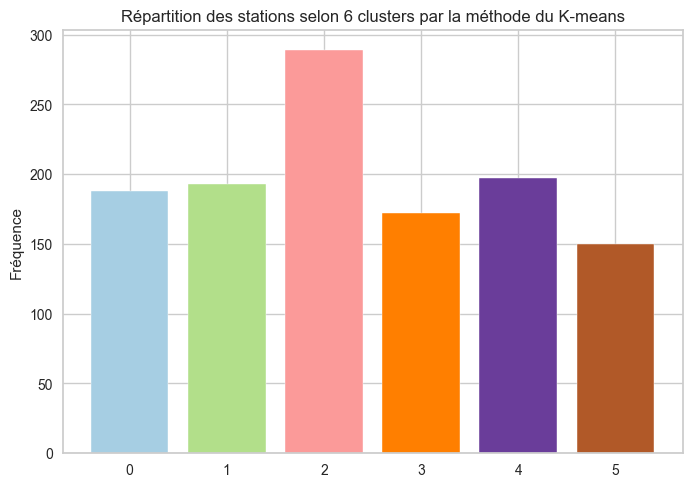

In [59]:
# Classification par K-means avec 6 clusters
K = 6 # Pour comparer

kmeans_pca6 = KMeans(n_clusters=K, random_state=0)
clusters_pca6 = kmeans_pca6.fit_predict(loading_pca)


cmap = plt.get_cmap('Paired',K)
plt.bar(*np.unique(clusters_pca6, return_counts=True), color=cmap.colors)
plt.ylabel("Fréquence")
plt.title("Répartition des stations selon "+ str(K)+" clusters par la méthode du K-means")
plt.show()

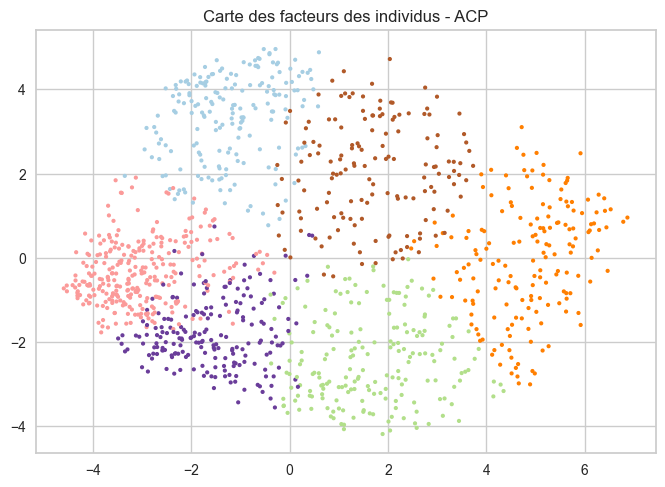

In [60]:
# Visualisation sur le plan factoriel

plt.scatter(loading_pca.values[:, 0], loading_pca.values[:, 1], c=clusters_pca6, s=4, linewidths=1, cmap=cmap)

plt.title("Carte des facteurs des individus - ACP")

plt.show()

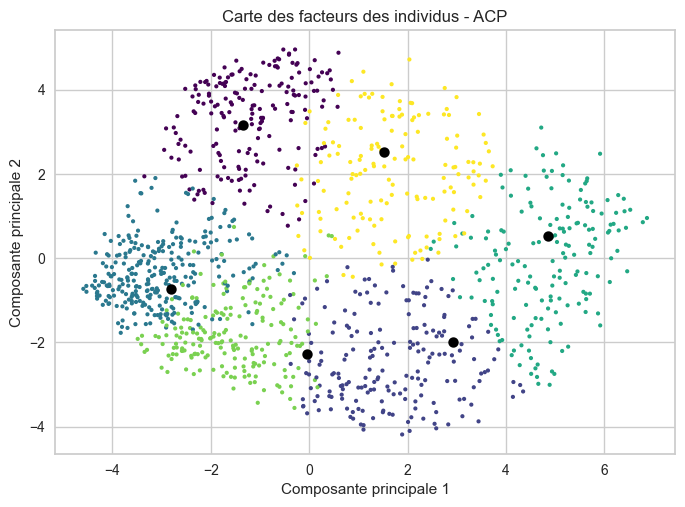

In [61]:
kmeans = KMeans(n_clusters=6, random_state=42)
kmeans.fit(loading_pca.values)

# Coordonnées des centroïdes
centroids = kmeans.cluster_centers_

# Ccarte des facteurs individuels
plt.scatter(loading_pca.values[:, 0], loading_pca.values[:, 1], c=clusters_pca6, s=4, linewidths=1, cmap='viridis')
# Centroïdes sur le graphique
plt.scatter(centroids[:, 0], centroids[:, 1], marker='o', s=20, linewidths=3, color='black')

plt.title("Carte des facteurs des individus - ACP")
plt.xlabel("Composante principale 1")
plt.ylabel("Composante principale 2")
plt.show()

De manière analogue à la méthode K-Means avec 7 clusters, on observe la répartition des stations de Vélib dans chaque cluster. On voit que la classe 2 contient plus de stations que les autres classes qui sont assez homogènes. Sur la visualisation sur le premier plan factoriel, les clusters sont bien distincts les uns des autres, et sont mieux séparés qu'avec 7 clusters. Les centroïdes de chaque clusters sont matérialisés par les points noirs sur le dernier graphique qui permet de les visualiser, même si les couleurs des clusters ne correspondent pas à l'histogramme.

Même si cela n'est pas en accord avec la méthode du coude, choisir 6 clusters paraît visuellement plus pertinent. Il est important de noter que la pertinence de ce choix de classification est valable uniquement sur le premier plan factoriel. Il se peut que le choix de 7 clusters soit plus approprié sur un autre plan factoriel. 

Conformément au score de la silhouette, nous allons tester cette même méthode avec 3 clusters.

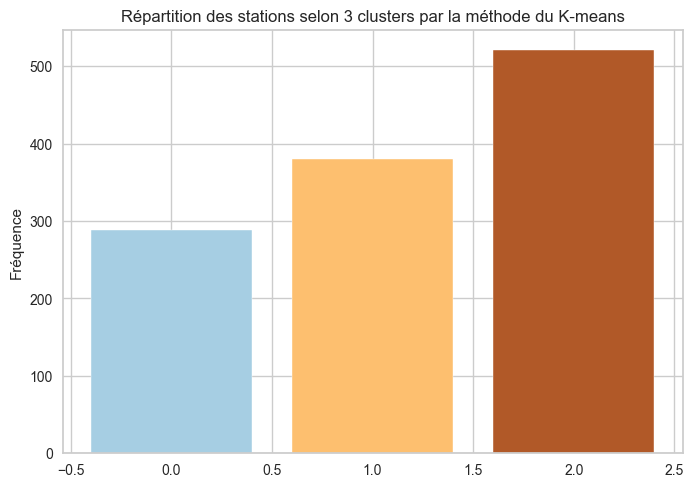

In [62]:
# Classification par K-means avec 3 clusters
K = 3 # D'après le score silhouette

kmeans_pca3 = KMeans(n_clusters=K, random_state=0)
clusters_pca3 = kmeans_pca3.fit_predict(loading_pca)


cmap = plt.get_cmap('Paired',K)
plt.bar(*np.unique(clusters_pca3, return_counts=True), color=cmap.colors)
plt.ylabel("Fréquence")
plt.title("Répartition des stations selon "+ str(K)+" clusters par la méthode du K-means")
plt.show()

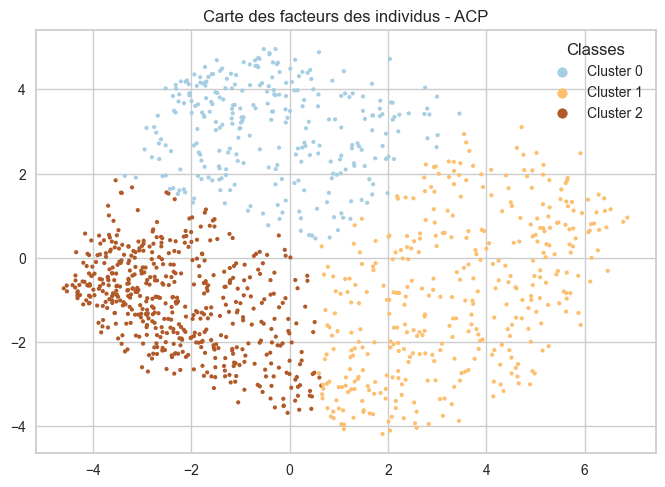

In [63]:
# Visualisation sur le plan factoriel

plt.scatter(loading_pca.values[:, 0], loading_pca.values[:, 1], c=clusters_pca3, s=4, linewidths=1, cmap=cmap)
for cluster in np.unique(clusters_pca3):
    plt.scatter([], [], c=cmap(cluster), label=f'Cluster {cluster}')  # Ajouter une entrée de légende pour chaque cluster

# Afficher la légende
plt.legend(scatterpoints=1, title='Classes')
plt.title("Carte des facteurs des individus - ACP")

plt.show()

A l'image de la classification en 6 clusters, avec 3 clusters nous constatons des séparations bien distinctes entre les classes, ce qui est l'objectif recherché. Le résultat confirme bien le résultat du score silhouette qui recommandait de construire 3 classes.

### 4.1.3 - Comparaison des résultats de la classification par K-means

* Avec une inspection visuelle :

On regarde comment les points sont dispersés dans les graphiques des plans factoriels de l'ACP. Idéalement, les points appartenant au même cluster devraient être proches les uns des autres, et les différents clusters devraient être séparés clairement. Plus la séparation entre les clusters est nette, meilleure est la classification. En se basant sur ce critère, les classifications avec 6 ou 3 clusters semblent plus pertinentes, si on se base uniquement sur la visualisation sur le premier plan factoriel.

* Silhouette : 

La silhouette est une mesure de la cohésion et de la séparation des clusters dans un ensemble de données. Pour chaque point de données, la silhouette mesure à quel point il est similaire à son propre cluster par rapport aux autres clusters. La valeur de la silhouette varie de -1 à 1, où une valeur élevée indique que le point est bien assorti à son propre cluster et mal assorti aux clusters voisins. Une silhouette proche de 1 indique une bonne séparation entre les clusters, tandis qu'une silhouette proche de -1 indique une mauvaise séparation et que le point pourrait être attribué à un cluster voisin.

* R-Square (RSQ) : 

Dans le contexte de la classification, le coefficient de détermination (R-squared) mesure la proportion de l'inertie inter-classe. Plus le R-squared est proche de 1, meilleure est la classification.


* Calcul de l'inertie (SSE) :

Pour cette métrique, on mesure la somme des carrés des distances euclidiennes entre chaque point de données et le centroïde de son cluster attribué. L'objectif principal du K-means est de minimiser cette inertie SSE, ce qui revient à minimiser la dispersion intra-cluster, assurant ainsi que les points à l'intérieur de chaque cluster sont similaires les uns aux autres tout en étant différents des points dans les autres clusters.

* Calinski-Harabasz (CH) :

Nous allons utiliser le score Calinski-Harabasz. Il s'agit d'un ratio de la dispersion entre les clusters sur la dispersion au sein des clusters. Plus le score est élevé, meilleure est la séparation entre les clusters.

Nous allons créer une fonction qui va nous peremettre de mesurer la performance et la pertinence de nos classifications selon les critères énoncés ci-dessus. Puisque le calcul de l'inertie inter-clusters et intra_clusters n'est pas une fonction automatique des modèles suivant les classifications utilisées, nous allons également définir ces fonctions manuellement.

In [64]:
from sklearn.metrics import silhouette_score, r2_score, calinski_harabasz_score

def calculate_inertia(data, clusters):
    """
    Calcule l'inertie d'un clustering à partir des données et des clusters assignés
    à chaque point.

    Args:
    - data (array-like): Les données d'entrée, une matrice où chaque ligne
      représente une observation et chaque colonne représente une caractéristique.
    - clusters (array-like): Un tableau contenant les étiquettes de cluster assignées
      à chaque point dans les données.

    Returns:
    - inertia (float): L'inertie du clustering.
    """
    # Calculer les centroïdes de chaque cluster
    centroids = np.array([np.mean(data[clusters == i], axis=0) for i in np.unique(clusters)])
    
    inertia = 0
    for i, centroid in enumerate(centroids):
        # Sélectionner les points appartenant au cluster i
        cluster_points = data[clusters == i]
        # Calculer la distance euclidienne entre chaque point et son centroïde
        distances = np.linalg.norm(cluster_points - centroid, axis=1)
        # Ajouter la somme des carrés de ces distances à l'inertie totale
        inertia += np.sum(distances ** 2)
    return inertia


def calculate_centroid_distances(data, clusters):
    # Trouver les indices des points pour chaque cluster
    cluster_indices = [np.where(clusters == i)[0] for i in np.unique(clusters)]

    # Calculer les centroïdes pour chaque cluster
    centroids = [np.mean(data.values[indices, :], axis=0) for indices in cluster_indices]

    # Initialiser une matrice pour stocker les distances des points aux centroïdes
    centroid_distances = np.zeros((len(data.values), len(centroids)))

    # Calculer les distances des points aux centroïdes pour chaque point
    for i, point in enumerate(data.values):
        for j, centroid in enumerate(centroids):
            centroid_distances[i, j] = np.linalg.norm(point - centroid)

    return centroid_distances
    

def performance(data, clusters) : 
    # Calcul de l'inertie totale
    total_inertia = calculate_inertia(data, clusters)

    # Calcul de l'inertie interclasse
    centroid_distances = calculate_centroid_distances(data, clusters)
    interclass_inertia = np.sum(np.min(centroid_distances, axis=1))

    # Calcul du R-squared
    r_squared = interclass_inertia / total_inertia
    
    # Calcul du sse
    sse = total_inertia - interclass_inertia

    # Calcul de la silhouette
    silhouette = silhouette_score(data, clusters)

    # Calcul du score Calinski-Harabasz
    ch_score = calinski_harabasz_score(data, clusters)

    print("Silhouette Score :", silhouette)
    print("R-squared Score :", r_squared)
    print("SSE :", sse) 
    print("Calinski-Harabasz Score :", ch_score)
    

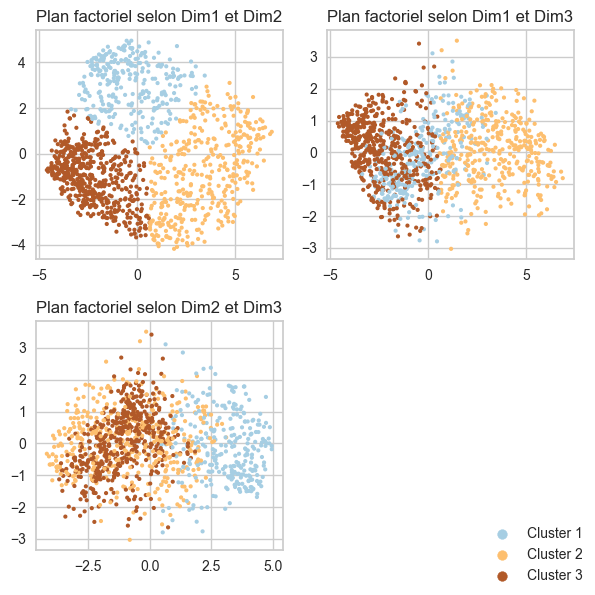

In [65]:
f = 3
# Liste pour stocker les étiquettes des clusters
labels = []
fig, axes =plt.subplots(f-1,f-1,figsize=(f*2, f*2))

for i in range(f-1): 
    for j in range(f-i-1):

        axes[i,j].scatter(loading_pca.values[:, i], loading_pca.values[:, i+j+1], c=clusters_pca3, s=4, linewidths=1, cmap=cmap)
        axes[i,j].set_title(f'Plan factoriel selon Dim{i+1} et Dim{i+j+2}')
        # Générer les étiquettes des clusters
        
# Créer une légende pour les clusters
for cluster in np.unique(clusters_pca3):
    plt.scatter([], [], c=cmap(cluster), label=f'Cluster {cluster+1}')  # Ajouter une entrée de légende pour chaque cluster

# Afficher la légende
plt.figlegend(loc='lower right', fontsize='small')
fig.delaxes(axes[1,1])

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher la figure
plt.show()


* Premier graphique (Dim1 et Dim2) :

Les stations sont divisées en trois groupes assez distincts sur le plan des première et deuxième composantes principales. Ce plan est le plus important car il est le premier plan factoriel qui permet de représenter 64% de la variance. C'est le plus gros poucentage, les analyses de ce graphique sont donc les plus importantes et représentatives.

* Deuxième graphique (Dim1 et Dim3) :

Ce plan montre les clusters le long de la première et de la troisième composante principale. Les clusters semblent moins séparés que dans le premier graphique, avec une distribution plus mélangée, indiquant que la troisième composante principale ne distingue pas aussi efficacement les clusters que la deuxième.

* Troisième graphique (Dim2 et Dim3) :

Dans cette vue, les clusters sont affichés le long de la deuxième et de la troisième composante principale. Les groupes semblent plus mélangés que dans le premier graphique, ce qui suggère que Dim1 pourrait être le principal contributeur à la séparation des clusters. Cela confirme également l'analyse de l'ACP.

* Interprétation globale :

La classification K-means montre qu'un regroupement en 3 clusters est pertinent et apporte visuallement des distincitions nettes entre les clusters, surtout selon le premier plan factoriel de l'ACP. Cependant, certains chevauchements entre les clusters indiquent des similitudes les projections sur les dimensions de l'ACP entre certaines stations. Pour une interprétation plus précise, il serait utile d'examiner les caractéristiques spécifiques et la signification des clusters. Nous pourrions comparer les clusters obtenus aux sens et significations apportés aux dimensions de l'ACP, réalisés dans la partie précédente.

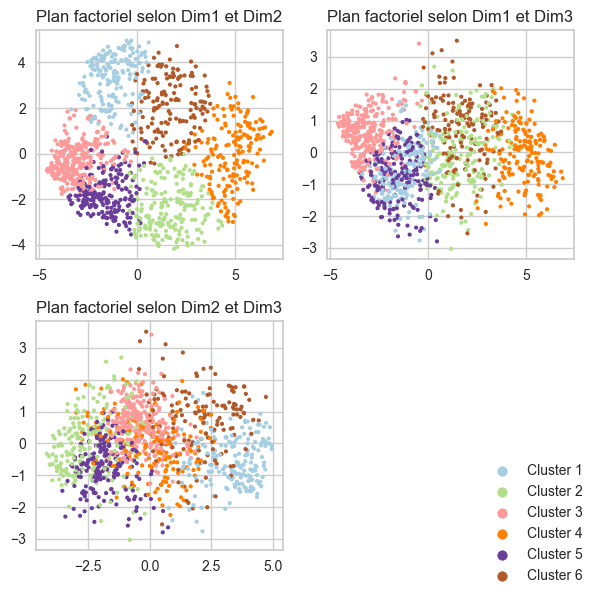

In [66]:
f = 3
cmap = plt.get_cmap('Paired',6)

# Liste pour stocker les étiquettes des clusters
labels = []
fig, axes =plt.subplots(f-1,f-1,figsize=(f*2, f*2))

for i in range(f-1):
    for j in range(f-i-1):

        axes[i,j].scatter(loading_pca.values[:, i], loading_pca.values[:, i+j+1], c=clusters_pca6, s=4, linewidths=1, cmap=cmap)
        axes[i,j].set_title(f'Plan factoriel selon Dim{i+1} et Dim{i+j+2}')
        # Générer les étiquettes des clusters
        
# Créer une légende pour les clusters
for cluster in np.unique(clusters_pca6):
    plt.scatter([], [], c=cmap(cluster), label=f'Cluster {cluster+1}')  # Ajouter une entrée de légende pour chaque cluster

# Afficher la légende
plt.figlegend(loc='lower right', fontsize='small')
fig.delaxes(axes[1,1])

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher la figure
plt.show()

Interprétation : 

* Premier graphique (Dim1 et Dim2) :

Les stations sont représentées sur le premier plan factoriel, qui combine les deux premières composantes principales. Il semble y avoir une bonne séparation entre les clusters, en particulier le long de la première dimension principale (Dim1), qui est la plus significative en termes de variance expliquée.

* Deuxième graphique (Dim1 et Dim3) :

Ce plan factoriel montre les clusters selon la première et la troisième dimension principale. Les clusters semblent moins distincts que sur le premier plan factoriel, ce qui peut indiquer que Dim3 contribue moins à la séparation des clusters que Dim2.

* Troisième graphique (Dim2 et Dim3) :

Les données sont projetées sur le deuxième et le troisième axe principal. Les clusters semblent se chevaucher plus sur ce plan que sur le premier plan factoriel. Cela peut suggérer que les deuxième et troisième composantes principales partagent certaines informations sur les stations ou que les différences entre les clusters sont moins prononcées selon ces axes.

* Interprétation générale :

La classification en six clusters a permis d'identifier des groupes de stations avec des profils de chargement similaires sur la semaine analysée. La dispersion des clusters sur ces graphiques reflète la variabilité des taux de chargement capturée par les composantes principales de l'ACP. Le chevauchement des clusters sur les plans factoriels suggère que, si certains clusters peuvent être facilement distingués en fonction de leurs profils de chargement, d'autres partagent des caractéristiques plus subtiles ou des variations similaires dans les taux de chargement, rendant leur séparation moins évidente.

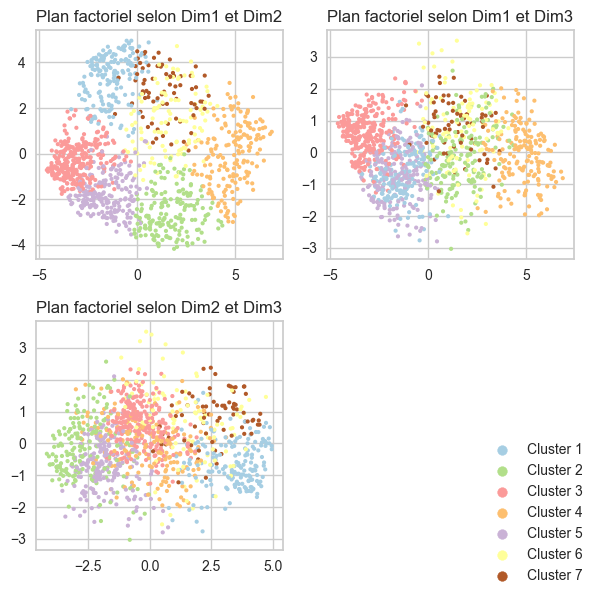

In [67]:
f = 3
cmap = plt.get_cmap('Paired',7)

# Liste pour stocker les étiquettes des clusters
labels = []
fig, axes =plt.subplots(f-1,f-1,figsize=(f*2, f*2))

for i in range(f-1):
    for j in range(f-i-1):

        axes[i,j].scatter(loading_pca.values[:, i], loading_pca.values[:, i+j+1], c=clusters_pca7, s=4, linewidths=1, cmap=cmap)
        axes[i,j].set_title(f'Plan factoriel selon Dim{i+1} et Dim{i+j+2}')
        # Générer les étiquettes des clusters
        
# Créer une légende pour les clusters
for cluster in np.unique(clusters_pca7):
    plt.scatter([], [], c=cmap(cluster), label=f'Cluster {cluster+1}')  # Ajouter une entrée de légende pour chaque cluster

# Afficher la légende
plt.figlegend(loc='lower right', fontsize='small')
fig.delaxes(axes[1,1])

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher la figure
plt.show()

On aurait tout d'abord une analyse analogue avec la classification selon 6 clusters en terme de représentation sur les axes des dimensions. En rajoutant un cluster supplémentaire, on pourrait s'attendre à obtenir une meilleure classification et une information aditionnelle. Cependant, on observe que les clusters 6 et 7 ne sont pas distincts sur aucun des trois plans factoriels. On pourrait se questionner sur la pertinence de ce cluster supplémentaire, même s'il correspond au nombre optimal de clusters selon la méthode du coude. Il est également possible que les clusters 6 et 7 soient clairementn séparés dans une dimension supérieure de l'ACP non représenté ici.

In [68]:
# Comparaison en utilisant les métriques
print("K-means avec 3 clusters")
print("")
performance(loading, clusters_pca3)
print("")
print("------------------------")
print("")
print("K-means avec 6 clusters")
print("")
performance(loading, clusters_pca6)
print("")
print("------------------------")
print("")
print("K-means avec 7 clusters")
print("")
performance(loading, clusters_pca7)

K-means avec 3 clusters

Silhouette Score : 0.27260252439365784
R-squared Score : 0.29192139655522253
SSE : 9274.688728560297
Calinski-Harabasz Score : 478.04475120169656

------------------------

K-means avec 6 clusters

Silhouette Score : 0.17283928962056183
R-squared Score : 0.3270899088906152
SSE : 6903.656711028462
Calinski-Harabasz Score : 308.9862159172658

------------------------

K-means avec 7 clusters

Silhouette Score : 0.1782562912334638
R-squared Score : 0.334718961747989
SSE : 6552.440201310932
Calinski-Harabasz Score : 276.19386038370374


Nous utilisons ici les métriques définies précédemment pour comparer les classifications. Pour cette première comparaison selon ces critères, nous allons détailler notre analyse, nous serons plus succins dans la suite de ce notebook.

* Pour K-Means avec 3 clusters :

Silhouette Score (0.272) : Ce score est relativement élevé, indiquant que les clusters sont bien définis et séparés les uns des autres.

R-squared Score (0.292) : Ce score modéré suggère que les clusters expliquent une proportion raisonnable de la variance dans les données. On pourrait néanmoins espérer une valeur supérieure pour être satisfait de notre classification.

SSE (9275) : Le Sum of Squared Errors (SSE) est assez élevé, ce qui implique que les points sont relativement éloignés de leurs centroïdes de cluster. Cela s'explique par le choix de 3 clusters qui regroupent forcéments plus de points au sein de chaque cluster.

Calinski-Harabasz Score (478) : Ce score est le plus élevé parmi les trois configurations, indiquant une bonne séparation et cohésion des clusters, et confirmant l'analyse du score silhouette.


* Pour K-Means avec 6 clusters :

Silhouette Score (0.175) : Le score a diminué par rapport à 3 clusters, ce qui suggère que la séparation des clusters est moins claire, comme observé sur les différents plans factoriels.
 
R-squared Score (0.327) : Ce score est meilleur qu'avec 3 clusters, ce qui signifie que les clusters expliquent une plus grande part de la variance totale des données.

SSE (6896) : La baisse du SSE indique que les points sont plus proches de leurs centroïdes, signalant un ajustement plus serré. Cela est également dû à l'augmentation du nombre de clusters.

Calinski-Harabasz Score (309) : Ce score est inférieur à celui pour 3 clusters, ce qui peut indiquer que la qualité du clustering a diminué en termes de séparation et de cohésion, en adéquation avec le score silhouette.

* Pour K-Means avec 7 clusters :

Silhouette Score (0.180) : Ce score est légèrement supérieur à celui pour 6 clusters, indiquant une petite amélioration dans la définition des clusters. Cela confirme le choix de 7 clusters par la méthode du coude, même si nous n'avons pas eu de validation visuelle sur les plans factoriels.

R-squared Score (0.335) : Ce score est le plus élevé des trois, indiquant que cette configuration de cluster explique le mieux la variance des données.

SSE (6548) : La poursuite de la baisse du SSE indique une amélioration de la proximité des points à leurs centroïdes.

Calinski-Harabasz Score (276) : La diminution de ce score par rapport à 6 clusters suggère que la séparation des clusters pourrait ne pas être aussi bonne avec un cluster supplémentaire.


Interprétation globale :

Si l'objectif est de maximiser la séparation et la cohésion des clusters, le K-Means avec 3 clusters semble être le meilleur choix en fonction du score de silhouette et du score de Calinski-Harabasz. Cependant, si l'objectif est de minimiser la distance totale des points à leurs centroïdes de cluster (SSE) ou d'expliquer le plus de variance possible dans les données (R-squared), le K-Means avec 7 clusters serait préférable.

## 4.2 - Classification des données issues de l'ACP par Gaussian Mixture Model (GMM)

La classification par GMM (Gaussian Mixture Model) est une méthode de modélisation probabiliste où les données sont considérées comme étant générées à partir d'un mélange de plusieurs distributions gaussiennes. Elle est utilisée pour identifier des clusters dans des données en supposant que chaque cluster suit une distribution gaussienne. Cette approche est flexible et peut gérer des distributions non sphériques ou de tailles inégales de clusters.

### 4.2.1 - Détermination du nombre optimal de clusters pour la classification GMM

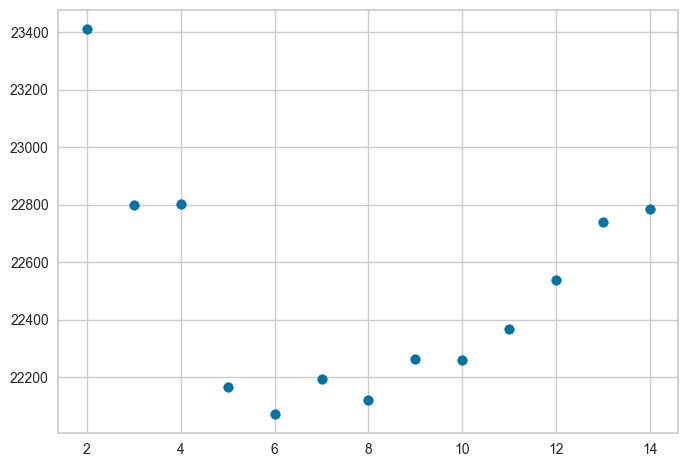

In [69]:
# En utilisant le critère BIC
k_max = 15

bic = []
for k in range(2, k_max):
    gmm = GaussianMixture(n_components=k, init_params='kmeans', n_init=3)
    gmm.fit(loading_pca)
    bic.append(gmm.bic(loading_pca))
bic = np.array(bic)

plt.scatter(range(2, k_max), bic)
plt.show()

La première méthode consiste à utiliser le critère BIC. On cherche le modèle qui offre le meilleur équilibre entre la qualité de l'ajustement et la simplicité du modèle. En pratique, cela signifie souvent choisir le modèle qui a le critère BIC le plus bas.

On doit chercher le point où la valeur du BIC cesse de diminuer de manière significative, ce qui est souvent appelé le "coude" de la courbe. Juste après ce coude, l'ajout de clusters supplémentaires n'apporte pas d'amélioration suffisante de l'ajustement pour justifier la complexité supplémentaire du modèle (c'est-à-dire l'ajout de nouveaux paramètres).

À première vue, sur le graphique, il semble que le BIC diminue significativement jusqu'à 5 ou 6 clusters, après quoi les diminutions sont plus graduelles. Cela suggère que le nombre optimal de clusters pour votre GMM pourrait être autour de 5 ou 6.

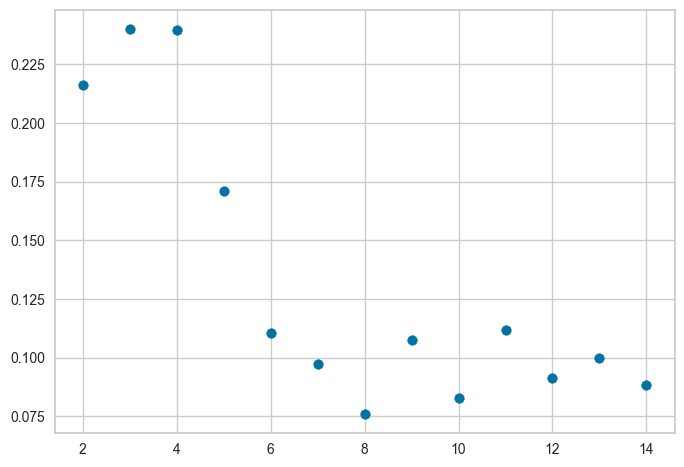

In [70]:
# En utilisant le score silhouette
k_max = 15

silhouette = []
for k in range(2, k_max):
    gmm = GaussianMixture(n_components=k, init_params='kmeans', n_init=3)
    clusters_gmm = gmm.fit_predict(loading_pca)
    silhouette.append( silhouette_score(loading_pca, clusters_gmm, metric='euclidean') )
silhouette = np.array(silhouette)

plt.scatter(range(2, k_max), silhouette)
plt.show()

Le graphique du score silhouette indique que le score est le plus élevé pour 3 clusters, ce qui implique une bonne séparation et cohésion des clusters à ce niveau. Cela suggère que trois clusters pourraient offrir la meilleure structure de clustering pour vos données selon le modèle de mélange gaussien (GMM).

Le choix entre 3 clusters (recommandé par le score silhouette) et 6 clusters (suggéré par le BIC) dépend de plusieurs facteurs :

* Signification des clusters:

Si 3 clusters donnent une interprétation claire et significative des données qui est utile pour votre analyse ou pour des applications pratiques, alors la simplicité de cette solution peut être préférable.

* Complexité du modèle:

Un modèle avec 6 clusters est plus complexe et pourrait capturer des nuances plus fines dans les données. Si ces nuances sont importantes pour l'objectif de l'analyse, cela justifierait de choisir un modèle avec plus de clusters.

* Qualité de l'ajustement vs interprétabilité:

Le score BIC favorise les modèles qui ajustent bien les données tout en pénalisant la complexité. Un score BIC plus bas pour 6 clusters peut indiquer un meilleur ajustement global.

* Risque de surajustement:

Avec un plus grand nombre de clusters, il y a un risque de surajustement, surtout puisque nous avons un nombre limité de données. Les 3 clusters recommandés par le score silhouette pourraient éviter ce risque.

* Objectifs de l'analyse:

Si l'objectif est de distinguer clairement des groupes très différents, un score silhouette élevé avec 3 clusters peut être suffisant. Si l'objectif est d'identifier des sous-groupes plus spécifiques ou de capter des variations subtiles, alors un BIC plus bas avec 6 clusters peut être plus approprié.

### 4.2.2 - Classification par Gaussian Mixture Model (GMM)

Avec la méthode du K-means, nous avions 7 clusters, nous décidons dans un premier temps de garder le même nombre de clusters afin de pouvoir comparer les méthodes sur plus de critères. Dans un second temps, nous utiliseron les résultats des critère BIC et score silhouette déterminés dans la partie précédente.

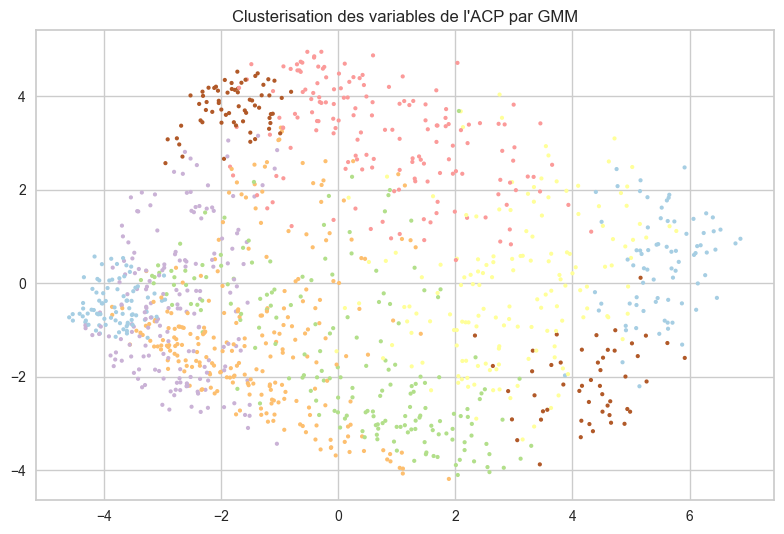

In [71]:
K = 7 # D'après K-means

cmap = plt.get_cmap('Paired', K)

gmm7 = GaussianMixture(n_components=K, n_init=3) # n_init = nombre d'initialisations à faire
clusters_gmm7 = gmm7.fit_predict(loading_pca)

plt.scatter(loading_pca.values[:,0], loading_pca.values[:,1], c=clusters_gmm, s=4, linewidths=1, cmap=cmap)

plt.title("Clusterisation des variables de l'ACP par GMM")

plt.tight_layout()
plt.show()

Interprétation : 

* Dispersion des clusters : on voit que les clusters soient assez bien dispersés dans l'espace des composantes principales, ce qui pourrait indiquer que le GMM a pu distinguer des groupes distincts dans les données.

* Chevauchement : il y a quelques zones où les clusters semblent se chevaucher, ce qui peut être naturel en fonction de la densité des données et de leurs distributions. Cependant, un chevauchement important pourrait indiquer que certains clusters ne sont pas bien définis. Au centre du graphique, on observe un chevauchement plus important.

* Distribution des points : certains clusters ont des points qui sont plus dispersés (par exemple, le cluster en haut, légèrement à droite), tandis que d'autres sont plus denses (comme les cluster en bas). Cela pourrait refléter des différences de variabilité ou de cohésion au sein des clusters.

* Taille des clusters : il y a des variations dans la taille des clusters, avec certains ayant plus de points que d'autres. Cela peut être significatif, reflétant peut-être la prévalence de certaines caractéristiques dans votre ensemble de données.


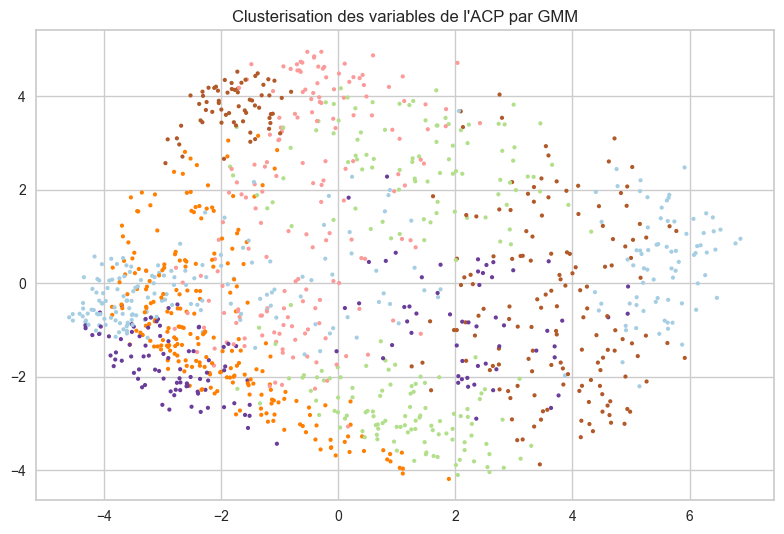

In [72]:
K = 6 # D'après critère BIC

cmap = plt.get_cmap('Paired', K)

gmm6 = GaussianMixture(n_components=K, n_init=3) # n_init = nombre d'initialisations à faire
clusters_gmm6 = gmm6.fit_predict(loading_pca)

plt.scatter(loading_pca.values[:,0], loading_pca.values[:,1], c=clusters_gmm, s=4, linewidths=1, cmap=cmap)

plt.title("Clusterisation des variables de l'ACP par GMM")

plt.tight_layout()
plt.show()

Dans ce graphique avec 6 clusters identifiés par un modèle de mélange gaussien (GMM), on observe que les clusters semblent être répartis de manière assez distincte dans l'espace de l'ACP. Chaque couleur représente un cluster différent, et il semble y avoir moins de chevauchement entre les clusters comparé au graphique avec 7 clusters, ce qui pourrait indiquer une séparation plus nette.

Comparaison avec 7 clusters :

* 6 Clusters : Les groupes semblent être relativement bien séparés, mais avec un certain degré de chevauchement entre les clusters, surtout autour du centre du graphique. Les clusters semblent avoir une bonne répartition et les tailles des clusters paraissent équilibrées, sans qu'un cluster ne domine largement les autres en nombre de points.

* 7 Clusters : Avec un cluster supplémentaire, la classification cherche à affiner la séparation des données. Cela peut parfois améliorer la spécificité de chaque cluster mais peut également conduire à une segmentation excessive et à des clusters moins interprétables, et des chevauchements.

Si le cluster supplémentaire identifié avec 7 clusters ne semble pas avoir une signification distincte ou n'ajoute pas à la compréhension des données, alors il pourrait être préférable de conserver une solution à 6 clusters pour des raisons de simplicité et d'interprétabilité. En revanche, si sa signification est pertinente alors ce choix de classification est justifiée.

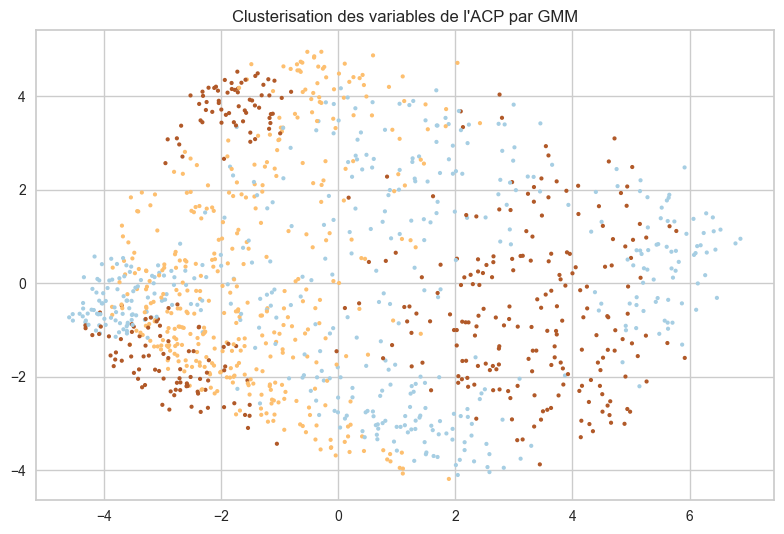

In [73]:
K = 3 # D'après score silhouette

cmap = plt.get_cmap('Paired', K)

gmm3 = GaussianMixture(n_components=K, n_init=3) # n_init = nombre d'initialisations à faire
clusters_gmm3 = gmm3.fit_predict(loading_pca)

plt.scatter(loading_pca.values[:,0], loading_pca.values[:,1], c=clusters_gmm, s=4, linewidths=1, cmap=cmap)

plt.title("Clusterisation des variables de l'ACP par GMM")

plt.tight_layout()
plt.show()

Ce graphique montre la classification en 3 clusters par un modèle de mélange gaussien (GMM) des données issues de l'ACP. En comparant cette approche à celles avec 6 et 7 clusters, voici ce que l'on peut observer :

* 3 clusters : Avec seulement trois clusters, le modèle offre une interprétation plus simple. Cependant les clusters ne sont pas très bien séparés, ce qui n'est pas très bien interprétable. Sur R, les clusters sont beaucoup plus lisibles, car le logiciel choisit les meilleurs paramètres pour la méthode GMM (contrairement à Python où il y en qu'un seul par défaut).

* 6 Clusters : L'augmentation du nombre de clusters permet de capturer plus de détails et peut-être de trouver des sous-groupes au sein des données qui ne sont pas apparents avec seulement 3 clusters. Néanmoins, cela rend le modèle plus complexe et peut parfois introduire un chevauchement entre les clusters.

* 7 Clusters : Avec encore plus de clusters, le modèle essaie d'affiner davantage la classification. Cela peut conduire à une meilleure séparation des données dans certains cas, mais aussi à une complexité accrue et potentiellement à une perte d'interprétabilité.

La classification en 3 clusters montre que les données ne sont pas très bien séparées en trois groupes généraux. Cependant, si les nuances entre ces groupes sont importantes pour l'analyse ou l'application prévue, les classifications à 6 ou 7 clusters pourraient être plus appropriées même si note des chevauchements.

### 4.2.3 - Comparaison des différentes classifications par GMM

In [74]:
# Comparaison en utilisant les métriques
print("GMM avec 3 clusters")
print("")
performance(loading, clusters_gmm3)
print("")
print("------------------------")
print("")
print("GMM avec 6 clusters")
print("")
performance(loading, clusters_gmm6)
print("")
print("------------------------")
print("")
print("GMM avec 7 clusters")
print("")
performance(loading, clusters_gmm7)

GMM avec 3 clusters

Silhouette Score : 0.1801835616985134
R-squared Score : 0.25004200217730577
SSE : 11785.667240670356
Calinski-Harabasz Score : 299.70559161832995

------------------------

GMM avec 6 clusters

Silhouette Score : 0.07095796287079564
R-squared Score : 0.27935265053266894
SSE : 8879.630914758854
Calinski-Harabasz Score : 217.66932862555717

------------------------

GMM avec 7 clusters

Silhouette Score : 0.0475196098512962
R-squared Score : 0.2828304567642078
SSE : 8699.084541233391
Calinski-Harabasz Score : 187.224724621519


Interprétation :

* GMM avec 3 clusters :

Silhouette Score : 0.180, ce qui est inférieur à celui du K-means (0.272). Cela suggère que les clusters ne sont pas aussi bien séparés et que les stations sont moins bien assorties à leurs clusters propres dans le GMM. R-squared Score: 0.250, nettement inférieur à celui de K-means (0.292), indiquant que les clusters expliquent moins bien la variance dans les données. SSE: 11786, plus élevé que pour le K-means (9275), montrant que les stations sont en moyenne plus éloignées des centres de leurs clusters dans le GMM. Calinski-Harabasz Score: 299, également inférieur à celui du K-means (478), suggérant que les clusters sont moins bien définis.

* GMM avec 6 clusters :

Silhouette Score : 0.069, beaucoup plus faible que le K-means avec 6 clusters (0.175), indiquant que la séparation entre les clusters est pauvre dans le modèle GMM. R-squared Score: 0.279, légèrement inférieur au K-means (0.327). SSE: 8920, ce qui est plus élevé que celui du K-means (6896), indiquant que les stations sont plus éloignées de leurs centres de clusters dans le GMM. Calinski-Harabasz Score: 216, plus faible que le K-means (309), ce qui implique des clusters moins bien définis dans le GMM.

* GMM avec 7 clusters :

Silhouette Score : 0.071, plus faible également que le K-means avec 7 clusters (0.180). R-squared Score : 0.283, plus bas que le K-means (0.327), suggérant une explication moins efficace de la variance. SSE : 8521, plus élevé que le K-means (6548), montrant que les stations sont, en moyenne, plus éloignées de leurs centres de clusters dans le GMM. Calinski-Harabasz Score : 195, moins bon que celui du K-means (276).

Comparaison globale :

Les clusters formés par K-means semblent être plus cohérents, comme indiqué par des scores de silhouette plus élevés. Le K-means fournit des clusters mieux séparés, selon les scores de Calinski-Harabasz. K-means surpasse le GMM en termes de R-squared, indiquant une meilleure explication de la variance des données par les clusters. Enfin, le K-means montre des clusters plus compacts avec des SSE inférieurs.

En conclusion, sur les données réduites par ACP, le K-means semble produire des résultats supérieurs à ceux du GMM, avec des clusters plus définis, une meilleure séparation et cohérence, et une plus grande explication de la variance dans les données.


## 4.3 - Classification des données issues de l'ACP par Classification Ascendante Hiérarchique (CAH)

Le principe de la CAH est de rassembler des individus selon un critère de ressemblance défini au préalable qui s'exprimera sous la forme d'une matrice de distances, exprimant la distance existant entre chaque individu pris deux à deux. Deux observations identiques auront une distance nulle.

### 4.3.1 - Détermination du nombre optimal de clusters pour la classification CAH

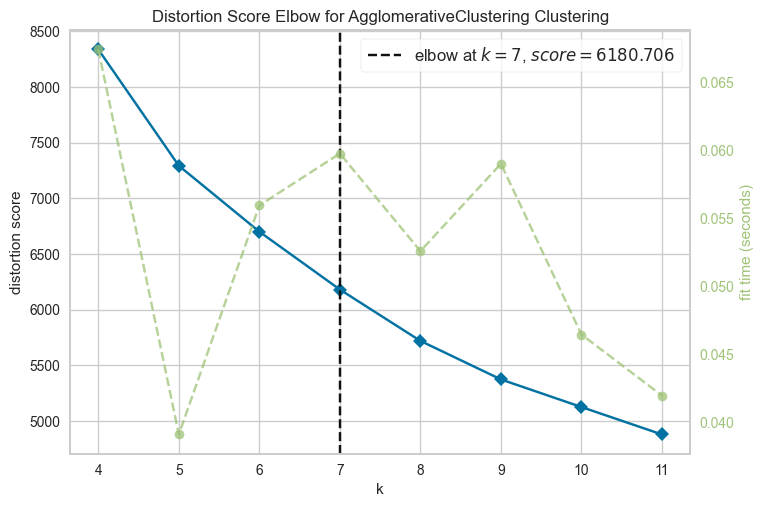

In [75]:
ac = AgglomerativeClustering(linkage="ward", compute_distances=True)
visualizer = KElbowVisualizer(ac, k=(4,12))

visualizer.fit(loading_pca)        
visualizer.show()   

plt.show()

Le graphique montre que le nombre optimal de clusters pour la méthode du CAH de notre jeu de données est de 7. Ce choix équilibre bien la compacité des clusters et la complexité computationnelle, ce qui devrait permettre une bonne segmentation des stations Vélib.

### 4.3.2 - Choix du type d'arbre pour la classification CAH

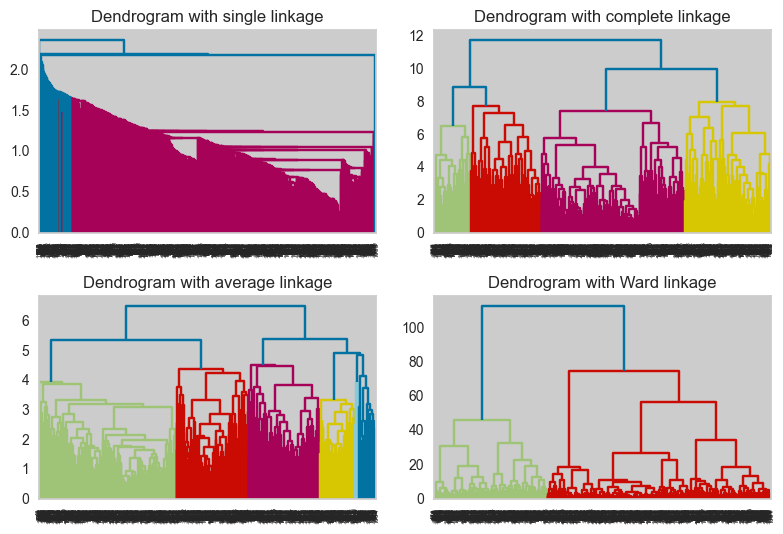

In [76]:
plt.subplot(2,2,1)
linkage_matrix = sch.linkage(loading_pca, method='single')
sch.dendrogram(linkage_matrix)
plt.title("Dendrogram with single linkage")

plt.subplot(2,2,2)
linkage_matrix = sch.linkage(loading_pca, method='complete')
sch.dendrogram(linkage_matrix)
plt.title("Dendrogram with complete linkage")

plt.subplot(2,2,3)
linkage_matrix = sch.linkage(loading_pca, method='average')
sch.dendrogram(linkage_matrix)
plt.title("Dendrogram with average linkage")

plt.subplot(2,2,4)
linkage_matrix = sch.linkage(loading_pca, method='ward')
sch.dendrogram(linkage_matrix)
plt.title("Dendrogram with Ward linkage")

plt.tight_layout()
plt.show()

Ces graphiques sont des dendrogrammes, qui représentent les résultats d'une analyse de clustering hiérarchique appliquée à nos données issues de l'ACP. Chaque dendrogramme utilise une méthode de liaison différente pour calculer la distance entre les clusters :

* Single Linkage (Liaison simple) : Ce dendrogramme montre que les clusters sont formés en connectant les points les plus proches des différents clusters. Cela tend à produire des clusters longs et filiformes. Il y a une grande distance avant que les clusters ne se rejoignent, ce qui suggère une structure de données très disparate.

* Complete Linkage (Liaison complète) : Ici, les clusters sont formés en connectant les points les plus éloignés des différents clusters. Cela produit des clusters plus uniformes. Le dendrogramme montre une structure plus équilibrée mais avec des niveaux de similarité variables lorsque les clusters fusionnent.

* Average Linkage (Liaison moyenne) : Cette méthode prend la distance moyenne entre tous les points des deux clusters. Les clusters fusionnent à un niveau de distance qui semble plus cohérent que celui de la liaison simple mais moins uniforme que celui de la liaison complète.

* Ward Linkage (Liaison de Ward) : Cette méthode cherche à minimiser la somme des carrés à l'intérieur de tous les clusters (c'est-à-dire l'inertie). C'est une méthode assez objective pour minimiser la variance à l'intérieur des clusters. Les hauteurs des fusions montrent que les clusters sont relativement homogènes et que la structure des données est bien définie.

Nous choisissons dans un premier temps de valider les méthodes 'complete' et 'ward', que nous comparerons dans une partie ultérieure.

### 4.3.3 - Classification par CAH

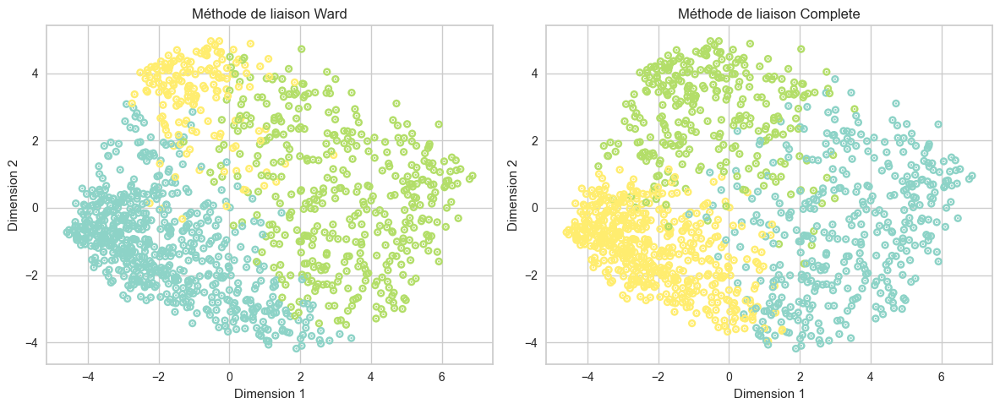

In [77]:
K = 3
# Création de la colormap
cmap = plt.get_cmap('Set3', K)

# Création de la figure et des sous-graphiques
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Premier sous-graphique pour la méthode 'ward'
ac_ward = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage="ward")
clusters_ac_ward = ac_ward.fit_predict(loading_pca)
axs[0].scatter(loading_pca['Dim1'], loading_pca['Dim2'], c=clusters_ac_ward, s=3, linewidths=5, cmap=cmap)
axs[0].set_title('Méthode de liaison Ward')
axs[0].set_xlabel('Dimension 1')
axs[0].set_ylabel('Dimension 2')


# Deuxième sous-graphique pour la méthode 'complete'
ac_complete = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage="complete")
clusters_ac_complete = ac_complete.fit_predict(loading_pca)
axs[1].scatter(loading_pca['Dim1'], loading_pca['Dim2'], c=clusters_ac_complete, s=3, linewidths=5, cmap=cmap)
axs[1].set_title('Méthode de liaison Complete')
axs[1].set_xlabel("Dimension 1")
axs[1].set_ylabel("Dimension 2")

# Réglage de la disposition
plt.tight_layout()
plt.show()

Ces graphiques représentent les résultats de deux méthodes de clustering hiérarchique appliquées aux mêmes données : la méthode de liaison Ward à gauche et la méthode de liaison complète à droite.

* La méthode de liaison Ward minimise la variance au sein des clusters. Sur le graphique de gauche, on peut voir que cette méthode a regroupé les données en clusters qui semblent assez compacts et bien délimités.

* La méthode de liaison complète, en revanche, considère la distance maximum entre les paires de points dans deux clusters différents. Sur le graphique de droite, les clusters semblent moins définis et il y a plus de chevauchement entre eux, avec une différenciation moins claire des groupes.

Pour choisir la meilleure méthode entre Ward et Complete, on peut considérer considérer :

* Cohésion et séparation : La méthode Ward semble produire des clusters plus cohésifs et mieux séparés, ce qui est généralement souhaité dans un clustering.

* Interprétabilité : Les clusters formés par la méthode Ward semblent plus interprétables car ils sont plus distincts, ce qui peut faciliter la compréhension des groupes au sein des données.

* Objectif de l'analyse : Si l'objectif est de minimiser la variance intra-cluster et de trouver une structure compacte, Ward est préférable. Si l'objectif est de s'assurer que les éléments d'un cluster sont entièrement distincts des autres clusters, alors Complete pourrait être envisagé.

Sur la base de ces graphiques et des critères généraux, la méthode de liaison Ward paraît être la meilleure option pour nos données, car elle produit des clusters plus définis et compacts.

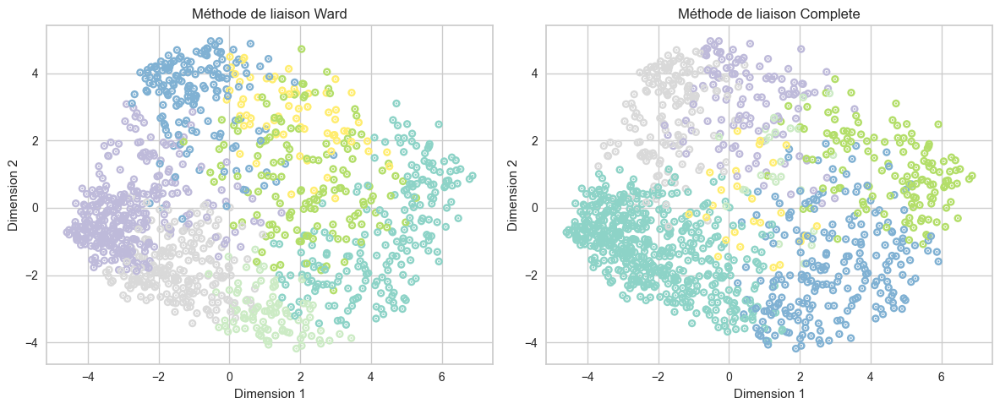

In [78]:
K = 7
# Création de la colormap
cmap = plt.get_cmap('Set3', K)

# Création de la figure et des sous-graphiques
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Premier sous-graphique pour la méthode 'ward'
ac_ward7 = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage="ward")
clusters_ac_ward7 = ac_ward7.fit_predict(loading_pca)
axs[0].scatter(loading_pca['Dim1'], loading_pca['Dim2'], c=clusters_ac_ward7, s=3, linewidths=5, cmap=cmap)
axs[0].set_title('Méthode de liaison Ward')
axs[0].set_xlabel('Dimension 1')
axs[0].set_ylabel('Dimension 2')


# Deuxième sous-graphique pour la méthode 'complete'
ac_complete7 = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage="complete")
clusters_ac_complete7 = ac_complete7.fit_predict(loading_pca)
axs[1].scatter(loading_pca['Dim1'], loading_pca['Dim2'], c=clusters_ac_complete7, s=3, linewidths=5, cmap=cmap)
axs[1].set_title('Méthode de liaison Complete')
axs[1].set_xlabel("Dimension 1")
axs[1].set_ylabel("Dimension 2")

# Réglage de la disposition
plt.tight_layout()
plt.show()

### 4.3.4 -  Comparaison des classifications par CAH

In [79]:
print("CAH avec liaisons Ward et 3 clusters")
performance(loading, clusters_ac_ward)
print("")
print("------------------------")
print("")
print("CAH avec liaisons Complete et 3 clusters")
performance(loading, clusters_ac_complete)
print("")
print("------------------------")
print("")
print("CAH avec liaisons Ward et 7 clusters")
performance(loading, clusters_ac_ward7)
print("")
print("------------------------")
print("")
print("CAH avec liaisons Complete et 7 clusters")
performance(loading, clusters_ac_complete7)

CAH avec liaisons Ward et 3 clusters
Silhouette Score : 0.22660198065408546
R-squared Score : 0.2673795916440199
SSE : 10673.061775713377
Calinski-Harabasz Score : 369.9760331918279

------------------------

CAH avec liaisons Complete et 3 clusters
Silhouette Score : 0.24888661864049688
R-squared Score : 0.28065681544734755
SSE : 9832.893761012554
Calinski-Harabasz Score : 433.31405252805314

------------------------

CAH avec liaisons Ward et 7 clusters
Silhouette Score : 0.13654072481069457
R-squared Score : 0.30968965793984593
SSE : 7450.020539821429
Calinski-Harabasz Score : 234.8410584559945

------------------------

CAH avec liaisons Complete et 7 clusters
Silhouette Score : 0.1649996283872713
R-squared Score : 0.30187231158166355
SSE : 8094.388509210921
Calinski-Harabasz Score : 204.9646292911352



* CAH avec liaisons Ward avec 3 clusters :

Silhouette Score : 0.227, ce qui est meilleur que les scores GMM pour 6 et 7 clusters (0.069 et 0.071), mais inférieur à celui de GMM pour 3 clusters (0.180) et inférieur au score de K-means pour 3 clusters (0.273). R-squared Score : 0.267, ce qui est inférieur aux scores GMM et K-means pour toutes les configurations, indiquant une moins bonne explication de la variance des données par les clusters. SSE : 10673, qui est inférieur à celui du GMM avec 3 clusters (11785) mais supérieur à celui des autres configurations de GMM et K-means. Calinski-Harabasz Score : 370, qui est supérieur aux scores de GMM pour 6 et 7 clusters, ainsi qu'à celui de GMM pour 3 clusters (299) et inférieur à celui de K-means pour 3 clusters (478).

* CAH avec liaisons Complete avec 3 clusters :

Silhouette Score : 0.249, qui est le plus élevé parmi les scores GMM et supérieur à celui des liaisons Ward, mais toujours inférieur à celui de K-means pour 3 clusters. R-squared Score : 0.281, ce qui est supérieur au premier modèle CAH et à GMM dans pour 3 et 6 clusters, sensiblement du même niveau que GMM pour 7 clusters mais inférieur à K-means pour 3, 6 et 7 clusters. SSE : 9833, ce qui est inférieur aux liaisons Ward et indique que les points sont en moyenne plus proches des centres de leurs clusters dans le modèle CAH avec liaisons Complete. Calinski-Harabasz Score : 433, qui est supérieur à celui du CAH avec liaisons Ward et de tous les scores GMM, mais toujours inférieur à celui de K-means pour 3 clusters.

* Comparaison globale :

La classification CAH avec liaisons Ward présente une qualité de clustering moyenne parmi les méthodes testées, avec des scores généralement inférieurs à ceux du K-means pour 3 clusters mais supérieurs à ceux des configurations GMM avec plus de clusters. Le CAH avec liaisons Complete a tendance à avoir des performances meilleures que la CAH pour les liaisons Ward en termes de Silhouette Score et Calinski-Harabasz Score, suggérant de meilleurs clusters en termes de séparation et de cohésion.

K-means avec 3 clusters reste supérieur en termes de silhouette et de score de Calinski-Harabasz, indiquant des clusters bien définis et distincts.

En résumé, le K-means avec 3 clusters semble offrir la meilleure performance en termes de séparation des clusters et de cohésion. La méthode CAH se trouve au milieu, avec une performance générale modeste, tandis que le CAH avec liaisons Complete est compétitif, surtout en termes de silhouette, suggérant une meilleure cohérence interne des clusters par rapport à CAH.

## 4.4 - Comparaison des différentes méthodes de classification sur les données issuées de l'ACP

En se basant sur plusieurs métriques de comparaison, nous avons vu dans les parties précédentes que bien que le K-means avec 7 clusters ait montré une meilleure explication de la variance et une compacité des clusters, le K-means avec 3 clusters semble être la meilleure méthode de clustering globale pour nos données issues de l'ACP sur de taux de chargement des stations Vélib à Paris. Cette méthode présente un bon équilibre entre les différents aspects de la qualité du clustering, offrant des clusters bien séparés et cohérents. Cependant, le choix de la meilleure méthode de clustering doit également tenir compte de l'interprétabilité des clusters et de leur utilité pour des applications pratiques. Nous développerons cet aspect dans la prochaine partie.

Le tableau ci-dessous synthétise les scores obtenus pour différentes métriques pour chaque méthode étudiée.

| Méthode                   | Nombre de Clusters | Silhouette Score | R-squared Score | SSE            | Calinski-Harabasz Score |
|---------------------------|--------------------|------------------|-----------------|----------------|------------------------|
| K-means                   | 3                  | 0.2726           | 0.2919          | 9275           | 478.0                  |
| K-means                   | 6                  | 0.1746           | 0.3273          | 6896           | 309.4                  |
| K-means                   | 7                  | 0.1800           | 0.3349          | 6548           | 276.4                  |
| GMM                       | 3                  | 0.1801           | 0.2500          | 11786          | 216.1                  |
| GMM                       | 6                  | 0.0693           | 0.2786          | 8920           | 216.1                  |
| GMM                       | 7                  | 0.0708           | 0.2835          | 8521           | 194.9                  |
| CAH (liaisons Ward)       | 3                  | 0.2266           | 0.2674          | 10673          | 370.0                  |
| CAH (liaisons Complete)   | 3                  | 0.2489           | 0.2807          | 9833           | 433.3                  |


## 4.5 - Interprétation et signification des clusters sur les données de l'ACP

### 4.5.1 - Interprétation des résultats par K-means avec 3 clusters (meilleur clustering)

Nous allons maintenant essayer d'interpréter les résultats de la classification sur les plans de l'ACP, en s'appuyant sur la méthode de clustering ayant donné les meilleurs résultats : le K-means avec 3 clusters. On va ici s'intéresser uniquement aux trois premiers plans factoriel, que nous avons vu précédemment. Ce choix s'explique par le fait que les trois premières composantes principales semblent être les plus interprétables.

Rappel des résultats précédents d'interprétation sur les trois premiers plans factoriels de l'ACP :

* dimension 1 : chargement moyen de la station
* dimension 2 : station plus remplie aux horaires de bureau (valeur positive) ou la nuit (valeur négative)
* dimension 3 : station plus remplie le weekend (valeur positive) ou en semaine (valeur négative)


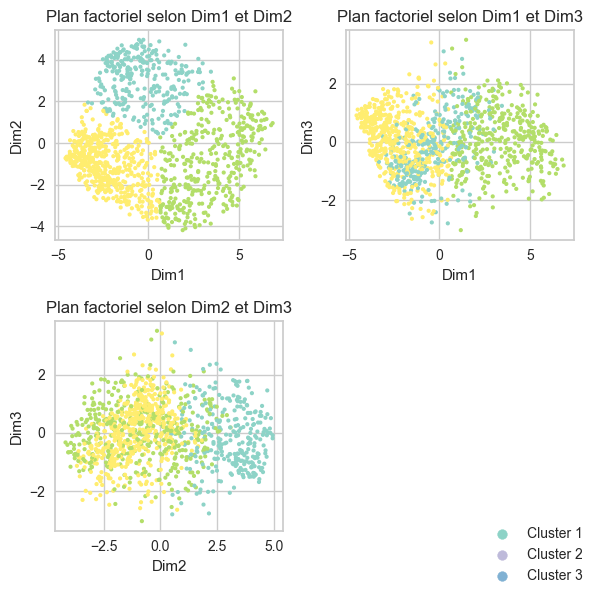

In [80]:
f = 3
# Liste pour stocker les étiquettes des clusters
labels = []
fig, axes =plt.subplots(f-1,f-1,figsize=(f*2, f*2))

for i in range(f-1):
    for j in range(f-i-1):

        axes[i,j].scatter(loading_pca.values[:, i], loading_pca.values[:, i+j+1], c=clusters_pca3, s=4, linewidths=1, cmap=cmap)
        axes[i,j].set_title(f'Plan factoriel selon Dim{i+1} et Dim{i+j+2}')
        axes[i,j].set_xlabel(f'Dim{i+1}')
        axes[i,j].set_ylabel(f'Dim{i+j+2}')
        # Générer les étiquettes des clusters
        
# Créer une légende pour les clusters
for cluster in np.unique(clusters_pca3):
    plt.scatter([], [], c=cmap(cluster), label=f'Cluster {cluster+1}')  # Ajouter une entrée de légende pour chaque cluster

# Afficher la légende
plt.figlegend(loc='lower right', fontsize='small')
fig.delaxes(axes[1,1])

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher la figure
plt.show()

On observe ci-dessus que les 3 classes sont très bien séparées sur les dimensions 1 et 2, mais sont quasiment confondus selon l'axe 3. Ainsi, nos 3 clusters ne semblent pas liés aux différences de chargement entre la semaine et le weekend.
A l'aide du plan factoriel selon les dimensions 1 et 2, on peut supposer que les stations du cluster 1 sont les stations qui sont plutôt pleines en général, celles du cluster 2 sont celles qui sont plutôt vide en général, et enfin le cluster 3 celles qui sont sensiblement plus pleines aux horaires de bureau. Les clusters 1 et 2 ont également tendance à être aussi chargé le jour et la nuit, ou à être plus chargé la nuit (valeurs faibles ou proches de 0 sur la dimension 2).

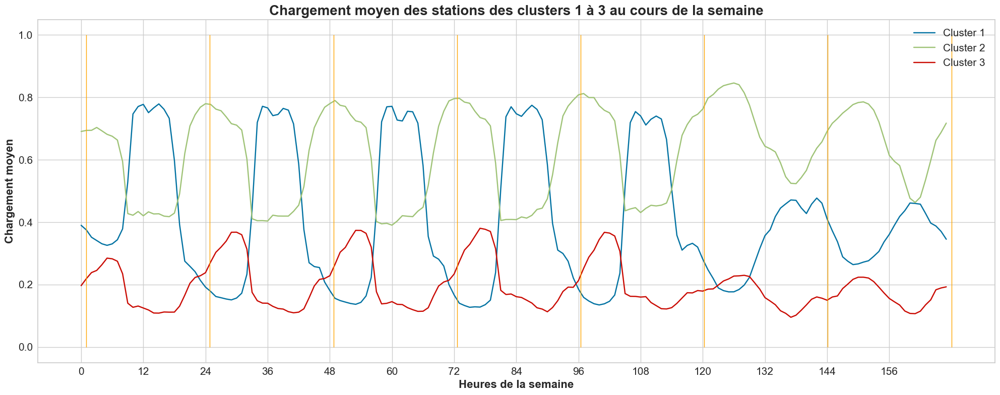

In [81]:
# On récupère les chargements des stations de chaque cluster, et calcule la moyenne de chargement au cours de la semaine

clust1=np.where(clusters_pca3 == 0)[0]
clust1_mean=loading.iloc[clust1].mean(axis=0)

clust2=np.where(clusters_pca3 == 1)[0]
clust2_mean=loading.iloc[clust2].mean(axis=0)

clust3=np.where(clusters_pca3 == 2)[0]
clust3_mean=loading.iloc[clust3].mean(axis=0)

# On affiche les chargement moyen au cours de la semaine des stations de chacun des 3 clusters

plt.figure(figsize=(20,8))

plt.plot(clust1_mean,label="Cluster 1")
plt.plot(clust2_mean,label="Cluster 2")
plt.plot(clust3_mean,label="Cluster 3")
    
plt.vlines(x = time_tick, ymin = 0, ymax = 1, colors = "Orange", linewidth = 1) 
# time_tick, déjà défini et correspond aux jours

plt.xlabel('Heures de la semaine', fontsize = 16, fontweight='demibold')
plt.ylabel('Chargement moyen', fontsize = 16, fontweight='demibold')
plt.title("Chargement moyen des stations des clusters 1 à 3 au cours de la semaine", fontsize = 20, fontweight='bold')
plt.xticks(ticks = np.arange(0, 168, 12), labels=np.arange(0, 168, 12), fontsize = 15)
plt.yticks(fontsize = 15)
plt.legend(fontsize = 15)

plt.tight_layout()
plt.show()

On retrouve bien les observations précédentes : les stations du cluster 1 sont en général beaucoup plus chargées que celles du cluster 2, et également plus chargées que celles du cluster 3. On observe clairement que les stations du cluster 3 sont beaucoup plus pleines le jour que la nuit, tandis que les stations des clusters 1 et 2 sont, à l'inverse, sont moins chargées en journée que la nuit.

In [82]:
fig = px.scatter_mapbox(coord, lat='latitude', lon='longitude',
                        color=(clusters_pca3+1).astype(str),  # Convertis les clusters en string pour une échelle de couleur qualitative
                        color_discrete_sequence=["#C70039", "#89DC91", "#3D7AA2"],  # Utilise une séquence de couleurs qualitatives
                        mapbox_style="carto-positron",  # Style de la carte
                        zoom=10,  
                        opacity=0.7,  # Opacité des points
                        title='Répartition des 3 classes K-means sur les données issues de l ACP à Paris')

fig.show()


A partir des hypothèses d'interprétation des clusters présentées précédemment, la représentation sur la carte des clusters sur les données issues de l'ACP par K-means avec 3 clusters nous donne des zones bien distinctes. Conformément à l'analyse conduite dans la première partie, la carte confirme l'hypothèse que les utilisateurs de Vélib se déplacent vers des quartiers dynamiques ou de bureaux en journée (au centre de la ville et sur les berges de la Seine). 

Les quartiers au nord et au sud ont une tendance à être vides en journée par rapport à la nuit. Il s'agit des quartiers de Montmartre, La Vilette, Jaures, Belleville pour le nord et le quartier Chinois, Salpétrière et une partie du quartier Latin pour le sud.

Source : https://www.pariscityvision.com/fr/paris/quartiers/plan-quartier-paris

### 4.5.2 - Comparaison avec le k-means à 7 clusters 

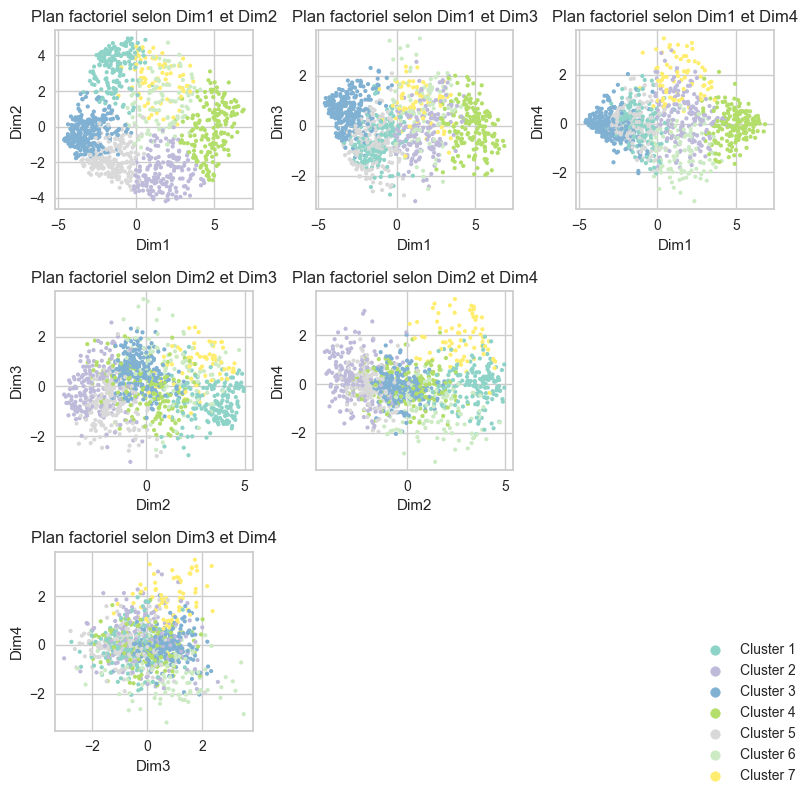

In [83]:
f = 4 # Nombre de dimensions qu'on veut 
# Liste pour stocker les étiquettes des clusters
labels = []
fig, axes =plt.subplots(f-1,f-1,figsize=(f*2, f*2))

for i in range(f-1):  # Boucle à refaire
    for j in range(f-i-1):

        axes[i,j].scatter(loading_pca.values[:, i], loading_pca.values[:, i+j+1], c=clusters_pca7, s=4, linewidths=1, cmap=cmap)
        axes[i,j].set_title(f'Plan factoriel selon Dim{i+1} et Dim{i+j+2}')
        axes[i,j].set_xlabel(f'Dim{i+1}')
        axes[i,j].set_ylabel(f'Dim{i+j+2}')
        # Générer les étiquettes des clusters
        
# Créer une légende pour les clusters
for cluster in np.unique(clusters_pca7):
    plt.scatter([], [], c=cmap(cluster), label=f'Cluster {cluster+1}')  # Ajouter une entrée de légende pour chaque cluster

# Afficher la légende
plt.figlegend(loc='lower right', fontsize='small')

for j in range(f-2):
    for i in range(f-j-2):
        fig.delaxes(axes[f-i-2,f-j-2])

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher la figure
plt.show()


Pour les dimensions 1 et 2, on observe que (de manière générale) : 

* Cluster 1 et 7 : Les stations sont plutôt chargées en journée, un peu plus pleines que la moyenne 
* Cluster 2 : Les stations sont plus vides que la moyenne 
* Cluster 3 : Les stations sont un peu plus vides que la moyenne, plus chargées en journée
* Cluster 4 : Les stations sont un peu plus vides que la moyenne, moins chargées en journée
* Cluster 5 : Les stations sont plus chargées que la moyenne 
* Cluster 6 : Les stations sont plutôt vides en journée, un peu plus pleines que la moyenne 

Pour la dimension 3, les observations sont cette fois moins flagrantes : 

* Clusters 3 et 4 ont l'air légèrement moins chargés le weekend
* Clusters 1 et 2 ont l'air légèrement plus chargés le weekend

On observe sur la dimension 4, la diffrence entre les clusters 1 et 7 est plus importante, alors qu'elle était peu marquée sur les plans précédents : 

* Cluster 1 : Les stations semblent plus chargés en soirée
* Cluster 7 : Les stations semblent moins chargés en soirée


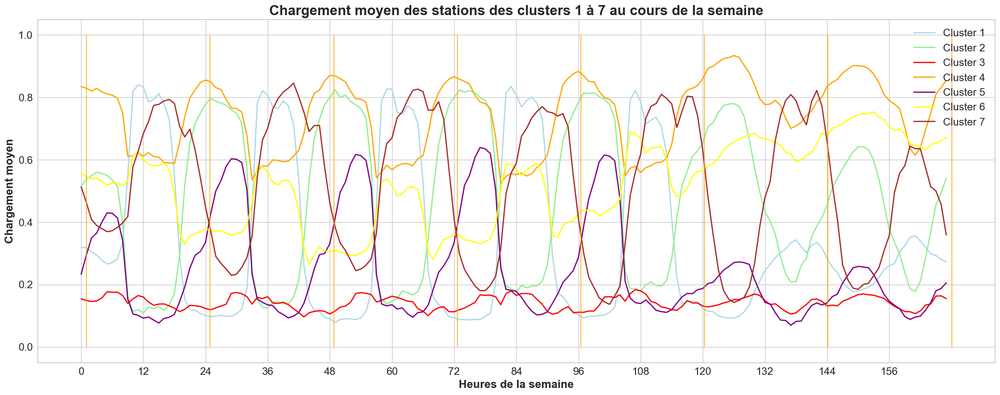

In [84]:
# On récupère les chargements des stations de chaque cluster, et calcule la moyenne de chargement au cours de la semaine
clust1=np.where(clusters_pca7 == 0)[0]
clust1_mean=loading.iloc[clust1].mean(axis=0)

clust2=np.where(clusters_pca7 == 1)[0]
clust2_mean=loading.iloc[clust2].mean(axis=0)

clust3=np.where(clusters_pca7 == 2)[0]
clust3_mean=loading.iloc[clust3].mean(axis=0)

clust4=np.where(clusters_pca7 == 3)[0]
clust4_mean=loading.iloc[clust4].mean(axis=0)

clust5=np.where(clusters_pca7 == 4)[0]
clust5_mean=loading.iloc[clust5].mean(axis=0)

clust6=np.where(clusters_pca7 == 5)[0]
clust6_mean=loading.iloc[clust6].mean(axis=0)

clust7=np.where(clusters_pca7 == 6)[0]
clust7_mean=loading.iloc[clust7].mean(axis=0)

# On affiche les chargement moyen au cours de la semaine des stations de chacun des 3 clusters

plt.figure(figsize=(20,8))

plt.plot(clust1_mean,label="Cluster 1",color='lightblue')
plt.plot(clust2_mean,label="Cluster 2",color='lightgreen')
plt.plot(clust3_mean,label="Cluster 3",color='red')
plt.plot(clust4_mean,label="Cluster 4",color='orange')
plt.plot(clust5_mean,label="Cluster 5",color='purple')
plt.plot(clust6_mean,label="Cluster 6",color='yellow')
plt.plot(clust7_mean,label="Cluster 7",color='brown')
    
plt.vlines(x = time_tick, ymin = 0, ymax = 1, colors = "Orange", linewidth = 1) 
# time_tick, déjà défini et correspond aux jours

plt.xlabel('Heures de la semaine', fontsize = 16, fontweight='demibold')
plt.ylabel('Chargement moyen', fontsize = 16, fontweight='demibold')
plt.title("Chargement moyen des stations des clusters 1 à 7 au cours de la semaine", fontsize = 20, fontweight='bold')
plt.xticks(ticks = np.arange(0, 168, 12), labels=np.arange(0, 168, 12), fontsize = 15)
plt.yticks(fontsize = 15)
plt.legend(fontsize = 15)

plt.tight_layout()
plt.show()

Même interprétation que précédemment grâce aux courbes.

In [85]:
fig = px.scatter_mapbox(coord, lat='latitude', lon='longitude',
                        color=(clusters_pca7+1).astype(str),  # Convertis les clusters en string pour une échelle de couleur qualitative
                        # color_discrete_sequence=["#8FCCD2","#69FA78","#FC0505","#FC8805","#5C039A","#F8FC03","#C70039"],
                        color_discrete_sequence=["#5C039A","#69FA78","#C70039","#8FCCD2","#FC8805","#F8FC03","#FC0505"], 
                        mapbox_style="carto-positron",  # Style de la carte
                        zoom=10,  
                        opacity=0.7,  # Opacité des points
                        title='Répartition des 3 classes K-means à Paris')

fig.show()

| Classe   | Couleurs | Quartiers | Activités |
|----------|----------|-----------|-----------| 
| 1 | Bleu | Palais Royal, Champs-Elysées, Opera, 1ER, 7E, Quai d'Orsay, Ile de la Cité, 6E, Quartier Latin | Touristique (lieux emblématiques et culture riche)| 
| 2 | Vert | Hôpital Saint-Louis, Roquette, Vaugirard, Maison Blanche, 12E, Popincourt, Bassin des Marais, Les Epinettes | Résidentiel avec parcs et marchés locaux | 
| 3 | Rouge | L'Europe, Montmartre, Saint-Geroges, la Vilette, 8E, Pigale, les Lilas, Bagnolet, Montrouge, Chaillot | Art, vie nocturne et forte culture |
| 4 | Orange | Issy-les-Moulineaux, Arcueil, Gentilly, Ivry-sur-Seine, Charenton-le-Pont, Faubourg Saint-Marcel, Saint-Mandé, le Marais, 9E, Auteuil, Grenelle, Javel | Activités commerciales et entreprises |
| 5 | Violet | Passy, les Ternes, Cligancourt, Batignolles, La Chapelle, le Pré Saint-Gervais, Belleville, 20E, Charonne, les Gobelins, Malakoff | Résidences et espaces verts | 
| 6 | Jaune | Gros Cailloux, Boulogne Billancourt, Bassin de l'Arsenal, Quai d'Austerlitz, Faubourg Poissonnière, Levalloit-Perret, Clichy, Saint-Ouen-sur-Seine, Saint-Cloud | Quartiers résidentiels et sièges sociaux |
| 7 | Bordeaux | Les Halles, 4E, Bastille, République | Tourisme, culture et boutiques |


Utilisation des noms de quartiers sur la carte et de la source : https://www.pariscityvision.com/fr/paris/quartiers/plan-quartier-paris


En prenant en compte les activités principales des quartiers de chaque cluster, nous pouvons à nouveau valider les observations réalisées précédemment. Les clusters 1 et 7 étant en général des quartiers culturels et touristiques, il est logique que les stations Vélib situées dans ces derniers soient plus chargées que la moyenne en journée et présentent moins d'affluence en soirée. 

Pour le culster 2, les stations sont moins chargées que la moyenne. Cela s'explique par les activités plus calmes de ces quartiers. 

Le cluster 3 regroupe des quartiers dont la vie y est plus dynamique la nuit. Cela peut expliquer pourquoi les stations Vélib situées dans ces derniers sont moins chargées en journée.

Nous pouvons également étendre ce raisonnement et confirmer nos hypothèses pour les autres clusters étudiés précédemment.

## 4.6 - Classification sur les données initiales par K-means

Nous allons suivre les mêmes étapes et raisonnements que pour la classifications des données issues de l'ACP, en travaillant maintenant sur le jeu de données initial.

### 4.6.1 - Détermination du nombre optimal de clusters pour la méthode du K-means

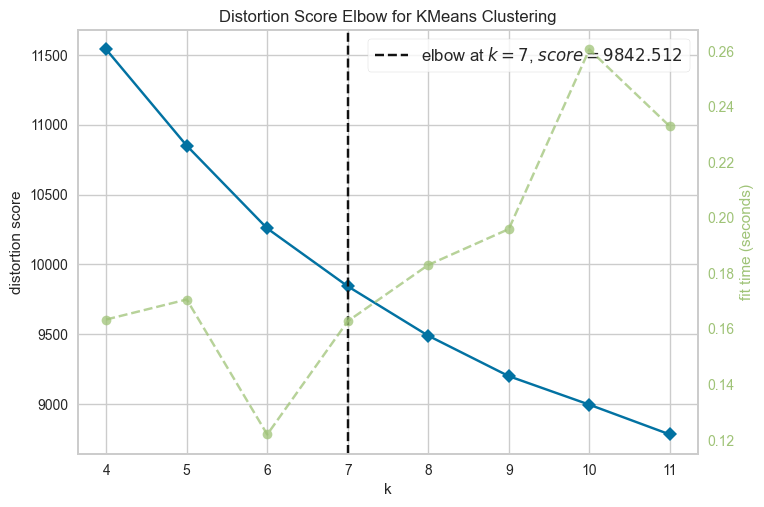

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [86]:
# Using yellowbrick

kmeans = KMeans(init='k-means++', n_init=10, max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans, k=(4,12))

visualizer.fit(loading)    # Fiter les données
visualizer.show() 

Le graphique montre que le nombre optimal de clusters pour la méthode du K-means de notre jeu de données est de 7. Ce choix équilibre bien la compacité des clusters et la complexité computationnelle, ce qui devrait permettre une bonne segmentation des stations Vélib.

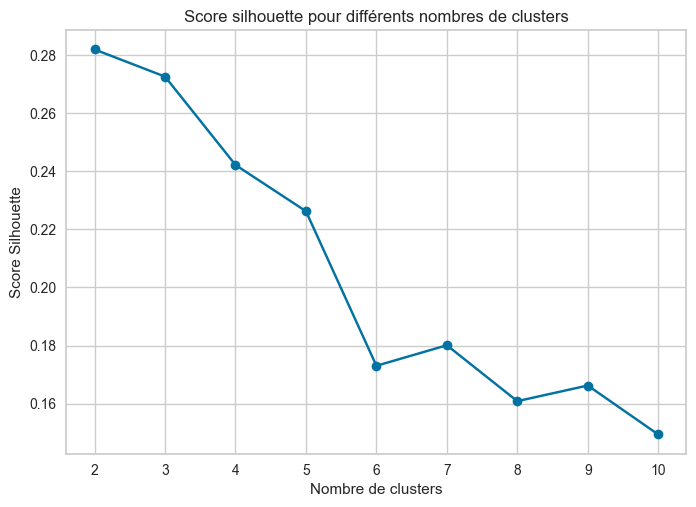

Nombre optimal de clusters d'après le score silhouette : 2


In [87]:
# Liste pour stocker les scores de silhouette
silhouette_scores = []

# Range de nombre de clusters à tester
k_range = range(2, 11)

# Calcul des scores de silhouette pour chaque nombre de clusters
for k in k_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=100, random_state=42)
    cluster_labels = kmeans.fit_predict(loading)
    silhouette_avg = silhouette_score(loading, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Tracer les scores de silhouette en fonction du nombre de clusters
plt.plot(k_range, silhouette_scores, marker='o')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score Silhouette')
plt.title('Score silhouette pour différents nombres de clusters')
plt.show()

# Trouver le nombre optimal de clusters
optimal_num_clusters = k_range[np.argmax(silhouette_scores)]
print("Nombre optimal de clusters d'après le score silhouette :", optimal_num_clusters)

Sur le graphique, on observe que le score de silhouette décroît globalement à mesure que le nombre de clusters augmente :

* Avec 2 clusters, le score est le plus élevé, indiquant que cette configuration offre la meilleure séparation distincte entre les deux clusters.

* Entre 3 et 6 clusters, le score diminue assez rapidement, ce qui montre que l'ajout de clusters supplémentaires ne parvient pas à capturer une structure plus fine dans les données sans compromettre la qualité de la séparation.

* À partir de 6 clusters, la tendance du score de silhouette est plus irrégulière et continue de baisser, indiquant que les clusters deviennent de moins en moins distincts les uns des autres.

En conclusion, le graphique indique que globalement moins il y a de clusters, plus la séparation est nette entre eux. L'augmentation du nombre de clusters semble donc dégrader la qualité de la séparation. Cela peut signifier que les données n'ont pas une structure clairement segmentable en un grand nombre de groupes ou que l'algorithme de clustering a du mal à séparer efficacement les données en plusieurs clusters bien distincts.

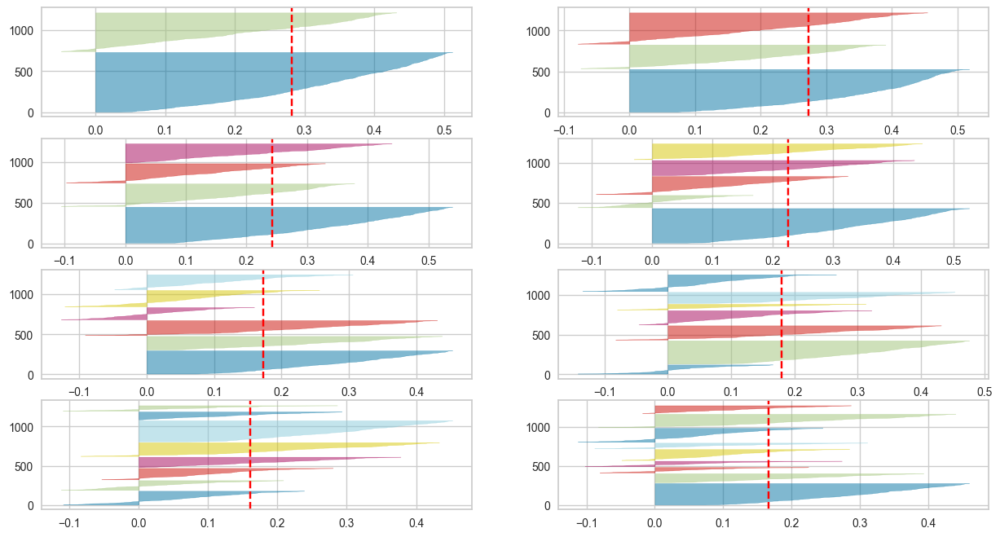

In [88]:
fig, ax = plt.subplots(4, 2, figsize=(15,8))

for k in range(2, 10):
    '''
    Create KMeans instance for different number of clusters
    '''
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(k, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(loading)

Ce graphique présente le même fonctionnement général que celui présenté pour la classification sur les données issues de l'ACP. Nous allons directement présenter son interprétation sans rappeler son fonctionnement qui a été détaillé précédemment. 

Dans ces graphiques, il semble y avoir une tendance générale où les scores moyens de silhouette diminuent à mesure que le nombre de clusters augmente, ce qui est souvent le cas. Cela confirme l'analyse établie dans la représentation de l'évolution du score silhouette sur le graphique précédent.

### 4.6.2 - Classification par K-means sur les données initiales

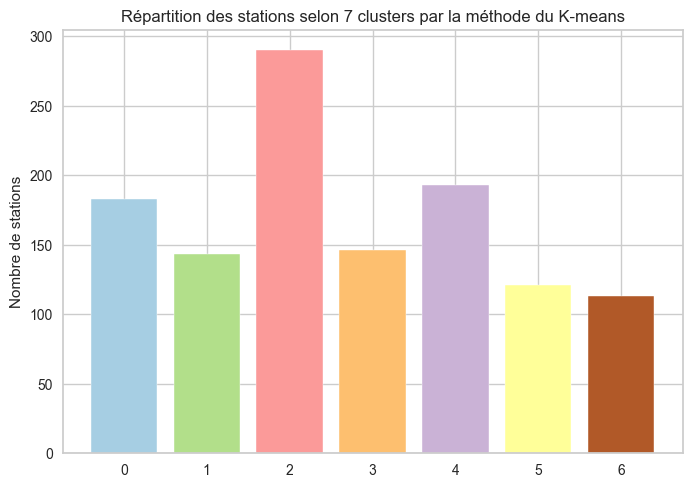

In [89]:
# Classification par K-means avec 7 clusters
K = 7 # D'après la méthode du coude

kmeans7 = KMeans(n_clusters=K, random_state=0)
clusters7 = kmeans7.fit_predict(loading)


cmap = plt.get_cmap('Paired',7)
plt.bar(*np.unique(clusters7, return_counts=True), color=cmap.colors)
plt.ylabel("Nombre de stations")
plt.title("Répartition des stations selon "+ str(K)+" clusters par la méthode du K-means")
plt.show()

Interprétation : 

* Le cluster 2 (troisème cluster) contient nettement plus de stations que les autres clusters, avec plus de 250 stations.

* Les clusters 0, 1, 3, 4, et 5 ont une répartition relativement similaire en termes de nombre de stations, avec un nombre de station variant de 150 à un peu moins de 200.

* Le cluster 6 (dernier cluster) contient le moins de stations, avec un peu plus de 100 stations.

Cette répartition pourrait refléter des modèles de comportement différents dans l'utilisation des stations Vélib. Par exemple, le cluster 2 pourrait représenter des stations avec un taux de chargement élevé ou très caractéristique, tandis que le cluster 6 pourrait représenter des stations moins fréquentées ou ayant des profils de chargement moins typiques.

L'analyse de ces clusters peut fournir des informations pertinentes pour la gestion du réseau de Vélib, par exemple, en identifiant les besoins spécifiques de réapprovisionnement en vélos ou en ajustant la maintenance selon les taux de chargement des stations.

In [90]:
fig = px.scatter_mapbox(coord, lat='latitude', lon='longitude',
                        color=clusters7.astype(str),  # Convertis les clusters en string pour une échelle de couleur qualitative
                        color_discrete_sequence=px.colors.qualitative.Plotly, # Utilise une séquence de couleurs qualitatives
                        mapbox_style="carto-positron",  # Style de la carte
                        zoom=10,  
                        opacity=0.7,  # Opacité des points
                        title='Répartition des 7 classes par classification K-means à Paris')

fig.show()

En prenant en compte les regroupements des quartiers dans les clusters, on peut faire les observations suivantes : 

* Classe 0 (Violet) : Les points violets semblent se trouver dans des zones qui pourraient être associées à des quartiers historiques ou bien établis avec une haute valeur immobilière. Nous avons vu précédemment que ces zones regroupent des éléments historiques et culturels de la ville. On s'attend à ce que les stations vélib situées dans ces quartiers soient plus chargées que la moyenne en journée et qu'elles soient plus vides en soirée. 

* Classe 1 (Rouge) : On observe une concentration de ces points dans des zones centrales. Ils pourraient représenter des quartiers avec des activités touristiques, commerciales et culturelles importantes. Dans ces quartiers, les vélos sont fréquemment utilisés en journée et les stations sont plus vides la nuit.

* Classe 2 (Bleu clair) : Ces points semblent être en périphérie, ce qui pourrait indiquer des zones résidentielles ou des quartiers en développement, dont les habitants pourraent utiliser les vélos des stations pour se rendre dans les quartiers d'activités. 

* Classe 3 (Vert) : Ces points semblent être dispersés à travers la ville, avec un léger regroupement au centre et sur les bords de Seine, indiquant peut-être des quartiers multifonctionnels.

* Classe 4 (Bleu) : Les points bleus sont également assez dispersés, ce qui pourrait signifier que ces quartiers partagent des caractéristiques communes, comme un certain type de services ou des caractéristiques démographiques.

* Classe 5 (Orange) : Ces points sont dispersés dans de nombreuses zones, suggérant des quartiers avec une diversité d'activités qui pourraient inclure des zones résidentielles et des centres d'affaires. Dans ces quartiers, les stations sont souvent plus pleines que la moyenne et sujettes aux déplacements pendulaires.

* Classe 6 (Rose) : Ces quartiers pourraient être ceux en transition ou ayant des caractéristiques spécifiques comme de nouveaux développements, des zones industrielles rénovées ou des quartiers émergents attractifs pour une population jeune et dynamique.

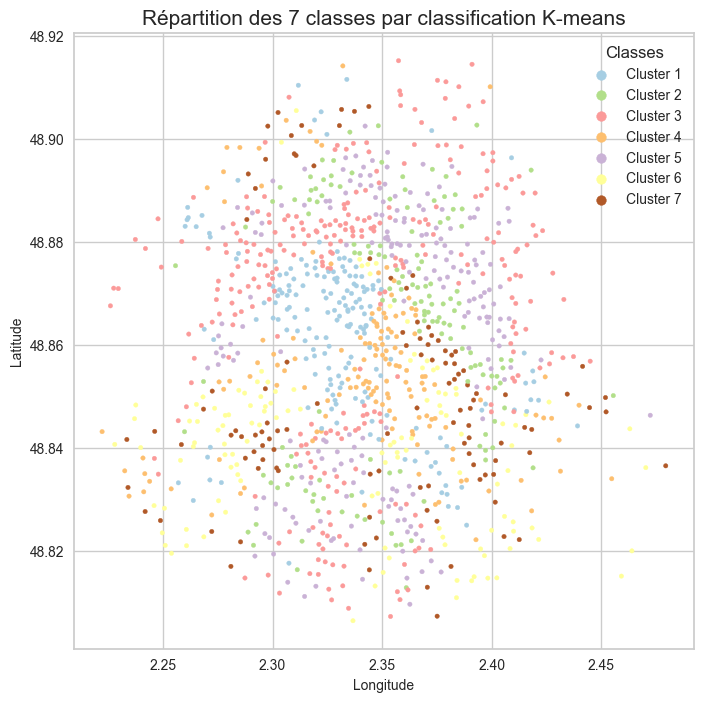

In [91]:
plt.figure(figsize = (8, 8))
cmap = plt.get_cmap('Paired',7)
sctrplt = plt.scatter(coord['longitude'], coord['latitude'], 
                      c = clusters7, cmap = cmap,s=10)

for cluster in np.unique(clusters7):
    plt.scatter([], [], c=cmap(cluster), label=f'Cluster {cluster+1}')  # Ajouter une entrée de légende pour chaque cluster

plt.xlabel('Longitude', fontsize = 10)
plt.ylabel('Latitude', fontsize = 10)
plt.title('Répartition des 7 classes par classification K-means', fontsize = 15)
plt.legend(scatterpoints=1, title='Classes')
plt.show()

Le graphique montre une répartition géographique des stations Vélib sur une carte de Paris, classées en 7 clusters différents par la méthode du K-means. Chaque point représente l'emplacement d'une station Vélib, avec des couleurs différentes indiquant l'appartenance à différents clusters.

* Dispersion des clusters : Les clusters semblent être dispersés à travers toute la carte, sans regroupement clair par zone géographique. Cela suggère que la classification n’est pas uniquement basée sur la géographie, mais probablement sur les taux de chargement et d’autres facteurs liés à l'utilisation des stations.

* Clusters mixtes : Aucun cluster ne semble exclusivement lié à une zone spécifique de Paris, indiquant que des stations similaires en termes de caractéristiques de chargement sont géographiquement dispersées.

* Densité des clusters : Certains clusters peuvent avoir des points plus concentrés dans certaines zones, ce qui pourrait indiquer des zones avec des comportements d’utilisation similaires.

L’analyse pourrait être approfondie en examinant les caractéristiques spécifiques des stations au sein de chaque cluster pour comprendre pourquoi elles sont groupées ensemble, par exemple, en regardant les taux de chargement aux heures de pointe, les jours de semaine par rapport aux weekends, ou la proximité des stations à des points d'intérêt comme les gares ou les centres commerciaux.

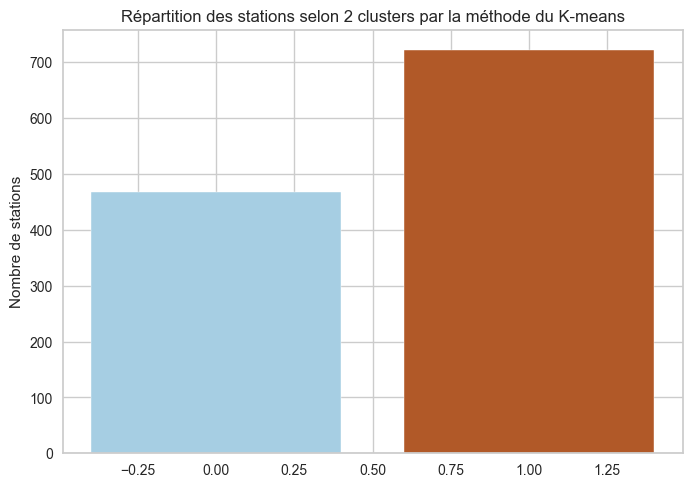

In [92]:
# Classification par K-means avec 7 clusters
K = 2 # D'après le score silhouette

kmeans2 = KMeans(n_clusters=K, random_state=0)
clusters2 = kmeans2.fit_predict(loading)


cmap = plt.get_cmap('Paired',K)
plt.bar(*np.unique(clusters2, return_counts=True), color=cmap.colors)
plt.ylabel("Nombre de stations")
plt.title("Répartition des stations selon "+ str(K)+" clusters par la méthode du K-means")
plt.show()

Interprétation : 

* Le premier cluster (barre bleue claire) regroupe environ 400 stations.

* Le second cluster (barre marron) contient plus de 600 stations.

Cela indique que la majorité des stations appartiennent au second cluster. A ce stade, on pourrait supposer que les clusters peuvent représenter différents niveaux de trafic, de taux de chargement ou d'autres caractéristiques opérationnelles des stations Vélib.

In [93]:
fig = px.scatter_mapbox(coord, lat='latitude', lon='longitude',
                        color=clusters2.astype(str),  # Convertis les clusters en string pour une échelle de couleur qualitative
                        color_discrete_sequence=px.colors.qualitative.Plotly, # Utilise une séquence de couleurs qualitatives
                        mapbox_style="carto-positron",  # Style de la carte
                        zoom=10,  
                        opacity=0.7,  # Opacité des points
                        title='Répartition des 2 classes par classification K-means à Paris')

fig.show()

Avec un raisonnement analogue à celui de la représentation sur la carte de Paris des clusters, on peut supposer que : 

* Classe 0 (Rouge) : Les points rouges semblent regroupés dans le centre de la carte, ce qui peut indiquer le cœur de la ville, probablement caractérisé par une densité élevée, un mélange de zones résidentielles et commerciales, et probablement une grande activité touristique. Cette concentration peut aussi correspondre à des zones historiques ou à forte activité économique.

* Classe 1 (Bleu) : Les points bleus sont dispersés autour du centre, peut-être représentant la banlieue ou des zones périurbaines. Ces zones pourraient être plus résidentielles avec certains pôles d'activités commerciales et des espaces de loisirs, possiblement avec plus d'espaces verts et des zones moins densément peuplées que le centre-ville.

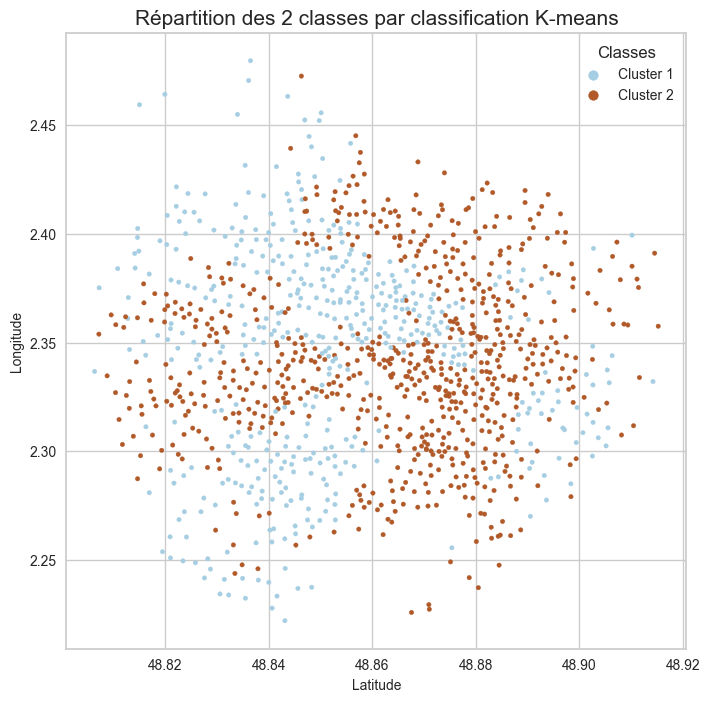

In [94]:
plt.figure(figsize = (8, 8))
cmap = plt.get_cmap('Paired',2)

sctrplt = plt.scatter(coord['latitude'], coord['longitude'], 
                      c = clusters2, cmap = cmap,s=10)

for cluster in np.unique(clusters2):
    plt.scatter([], [], c=cmap(cluster), label=f'Cluster {cluster+1}')  # Ajouter une entrée de légende pour chaque cluster

plt.xlabel('Latitude', fontsize = 10)
plt.ylabel('Longitude', fontsize = 10)
plt.title('Répartition des 2 classes par classification K-means', fontsize = 15)
plt.legend(scatterpoints=1, title='Classes')
plt.show()

Les points bleu clair représentent les stations appartenant au cluster 1 et les points marron celles appartenant au cluster 2. Les deux clusters semblent être répartis à travers toute la ville sans une séparation géographique nette, indiquant que la classification n'est pas strictement basée sur la localisation des stations.

Les implications pourraient être que les deux clusters représentent des groupes de stations avec des caractéristiques différentes en termes de taux de chargement, indépendamment de leur emplacement géographique. Par exemple, le cluster 1 pourrait représenter des stations avec des taux de chargement généralement bas, tandis que le cluster 2 pourrait représenter des stations avec des taux de chargement élevés ou inversement.

## 4.6.3 - Comparaison des résultats de la classification par K-means

In [95]:
# Comparaison en utilisant les métriques
print("K-means avec 2 clusters")
print("")
performance(loading, clusters2)
print("")
print("------------------------")
print("")
print("K-means avec 7 clusters")
print("")
performance(loading, clusters7)

K-means avec 2 clusters

Silhouette Score : 0.28211379495851496
R-squared Score : 0.25975429055431254
SSE : 12269.514462424457
Calinski-Harabasz Score : 507.2209066655814

------------------------

K-means avec 7 clusters

Silhouette Score : 0.15894663172915888
R-squared Score : 0.3329225445324237
SSE : 6595.5393385206135
Calinski-Harabasz Score : 274.3711197204973



* Pour K-means avec 2 clusters sur les données initiales :

Silhouette Score : 0.282, qui est un score assez bon, indiquant que les clusters ont une séparation acceptable et une cohérence interne. R-squared Score : 0.260, suggérant que l'assignation des stations aux clusters explique une part modérée de la variance des données. SSE : 12269.5, ce qui est relativement élevé, indiquant que les stations à l'intérieur de chaque cluster sont assez éloignées de leur centre de cluster. Calinski-Harabasz Score : 507.22, ce qui est un score raisonnable et implique que les clusters sont assez bien définis.

* Pour K-means avec 7 clusters sur les données initiales :

Silhouette Score : 0.159, ce qui est nettement plus faible que pour 2 clusters, indiquant que la qualité de la séparation des clusters s'est détériorée avec plus de clusters. R-squared Score : 0.333, ce qui est plus élevé que pour 2 clusters, suggérant une meilleure explication de la variance des données. SSE : 6595.54, ce qui est plus faible que pour 2 clusters, indiquant que les stations sont en moyenne plus proches des centres de leur cluster. Calinski-Harabasz Score : 274.37, ce qui est beaucoup plus bas que pour 2 clusters, suggérant que les clusters sont moins bien définis avec 7 clusters.

* Comparaison avec K-means sur les données de l'ACP :

Sur les données de l'ACP, le K-means avec 3 clusters avait un score de silhouette supérieur (0.356) par rapport aux 0.282 pour 2 clusters sur les données initiales, ce qui suggère que la réduction de dimensionnalité par ACP a pu montrer une structure de données plus clairement séparable. En termes de SSE, le K-means sur les données de l'ACP avec 7 clusters avait un SSE de 2881.31, ce qui est beaucoup plus bas que le SSE sur les données initiales, indiquant que les clusters sont plus compacts après la réduction de dimensionnalité. Les scores de Calinski-Harabasz étaient également supérieurs pour les données de l'ACP, indiquant des clusters mieux définis et une plus grande séparation.

En conclusion, les scores suggèrent que le clustering est plus efficace sur les données réduites par ACP par rapport aux données initiales, probablement parce que l'ACP a pu concentrer les données sur leurs aspects les plus importants et supprimer le bruit qui pourrait obscurcir les regroupements naturels. La réduction de dimensionnalité semble avoir facilité la création de clusters plus significatifs et cohérents.

## 4.7 - Classification des données initiales par Gaussian Mixture Model (GMM)

### 4.7.1 - Détermination du nombre optimal de clusters pour le modèle GMM sur les données initiales

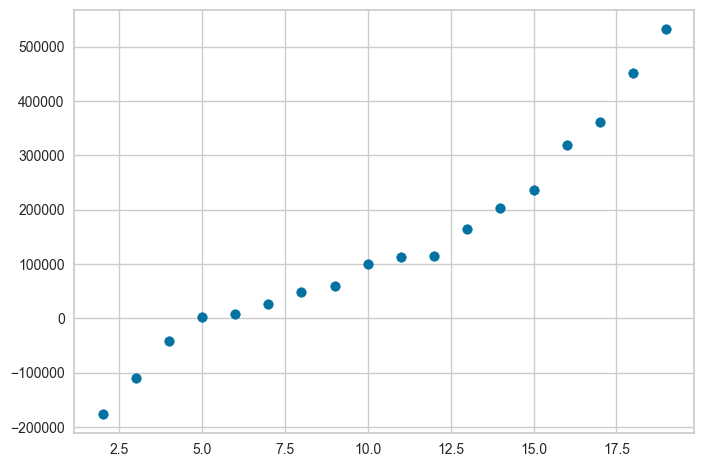

In [96]:
# En utilisant le critère BIC
k_max = 20

bic = []
for k in range(2, k_max):
    gmm = GaussianMixture(n_components=k, init_params='kmeans', n_init=3)
    gmm.fit(loading)
    bic.append(gmm.bic(loading))
bic = np.array(bic)

plt.scatter(range(2, k_max), bic)
plt.show()

On souhaite maximiser le score BIC, mais ce dernier tend vers des valeurs infinies au fur et à mesure que k_max augmente. On ne peut donc pas sélectionner le nombre de clusters à l'aide de cette méthode sans sélectionner trop de clusters, qui seraient peu explicatifs et apporteraient un risque de surajustement. Cela peut s'expliquer par le faible nombre d'individus par rapport aux variables dans notre jeu de données. Nous décidons arbitrairement de choisir le même nombre de clusters pour cette méthode que pour la méthode du K-means afin d'avoir des éléments communs pour les comparaisons.

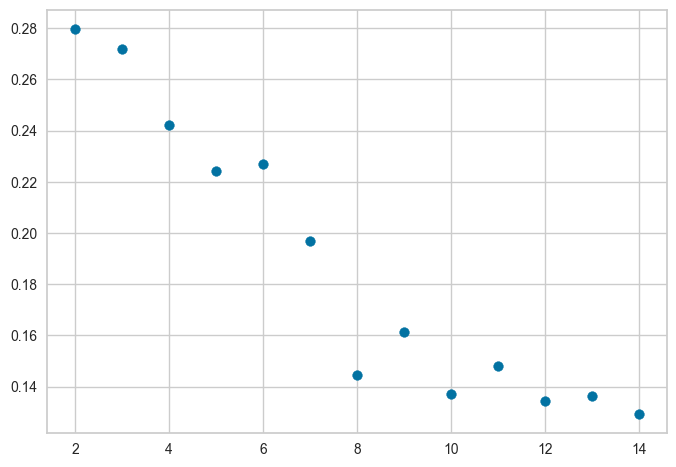

In [97]:
# En utilisant le score silhouette
k_max = 15

silhouette = []
for k in range(2, k_max):
    gmm = GaussianMixture(n_components=k, init_params='kmeans', n_init=3)
    clusters_gmm = gmm.fit_predict(loading)
    silhouette.append( silhouette_score(loading, clusters_gmm, metric='euclidean') )
silhouette = np.array(silhouette)

plt.scatter(range(2, k_max), silhouette)
plt.show()

L'analyse de ce graphique est analogue au graphique du score silhouette pour la classification par K-means. Une classification avec 2 clusters est à privilégier ici.

### 4.7.2 - Classification par Gaussian Mixture Model (GMM)

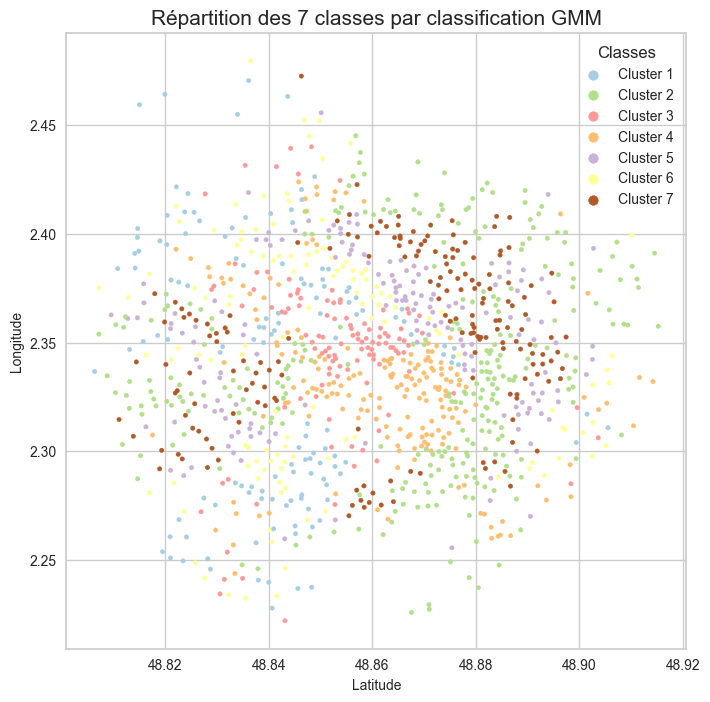

In [98]:
K = 7 # D'après K-means

cmap = plt.get_cmap('Paired', K)

gmm_init7 = GaussianMixture(n_components=K, n_init=3) # n_init = nombre d'initialisations à faire
clusters_gmm_init7 = gmm_init7.fit_predict(loading)

plt.figure(figsize = (8, 8))
cmap = plt.get_cmap('Paired',K)

sctrplt = plt.scatter(coord['latitude'], coord['longitude'], 
                      c = clusters_gmm_init7, cmap = cmap,s=10)

for cluster in np.unique(clusters_gmm_init7):
    plt.scatter([], [], c=cmap(cluster), label=f'Cluster {cluster+1}')  # Ajouter une entrée de légende pour chaque cluster

plt.xlabel('Latitude', fontsize = 10)
plt.ylabel('Longitude', fontsize = 10)
plt.title('Répartition des 7 classes par classification GMM', fontsize = 15)
plt.legend(scatterpoints=1, title='Classes')
plt.show()

In [99]:
fig = px.scatter_mapbox(coord, lat='latitude', lon='longitude',
                        color=clusters_gmm_init7.astype(str),  # Convertis les clusters en string pour une échelle de couleur qualitative
                        color_discrete_sequence=px.colors.qualitative.Plotly, # Utilise une séquence de couleurs qualitatives
                        mapbox_style="carto-positron",  # Style de la carte
                        zoom=10,  
                        opacity=0.7,  # Opacité des points
                        title='Répartition des 7 classes par classification GMM à Paris')

fig.show()

Interprétation : 

* Dispersion des clusters : Les clusters GMM semblent être aussi dispersés sur la carte que ceux obtenus par K-means, ce qui pourrait suggérer une similitude dans la façon dont les deux méthodes de clustering segmentent l'espace géographique.

* Formes des clusters : Alors que K-means crée des clusters avec des formes sphériques ou circulaires en raison de l'équidistance par rapport aux centroïdes, le GMM peut créer des clusters avec des formes elliptiques en raison de la prise en compte de la covariance entre les variables. Cela peut conduire à une répartition des clusters qui pourrait sembler plus "naturelle" ou qui suit des tendances plus subtiles dans les données.

* Chevauchement des clusters : Les clusters GMM peuvent se chevaucher d'une manière différente de ceux de K-means parce que GMM est un algorithme probabiliste qui attribue des probabilités d'appartenance aux clusters plutôt que des attributions catégoriques.

* Interprétation géographique : Les modèles de distribution géographique semblent similaires dans les deux méthodes de classification, mais le GMM pourrait révéler des clusters avec des variations plus graduelles entre eux en raison de son approche probabiliste.

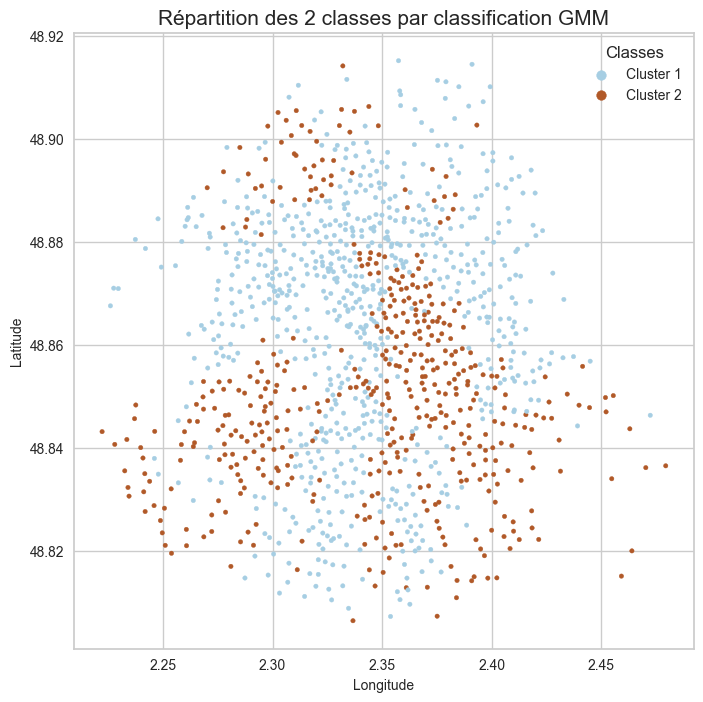

In [100]:
K = 2 # D'après le score silhouette

cmap = plt.get_cmap('Paired', K)

gmm_init2 = GaussianMixture(n_components=K, n_init=3) # n_init = nombre d'initialisations à faire
clusters_gmm_init2 = gmm_init2.fit_predict(loading)

plt.figure(figsize = (8, 8))
cmap = plt.get_cmap('Paired',K)

sctrplt = plt.scatter(coord['longitude'], coord['latitude'], 
                      c = clusters_gmm_init2, cmap = cmap,s=10)

for cluster in np.unique(clusters_gmm_init2):
    plt.scatter([], [], c=cmap(cluster), label=f'Cluster {cluster+1}')  # Ajouter une entrée de légende pour chaque cluster

plt.xlabel('Longitude', fontsize = 10)
plt.ylabel('Latitude', fontsize = 10)
plt.title('Répartition des 2 classes par classification GMM', fontsize = 15)
plt.legend(scatterpoints=1, title='Classes')
plt.show()

Interprétation : 

* Répartition géographique : Comme dans la classification K-means, les deux clusters GMM sont dispersés à travers toute la ville. Cela suggère que les clusters identifiés par GMM ne sont pas non plus géographiquement distincts, ce qui implique que la classification est probablement basée sur d'autres caractéristiques des stations plutôt que leur localisation.

* Densité des clusters : Sans les valeurs numériques exactes, il est difficile de comparer la densité des points entre K-means et GMM. Néanmoins, le GMM tend à créer des clusters basés sur la densité et la forme des données, ce qui peut donner des résultats légèrement différents de ceux du K-means, qui se concentre uniquement sur la distance.

* Probabilité d'appartenance : GMM attribue une probabilité d'appartenance à chaque cluster pour chaque station, tandis que K-means attribue chaque station à un seul cluster. Cela pourrait résulter en un chevauchement des clusters plus prononcé sur le graphique GMM si la probabilité d'appartenance était représentée.

In [101]:
fig = px.scatter_mapbox(coord, lat='latitude', lon='longitude',
                        color=clusters_gmm_init2.astype(str),  # Convertis les clusters en string pour une échelle de couleur qualitative
                        color_discrete_sequence=px.colors.qualitative.Plotly, # Utilise une séquence de couleurs qualitatives
                        mapbox_style="carto-positron",  # Style de la carte
                        zoom=10,  
                        opacity=0.7,  # Opacité des points
                        title='Répartition des 2 classes par classification GMM à Paris')

fig.show()

On remarque que la répartition des stations dans les 2 clusters ressemble fortement à celle pour la méthode du K-means. Cela pourrait indiquer que les deux méthodes de classification capturent à peu près les mêmes informations sur les stations et que les résultats (et donc analyses) sont très proches. 

### 4.7.3 - Comparaison des différentes classifications par GMM

In [102]:
# Comparaison en utilisant les métriques
print("GMM avec 2 clusters")
print("")
performance(loading, clusters_gmm_init2)
print("")
print("------------------------")
print("")
print("GMM avec 7 clusters")
print("")
performance(loading, clusters_gmm_init7)

GMM avec 2 clusters

Silhouette Score : 0.27972137543053
R-squared Score : 0.259050967347981
SSE : 12315.767323369339
Calinski-Harabasz Score : 502.46179286328214

------------------------

GMM avec 7 clusters

Silhouette Score : 0.15692494231138424
R-squared Score : 0.33317170943279445
SSE : 6596.102525115147
Calinski-Harabasz Score : 274.15482305647686


* GMM avec 2 clusters :

Silhouette Score : 0.280, ce qui est un score relativement élevé, suggérant que les deux clusters sont raisonnablement bien séparés et que les stations sont bien regroupées au sein de leurs clusters respectifs. R-squared Score : 0.259, indiquant que les clusters expliquent une quantité modérée de la variance totale des données. SSE : 12315.77, assez élevé, montrant que les stations sont en moyenne à une distance considérable des centres de leurs clusters respectifs. Calinski-Harabasz Score : 502.46, indiquant une séparation raisonnable entre les clusters, mais pas aussi forte que ce que l'on pourrait obtenir avec des clusters plus compactes et mieux définis.

* GMM avec 7 clusters :

Silhouette Score : 0.160, significativement plus bas, ce qui suggère que l'ajout de clusters supplémentaires a entraîné une détérioration de la séparation et de la cohérence des clusters. R-squared Score : 0.331, légèrement plus élevé, suggérant une légèrement meilleure explication de la variance des données avec 7 clusters qu'avec 2. SSE : 6727.26, inférieur à celui de 2 clusters, indiquant que les points sont en moyenne plus proches de leurs centres de clusters. Calinski-Harabasz Score : 266.81, beaucoup plus bas que pour 2 clusters, suggérant que les clusters sont moins bien définis avec l'introduction de plus de clusters.

* Comparaison avec K-means sur les données initiales :

Les scores de silhouette pour le GMM sont légèrement inférieurs à ceux obtenus avec K-means pour les deux configurations (2 clusters: 0.282 pour K-means vs 0.280 pour GMM ; 7 clusters: 0.159 pour K-means vs 0.160 pour GMM). Les scores R-squared sont similaires entre GMM et K-means, suggérant que les deux méthodes expliquent une proportion similaire de la variance des données. Le SSE est plus élevé pour GMM dans les deux configurations par rapport à K-means, indiquant que K-means a tendance à regrouper les stations plus étroitement autour des centroïdes de clusters. Les scores de Calinski-Harabasz sont également inférieurs pour GMM par rapport à K-means, suggérant que les clusters identifiés par K-means ont tendance à être plus distincts et mieux séparés que ceux de GMM.

En conclusion, K-means semble légèrement surpasser GMM pour les données initiales en termes de score de silhouette et de score de Calinski-Harabasz, même si les différences ne sont pas très marquées. Cela peut indiquer que pour les caractéristiques de taux de chargement des stations Vélib, le K-means est légèrement plus approprié pour créer des clusters distincts et cohérents par rapport à GMM. 

## 4.8 - Classification des données initiales par Classification Ascendante Hiérarchique (CAH)

### 4.8.1 - Détermination du nombre optimal de clusters pour la classification CAH

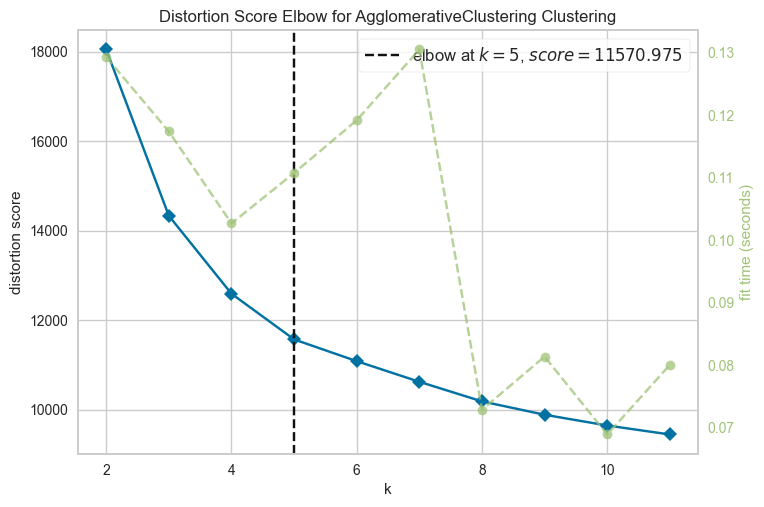

In [103]:
ac = AgglomerativeClustering(linkage="ward", compute_distances=True)
visualizer = KElbowVisualizer(ac, k=(2,12))

visualizer.fit(loading)        
visualizer.show()   

plt.show()

Le graphique montre que le nombre optimal de clusters pour la méthode du CAH avec liaisons Ward de notre jeu de données est de 5. Ce choix équilibre bien la compacité des clusters et la complexité computationnelle, ce qui devrait permettre une bonne segmentation des stations Vélib. Cependant, cette interprétation reste assez subjective, on pourait également distinguer un coude pour k=3. Le résultat est discutable.

### 4.8.2 - Choix du type d'arbre pour la classification CAH

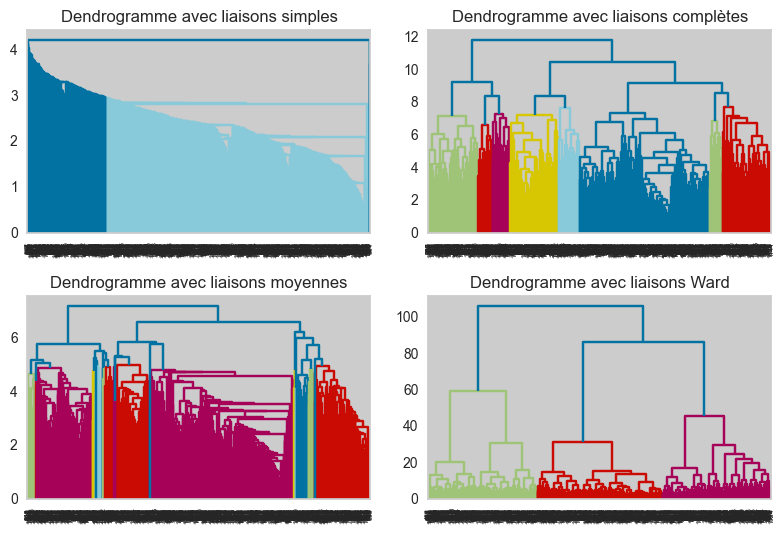

In [104]:
plt.subplot(2,2,1)
linkage_matrix = sch.linkage(loading, method='single')
sch.dendrogram(linkage_matrix)
plt.title("Dendrogramme avec liaisons simples")

plt.subplot(2,2,2)
linkage_matrix = sch.linkage(loading, method='complete')
sch.dendrogram(linkage_matrix)
plt.title("Dendrogramme avec liaisons complètes")

plt.subplot(2,2,3)
linkage_matrix = sch.linkage(loading, method='average')
sch.dendrogram(linkage_matrix)
plt.title("Dendrogramme avec liaisons moyennes")

plt.subplot(2,2,4)
linkage_matrix = sch.linkage(loading, method='ward')
sch.dendrogram(linkage_matrix)
plt.title("Dendrogramme avec liaisons Ward")

plt.tight_layout()
plt.show()

Ces quatre graphiques sont des dendrogrammes qui représentent les résultats de la méthode de clustering hiérarchique sur notre ensemble de données, avec différentes méthodes de liaison : liaison simple, liaison complète, liaison moyenne et liaison de Ward.

Liaison simple (Single Linkage) : Ce dendrogramme montre que les clusters se sont formés progressivement, avec de longs liens individuels s'étendant jusqu'à une grande distance. Cela suggère que les clusters peuvent avoir des membres très dispersés, où chaque fusion se fait en trouvant la paire de clusters avec les deux membres les plus proches. Cependant, cette méthode est sujette à la formation de chaînes, où plusieurs clusters peuvent être liés en une succession de points étroitement liés (phénomène connu sous le nom de chaining effect).

Liaison complète (Complete Linkage) : Le dendrogramme avec liaison complète montre des clusters plus équilibrés en termes de hauteur avant la fusion, ce qui nous donne une plus grande distance nécessaire pour fusionner les clusters. Cette méthode tend à trouver des groupes bien séparés car elle utilise la plus grande distance entre les membres de deux clusters pour effectuer la fusion.

Liaison moyenne (Average Linkage) : Les clusters semblent se former en groupes plus cohérents avec des liens qui ne sont ni aussi longs que dans la liaison simple, ni aussi courts que dans la liaison complète. Cette méthode prend la moyenne de toutes les distances entre les points des deux clusters pour déterminer la fusion et tend à être un compromis entre les méthodes de liaison simple et complète.

Liaison de Ward (Ward's Linkage) : Cette méthode vise à minimiser la variance au sein des clusters à chaque fusion. Le dendrogramme montre des groupes très distincts avec une structure claire, suggérant que cette méthode est efficace pour identifier des clusters qui minimisent la somme des carrés à l'intérieur du cluster. Le nombre de classes est cohérent avec le nombre de classes suggéré parla méthode du coude.

### 4.8.3 - Classification par CAH

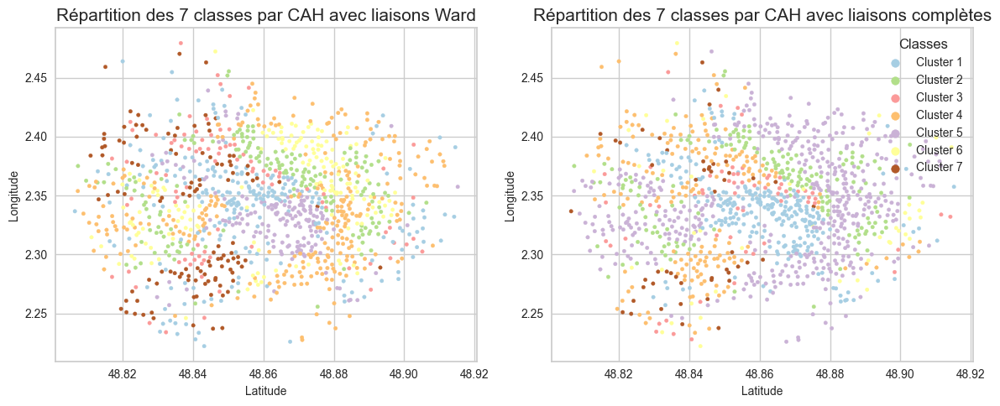

In [105]:
# Création de la colormap
K = 7 # D'après le score silhouette
cmap = plt.get_cmap('Set3', K)

# Création de la figure et des sous-graphiques
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Premier sous-graphique pour la méthode 'ward'
ac_ward_init = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage="ward")
clusters_ac_ward_init = ac_ward_init.fit_predict(loading)

# Deuxième sous-graphique pour la méthode 'complete'
ac_complete_init = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage="complete")
clusters_ac_complete_init = ac_complete_init.fit_predict(loading)



cmap = plt.get_cmap('Paired', K)


axs[0].scatter(coord['latitude'], coord['longitude'], 
                      c = clusters_ac_ward_init, cmap = cmap,s=10)

for cluster in np.unique(clusters_ac_ward_init):
    plt.scatter([], [], c=cmap(cluster), label=f'Cluster {cluster+1}')  # Ajouter une entrée de légende pour chaque cluster

axs[0].set_xlabel('Latitude', fontsize = 10)
axs[0].set_ylabel('Longitude', fontsize = 10)
axs[0].set_title('Répartition des 7 classes par CAH avec liaisons Ward', fontsize = 15)

axs[1].scatter(coord['latitude'], coord['longitude'], 
                      c = clusters_ac_complete_init, cmap = cmap,s=10)
axs[1].set_xlabel('Latitude', fontsize = 10)
axs[1].set_ylabel('Longitude', fontsize = 10)
axs[1].set_title('Répartition des 7 classes par CAH avec liaisons complètes', fontsize = 15)

plt.tight_layout()
plt.legend(scatterpoints=1, title='Classes')
plt.show()

Les deux graphiques affichent la répartition géographique des stations Vélib de Paris en sept clusters, déterminés par Clustering Hiérarchique Ascendant (CAH) avec deux méthodes de liaison différentes : Ward et complète.

* Répartition des 7 classes par CAH avec liaisons Ward :

La méthode de liaison de Ward tend à créer des clusters de taille plus uniforme et de forme plus compacte. Cela est visible sur le graphique où les clusters semblent être bien équilibrés en taille.

* Répartition des 7 classes par CAH avec liaisons complètes :

La liaison complète, en comparaison, forme des clusters en prenant en compte la plus grande distance entre les points des deux clusters pour effectuer la fusion. Cela peut mener à des clusters plus dispersés et à des formes plus étendues, ce qui est également visible sur le graphique correspondant.

* Comparaison des graphiques :

Les deux méthodes répartissent les stations en sept clusters, mais la forme, la taille et la distribution des clusters varient en fonction de la méthode de liaison utilisée.

Avec la liaison de Ward, les clusters semblent plus compacts et peut-être plus homogènes en termes de densité de points, alors que la liaison complète présente une variété plus grande dans la densité et la dispersion des points. La liaison de Ward est souvent privilégiée pour son approche qui minimise la variance totale au sein des clusters, tandis que la liaison complète est plus sensible aux différences extrêmes et peut être utile pour identifier des clusters très distincts et bien séparés.

In [106]:
fig = px.scatter_mapbox(coord, lat='latitude', lon='longitude',
                        color=clusters_ac_complete_init.astype(str),  # Convertis les clusters en string pour une échelle de couleur qualitative
                        color_discrete_sequence=px.colors.qualitative.Plotly, # Utilise une séquence de couleurs qualitatives
                        mapbox_style="carto-positron",  # Style de la carte
                        zoom=10,  
                        opacity=0.7,  # Opacité des points
                        title='Répartition des 7 classes par classification CAH avec liaisons complètes à Paris')

fig.show()

In [107]:
fig = px.scatter_mapbox(coord, lat='latitude', lon='longitude',
                        color=clusters_ac_ward_init.astype(str),  # Convertis les clusters en string pour une échelle de couleur qualitative
                        color_discrete_sequence=px.colors.qualitative.Plotly, # Utilise une séquence de couleurs qualitatives
                        mapbox_style="carto-positron",  # Style de la carte
                        zoom=10,  
                        opacity=0.7,  # Opacité des points
                        title='Répartition des 7 classes par classification CAH avec liaisons Ward à Paris')

fig.show()

Contrairement au clustering avec K-means sur les données issues de l'ACP, où l'un des clusters était ensuite divisé en 2 entre 6 et 7 clusters; cette fois, tous les clusters sont différents d'un type de liaison à l'autre. Certaines stations sont situées dans les mêmes clusters, comme les stations dans les clusters 0 situées au centre. A l'inverse, d'autres sont regroupées dans des clusters distincts, comme les stations en périphérie.

### 4.8.3 - Comparaison des différentes classifications par CAH

In [108]:
print("CAH avec liaisons Ward")
print("")
performance(loading, clusters_ac_ward_init)
print("")
print("------------------------")
print("")
print("CAH avec liaisons Complete")
print("")
performance(loading, clusters_ac_complete_init)

CAH avec liaisons Ward

Silhouette Score : 0.12255277986025787
R-squared Score : 0.3110748498653187
SSE : 7319.34565619864
Calinski-Harabasz Score : 241.6688581531635

------------------------

CAH avec liaisons Complete

Silhouette Score : 0.1984573981172839
R-squared Score : 0.3127140269362173
SSE : 7542.671591949892
Calinski-Harabasz Score : 227.6677716669777


* CAH avec liaisons Ward :

Silhouette Score : 0.123, indique une faible séparation entre les clusters. C'est un score bas, suggérant que les clusters ne sont pas bien définis. R-squared Score : 0.311, ce qui signifie que les clusters expliquent une quantité modérée de la variance dans les données. SSE : 7319.35, qui est un indicateur de la distance totale des points de données par rapport aux centres de leurs clusters respectifs. Un chiffre plus bas est généralement préférable. Calinski-Harabasz Score : 241.67, un score qui évalue la dispersion entre et au sein des clusters. Un score plus élevé est préférable, indiquant des clusters bien définis et séparés.

* CAH avec liaisons Complete :

Silhouette Score : 0.198, qui est meilleur que celui de la liaison Ward. Cela suggère que les clusters définis par la liaison complète sont plus distincts et séparés. R-squared Score : 0.313, légèrement supérieur à celui de la liaison Ward, indiquant une légère amélioration dans l'explication de la variance des données. SSE : 7542.67, légèrement plus élevé que celui de la liaison Ward, ce qui peut indiquer une moins bonne cohésion au sein des clusters. Calinski-Harabasz Score : 227.67, plus bas que celui de la liaison Ward, ce qui suggère que bien que les clusters soient plus séparés, ils ne sont pas aussi densément regroupés.

* Quelle liaison privilégier ?

Sur la base du score de silhouette seul, la liaison complète semble préférable car elle produit des clusters plus distincts. Cependant, les autres métriques doivent également être prises en compte. La liaison de Ward a un meilleur score de Calinski-Harabasz, ce qui pourrait indiquer une meilleure densité des clusters malgré une séparation moins claire.

* Comparaison avec d'autres méthodes de classification sur les données initiales :

Par rapport au K-means et au GMM sur les données initiales, ces scores sont généralement inférieurs, en particulier les scores de silhouette. K-means avec 2 clusters avait un silhouette score de 0.282, beaucoup plus élevé que ceux de CAH, suggérant une meilleure définition des clusters avec cette méthode. Les scores R-squared sont comparables à ceux de K-means et GMM, montrant une quantité similaire de variance expliquée. En termes de SSE et de Calinski-Harabasz, K-means et GMM avaient tendance à avoir des scores plus favorables, indiquant des clusters plus cohésifs et mieux séparés.

En conclusion, même si la liaison complète offre une meilleure séparation des clusters selon le score de silhouette, les autres métriques suggèrent que la liaison de Ward pourrait créer des clusters plus cohérents. Cependant, par rapport à K-means et GMM, le CAH semble moins performant pour ces données spécifiques. 

## 4.9 - Clustering avec les données issues de la MCA

Dans cette partie, nous allons appliuer les deux méilleures méthodes de clustering observées précédemment aux données issues de la MCA. Comme nous l'avons vu dans la partie correspondante, la MCA ne prend peu ou pas en compte les informations sur l'altitude des stations. De plus, les regroupements des catégories sont plus larges et généraux qu'avec la méthde d'analyse en composantes principales. On perd plus d'informations avec la MCA et on s'attend donc à avoir ds résultats plus faibles ou moins bons.

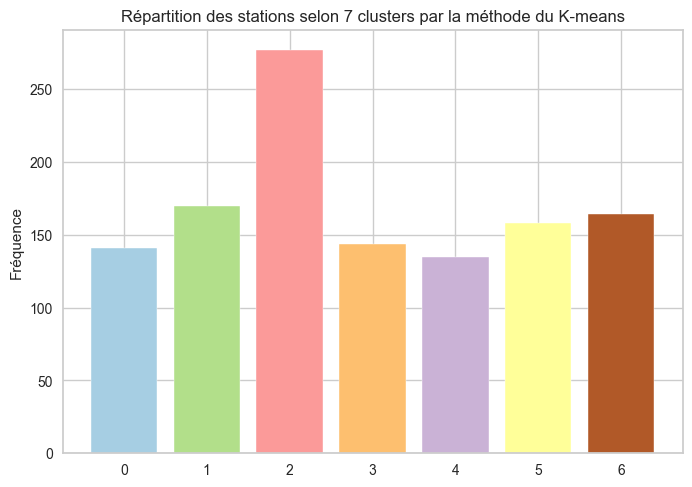

In [109]:
# Classification par K-means avec 7 clusters sur les données issues de la MCA
K = 7

kmeans7_mca = KMeans(n_clusters=K, random_state=0)
clusters7_mca = kmeans7_mca.fit_predict(loading_categorized)


cmap = plt.get_cmap('Paired',7)
plt.bar(*np.unique(clusters7_mca, return_counts=True), color=cmap.colors)
plt.ylabel("Fréquence")
plt.title("Répartition des stations selon "+ str(K)+" clusters par la méthode du K-means")
plt.show()

A l'image des répartitions dans les autres classifications, la répartition des stations entre les clusters n'est pas très équitables et on a des groupes de tailles différentes. On a un cluster $3$ avcec beaucoup de densité et un cluster $0$ moins dense que la moyenne.

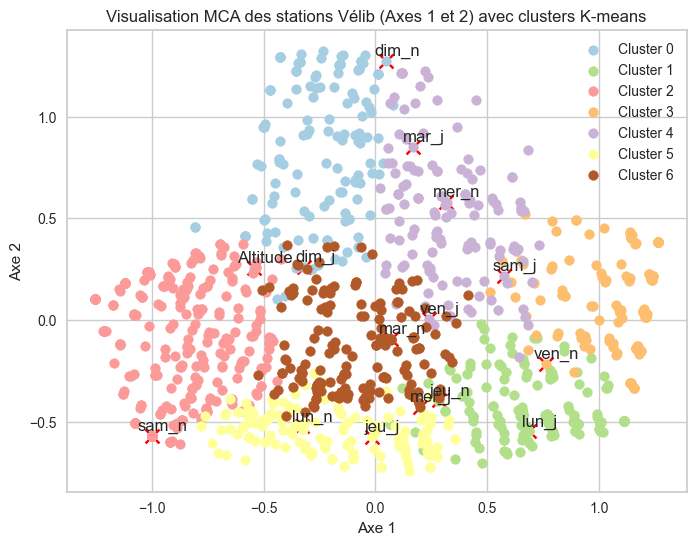

In [110]:
# Créer un nuage de points avec les coordonnées des axes de la MCA
plt.figure(figsize=(8, 6))
plt.scatter(coordinates.iloc[:, 0], coordinates.iloc[:, 1], alpha=0.5,s=4, linewidths=1)  # Visualisation sur les deux premiers axes

for i, nom_variable in enumerate(loading_categorized.columns):
    x_offset = 0.05
    y_offset = 0.05 
    plt.text(coordinates.iloc[i, 0] + x_offset, coordinates.iloc[i, 1] + y_offset, nom_variable, fontsize=12, ha='center', va='center')
    plt.scatter(coordinates.iloc[i, 0], coordinates.iloc[i, 1], marker='x', color='red', s=100)  # Ajustez la taille selon vos préférences

for cluster_id in range(K):
    cluster_coord = coordinates[clusters7_mca == cluster_id]
    plt.scatter(cluster_coord.iloc[:, 0], cluster_coord.iloc[:, 1], color=cmap.colors[cluster_id], label=f'Cluster {cluster_id}')

plt.xlabel('Axe 1')
plt.ylabel('Axe 2')
plt.title('Visualisation MCA des stations Vélib (Axes 1 et 2) avec clusters K-means')

plt.legend()

plt.show()

On représente le résultat sur un scatter avec les deux premiers axes principaux issus de la MCA. A l'image des observations précédentes sur la classification par K-means, les clusters semblent assez visuellement distincts, à part ceux en bas à droite qui sony plus confus. 

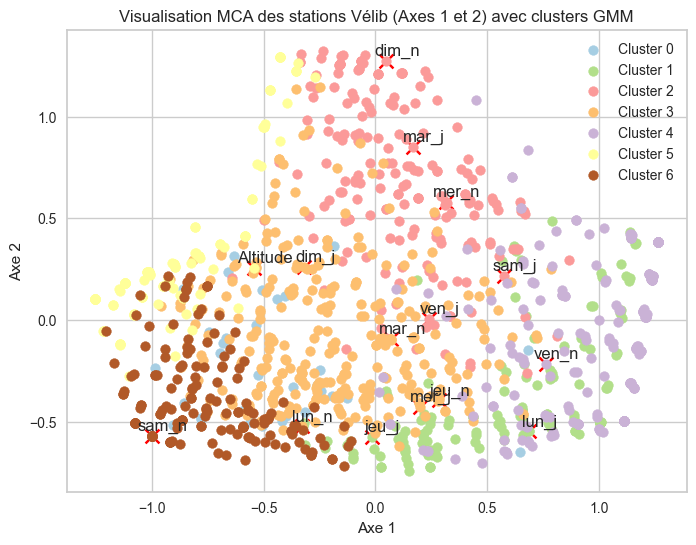

In [111]:
K = 7 # D'après K-means

cmap = plt.get_cmap('Paired', K)

gmm7_mca = GaussianMixture(n_components=K, n_init=3) 
clusters_gmm7_mca = gmm7_mca.fit_predict(loading_categorized)

plt.figure(figsize=(8, 6))
plt.scatter(coordinates.iloc[:, 0], coordinates.iloc[:, 1], alpha=0.5,s=2, linewidths=1)  # Visualisation sur les deux premiers axes

for i, nom_variable in enumerate(loading_categorized.columns):
    x_offset = 0.05
    y_offset = 0.05 
    plt.text(coordinates.iloc[i, 0] + x_offset, coordinates.iloc[i, 1] + y_offset, nom_variable, fontsize=12, ha='center', va='center')
    plt.scatter(coordinates.iloc[i, 0], coordinates.iloc[i, 1], marker='x', color='red', s=100)  # Ajustez la taille selon vos préférences

for cluster_id in range(K):
    cluster_coord = coordinates[clusters_gmm7_mca == cluster_id]
    plt.scatter(cluster_coord.iloc[:, 0], cluster_coord.iloc[:, 1], color=cmap.colors[cluster_id], label=f'Cluster {cluster_id}')

plt.xlabel('Axe 1')
plt.ylabel('Axe 2')
plt.title('Visualisation MCA des stations Vélib (Axes 1 et 2) avec clusters GMM')

plt.legend()

plt.show()

A l'image des observations sur les classifications sur les données initiales, ainsi que sur les données issues de l'ACP, les clusters ont l'air plus confus selon les deux axes principaux avec GMM qu'avec K-means.

In [112]:
print("Performances pour la classification K-means avec 7 clusters sur les données issues de la MCA")
performance(loading,clusters7_mca)
print("")
print("Performances pour la classification GMM avec 7 clusters sur les données issues de la MCA")
performance(loading,clusters_gmm7_mca)

Performances pour la classification K-means avec 7 clusters sur les données issues de la MCA
Silhouette Score : 0.1388114916536611
R-squared Score : 0.3138071617590633
SSE : 7318.518142235249
Calinski-Harabasz Score : 239.9784794508076

Performances pour la classification GMM avec 7 clusters sur les données issues de la MCA
Silhouette Score : 0.03184566782176327
R-squared Score : 0.2680997314368168
SSE : 9620.344200838545
Calinski-Harabasz Score : 157.56700398217603


Pour K-means :
* Silhouette Score : 0.123, ce qui indique un regroupement modérément bien séparé.
* R-squared Score : 0.315, ce qui suggère que 31.5% de la variance est expliquée par le modèle.
* SSE : 7230, indiquant une plutôt faible dispersion des points par rapport à leurs centres de clusters.
* Calinski-Harabasz Score : 244.8, ce qui indique des clusters denses et bien séparés.

Pour GMM :
* Silhouette Score : 0.0276, indiquant un chevauchement significatif entre les clusters.
* R-squared Score : 0.2615, ce qui suggère que 41.15% de la variance est expliquée par le modèle.
* SSE : 10105, indiquant une dispersion relativement plus élevée des points par rapport à leurs centres de clusters.
* Calinski-Harabasz Score : 143.6, ce qui suggère des clusters moins denses et moins bien séparés par rapport à K-means.

Globalement, les résultats de K-means semblent meilleurs que ceux de GMM pour ces données spécifiques, en termes de séparation des clusters et de réduction de la dispersion intra-cluster. Les observations sont cohérentes avec les classifications précédentes. Globalement, les scores sont moins bons que ceux obtenus sur les clasifications avec la même méthode sur les données initiales ou celles issues de l'ACP. Cela peut s'expliquer par le fait que la catégorisation choisie n'apporte pas d'information supplémentaire par rapport à celles obtenus par ACP. En effet, nous avions vu que l'altitude n'a pas une contribution suffisemment importante sur les axes conservés lors de la MCA, et ne suffit pas à compenser la perte d'information du fait du regroupement des variables et de leur discrétisaton.

# 5 - Comparaison des clustering

Pour comparer les méthodes de clustering mises en place dans la partie précédente, nous allons éssentiellement nous baser sur les matrices de confusion. Dans une matrice de confusion, dans le cadre d'un problème de classification, chaque ligne représente les instances dans un cluster réel (ou initial), et chaque colonne représente les instances dans un cluster prédit (ou après réduction de dimension avec PCA/MCA dans cerains cas).

L'analyse d'une matrice de confusion dans le contexte de clustering est légèrement différente de celle en classification, car en clustering, il n'y a pas de labels "corrects" ou "incorrects", c'est une classification non supervisée. Cependant, la matrice de confusion peut être utilisée pour évaluer la stabilité des clusters entre deux différentes représentations des données, ou comparer les différentes méthodes utilisées.

Dans un premier temps, nous allons utiliser les matrices de confusions pour comparer les clusters par la méthode du K-means sur les données initiales et les données issues de l'ACP. 

Dans un second temps, nous comparerons les différentes méthodes de classifications pour un même nombre de classes sur les données initiales. Nous pourrons observer les différences de classifications des stations vélib sur la carte de Paris.

## 5.1 - Etude des différences du clustering par K-means avec 7 clusters

Nous allons comparer les résultats obtenus sur les données issues de l'ACP et les données initiales, sur lesquelles on a fait de la classification K-means pour un même nombre de clusters.

In [113]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

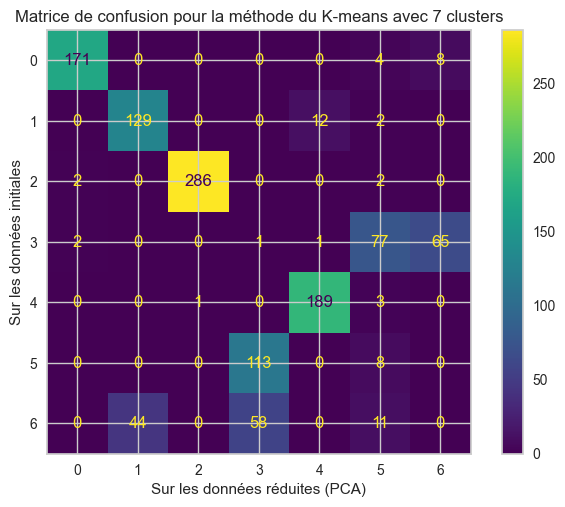

In [114]:
ConfusionMatrixDisplay(confusion_matrix(clusters7, clusters_pca7)).plot()
plt.xlabel('Sur les données réduites (PCA)')
plt.ylabel('Sur les données initiales')
plt.title('Matrice de confusion pour la méthode du K-means avec 7 clusters')
plt.show()

Les cellules/coefficients de la matrice avec des valeurs plus élevées sur la diagonale (comme le cluster 2 avec 286 points) montrent une forte correspondance entre les clusters sur les données originales et sur les données réduites. Cela suggère que la structure de ces clusters est relativement stable après la réduction de dimensionnalité par PCA.

Des valeurs élevées en dehors de la diagonale indiquent que des points d'un cluster dans une des méthodes de clustering ont été répartis dans différents clusters slon l'autre méthode de la comparaison. Cela pourrait indiquer une différence significative dans la structure des données avant et après l'ACP, ou que l'information perdue pendant la réduction de dimension affecte la formation des clusters.

Nous allons maintenant définir une fonction `matchClasses` qui compare deux classifications de données, et produit une table de confusion ajustée et un vecteur de classes ajusté pour la deuxième classification basée sur le meilleur appariement avec la première classification. 

In [115]:
def matchClasses(classif1, classif2):
    cm = confusion_matrix(classif1, classif2)
    K = cm.shape[0]
    a, b = np.zeros(K), np.zeros(K)
    for j in range(K):
        for i in range(K):
            if (a[j] < cm[i,j]):
                a[j] = cm[i,j]
                b[j] = i 
    a = a.astype(int)
    b = b.astype(int)
                                             
    print ("")
    print ("Taille de la classe :", a)
    print ("Classe (dans la numérotation de la classification):", b)
    print ("")
    
    table = cm.copy()
    for i in range(K):
        table[:,b[i]] = cm[:,i]   
        
    clusters = classif2.copy()
    n = classif2.shape[0]
    for i in range(n):
        for j in range(K):
            if (classif2[i] == j):
                clusters[i] = b[j]
        
    return table, clusters


Taille de la classe : [171 129 286 113 189  77  65]
Classe (dans la numérotation de la classification): [0 1 2 5 4 3 3]



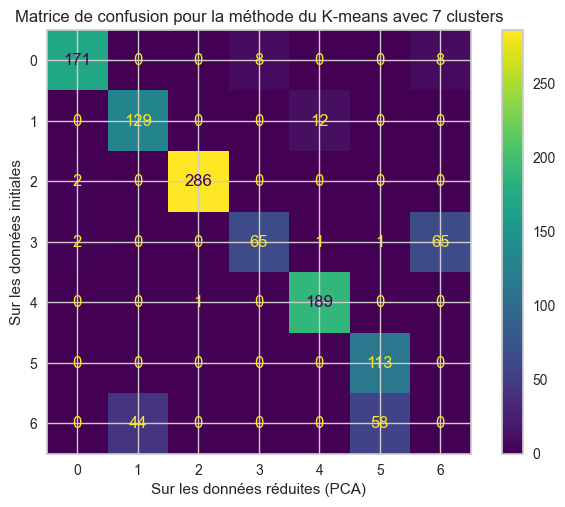

In [116]:
cm, clusters_pca_sorted = matchClasses(clusters7, clusters_pca7)

ConfusionMatrixDisplay(cm).plot()
plt.xlabel('Sur les données réduites (PCA)')
plt.ylabel('Sur les données initiales')
plt.title('Matrice de confusion pour la méthode du K-means avec 7 clusters')
plt.show()

Après l'utilisation de la fonction `matchClasses`, les clusters sont réordonnés de manière à correspondre au maximum de membres communs entre les deux classifications. Cela rend la diagonale plus pertinente, car elle montre maintenant le nombre d'éléments qui sont restés dans le même cluster avant et après ACP pour chaque pair de clusters correspondants.

Dans cette matrice, on peut observer que le cluster 2 (286 membres) reste le plus stable, ce qui suggère que les membres de ce cluster sont regroupés de manière similaire même après réduction de dimension. D'autres clusters comme le 4 (189 membres) montrent également une bonne stabilité.

Les clusters avec moins de membres sur la diagonale ou avec une répartition plus homogène à travers différentes colonnes peuvent indiquer une moins bonne correspondance et une plus grande influence de la réduction de dimension sur la structure de ces clusters spécifiques.

Finalement, on voit que les clusters sont assez similaires, ce qui confirme l'intérêt et la qualité de la réalistion de notre ACP. En réduisant les dimensions dans notre jeu de données initial, on accélère les temps de calculs. De plus, avec l'analyse des significations de nos dimensions principales, nous pouvons donner du sens à nos clusters sur les données issues de l'ACP, comme présenté précédemment. Cependant, cette méthde ne permet pas de visualiser les clusters sous forme de stations Vélib sur une carte de Paris. Pour ce type de visualisation, nous allons comparer les différentes méthodes de clustering sur les données initiales.

## 5.2 - Comparaison K-means et GMM sur les données initiales

### 5.2.1 - Comparaison avec 7 clusters


Taille de la classe : [120 283 106 173 143 113 176]
Classe (dans la numérotation de la classification): [5 2 3 0 1 6 4]



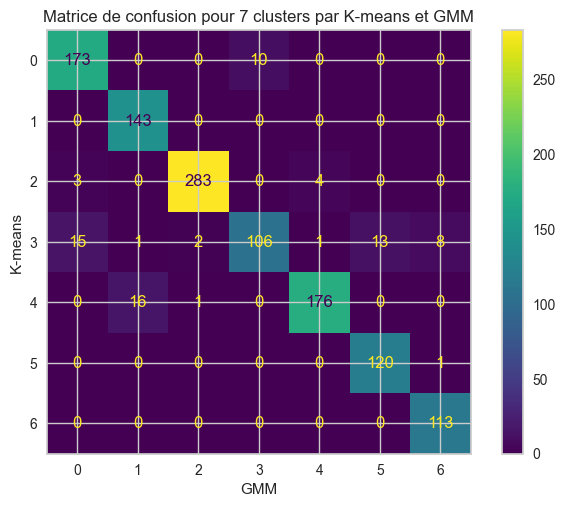

In [117]:
cm, clusters_pca_gmm= matchClasses(clusters7, clusters_gmm_init7)

ConfusionMatrixDisplay(cm).plot()
plt.xlabel('GMM')
plt.ylabel('K-means')
plt.title('Matrice de confusion pour 7 clusters par K-means et GMM')
plt.show()

Chaque ligne de la matrice représente un cluster issu de K-means, tandis que chaque colonne représente un cluster issu de GMM. Les cellules colorées indiquent le nombre de points de données que K-means et GMM ont en commun dans ces clusters correspondants.

* Clusters bien alignés : Les cellules avec des nombres élevés indiquent que ces clusters ont un grand nombre de points en commun. Cela suggère une certaine cohérence dans la séparation des données entre les deux méthodes de clustering pour ces clusters spécifiques.

* Clusters moins alignés : Des nombres plus faibles en dehors de la diagonale indiquent des cas où un cluster de K-means correspond à plusieurs clusters de GMM ou vice versa. Cela peut indiquer que la méthode GMM, qui prend en compte la covariance entre les caractéristiques, perçoit des structures de groupement différentes de celles identifiées par K-means, qui utilise une distance euclidienne simple.

* Interprétation de la diagonale : Pour les cellules sur la diagonale, cela montre le nombre de points que les deux méthodes ont classé dans le même cluster. Une grande valeur indique une forte concordance. Une petite valeur pourrait indiquer que même si les deux méthodes sont en accord sur le nombre de clusters, elles ne sont pas d'accord sur la composition des clusters.

* Conclusion : Une diagonale avec des valeurs élevées sur toute sa longueur indiquerait une très bonne correspondance entre les deux méthodologies de clustering sur l'ensemble des données. Des incohérences suggèrent que les deux méthodes ont des interprétations différentes des structures de données inhérentes, probablement dues aux différences dans leurs hypothèses de base et dans leurs méthodologies (par exemple, K-means cherche des clusters sphériques alors que GMM peut modeliser des clusters elliptiques).

Nous allons maintenant voir les différences des classifications des stations entre les deux méthodes. Pour cela, nous allons commencer par écrire une fonction qui compte le nombre de points classés différemment entre deux classifications, et qui affiche la carte de Paris avec ces stations distinctes en noir. Nous l'appliquerons à deux classifications dont les classes ont été préalablement réordonnées pour correspondre (via la fonction `matchClasses` par exemple).

In [118]:
def plot_cluster_comparison(coord, classif1, classif2, lat_col='latitude', lon_col='longitude', method1_name='Méthode 1', method2_name='Méthode 2'):
    """
    Affiche une carte des clusters comparant deux méthodes de classification.
    
    - param coord: DataFrame contenant les coordonnées et les clusters.
    - param classif1: Array des clusters obtenus par la première méthode de classification.
    - param classif2: Array des clusters obtenus par la deuxième méthode de classification.
    - param lat_col: Nom de la colonne contenant les latitudes.
    - param lon_col: Nom de la colonne contenant les longitudes.
    - param method1_name: Nom de la première méthode de classification pour le titre.
    - param method2_name: Nom de la deuxième méthode de classification pour le titre.
    """
    
    # Utiliser la fonction pour faire correspondre les clusters
    _, matched_clusters = matchClasses(classif1, classif2)

    # Créer une nouvelle colonne pour indiquer la correspondance des clusters
    coord['color'] = ['Même classification' if k == g else 'Classification différente' for k, g in zip(classif1, matched_clusters)]

    # Utiliser une séquence de couleurs qualitatives avec une couleur supplémentaire pour 'Classification différente'
    color_discrete_map = {str(i): color for i, color in enumerate(px.colors.qualitative.Plotly)}
    color_discrete_map['Classification différente'] = 'black'  # Noir pour les différences

    # Créer la carte avec Plotly Express
    fig = px.scatter_mapbox(coord, lat=lat_col, lon=lon_col,
                            color='color',  
                            color_discrete_map=color_discrete_map,
                            mapbox_style="carto-positron",
                            zoom=10, 
                            opacity=0.7, 
                            title=f'Comparaison des clusters: {method1_name} vs {method2_name}')

    fig.show()


In [119]:
plot_cluster_comparison(coord, clusters7, clusters_gmm_init7, method1_name='K-means', method2_name='GMM')


Taille de la classe : [120 283 106 173 143 113 176]
Classe (dans la numérotation de la classification): [5 2 3 0 1 6 4]



In [120]:
nombre_points_total = coord.shape[0]
print(f"Nombre total de stations sur la carte : {nombre_points_total}")
nombre_points_noirs = (coord['color'] == 'Classification différente').sum()
print(f"Nombre de stations classées différemment (en noir  sur la carte) : {nombre_points_noirs}")

print(f"Pourcentage de stations classées différemment : {nombre_points_noirs/nombre_points_total*100} %")

Nombre total de stations sur la carte : 1189
Nombre de stations classées différemment (en noir  sur la carte) : 75
Pourcentage de stations classées différemment : 6.307821698906644 %


On obsrve que 15,5% des stations ne sont pas classées de la même manière entre les méthodes K-means et GMM avec 7 clusters. Les deux méthodes proposent des clustering très proches. Les tendances des différences observées sont regroupées vers les quartiers Vaugirard, Popincourt, Reuilly, 12E.

### 5.2.2 - Comparaison K-means et GMM avec 2 clusters sur les données initiales


Taille de la classe : [717 464]
Classe (dans la numérotation de la classification): [1 0]



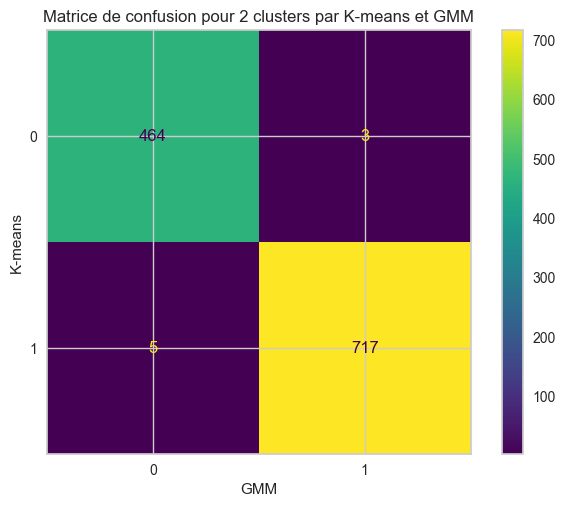

In [121]:
cm, clusters_pca_gmm= matchClasses(clusters2, clusters_gmm_init2)

ConfusionMatrixDisplay(cm).plot()
plt.xlabel('GMM')
plt.ylabel('K-means')
plt.title('Matrice de confusion pour 2 clusters par K-means et GMM')
plt.show()

Avec 2 classes, on voit que les clusters entre GMM et K-means sont très similaires, avec très peu de stations qui diffèrent d'une méthode à l'autre. Cela s'explique par le nombre de classes réduit qui fait diminuer les différences de classifications.

In [122]:
plot_cluster_comparison(coord, clusters2, clusters_gmm_init2, method1_name='K-means', method2_name='GMM')


Taille de la classe : [717 464]
Classe (dans la numérotation de la classification): [1 0]



L'analyse de la matrice de confusion se confirme sur la représentation des stations dont la classification est similaire/différente entre les deux méthodes. De part le fait que le nombre de stations aux classifications différentes est faibles, ces dernières sont éparpillées sur la carte, sans trop de densité. Il n'y a pas de signification particulière à attribuer aux stations en noire sur la carte. 

## 5.3 - Comparaison K-means et CAH avec 7 clusters sur les données initiales

### 5.4.1 - CAH avec liaisons Ward


Taille de la classe : [128 122  68 258 142 135 101]
Classe (dans la numérotation de la classification): [3 1 6 2 0 4 5]



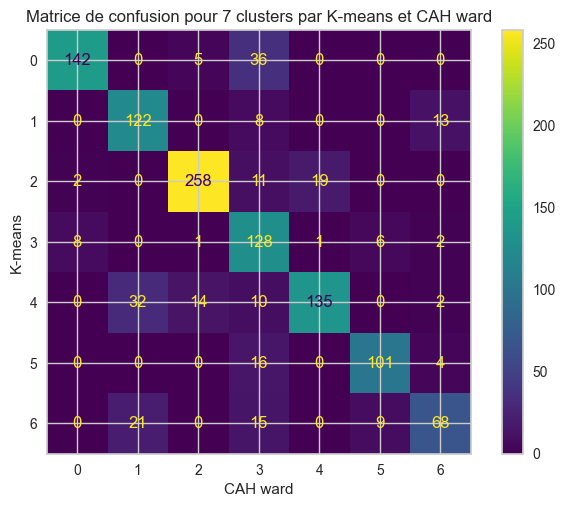

In [123]:
cm, clusters_pca_gmm= matchClasses(clusters7, clusters_ac_ward_init)

ConfusionMatrixDisplay(cm).plot()
plt.xlabel('CAH ward')
plt.ylabel('K-means')
plt.title('Matrice de confusion pour 7 clusters par K-means et CAH ward')
plt.show()

Les coeffcients sur la diagonale de a matrice représentent les valeurs les plus iportantes de la matrice. Cela indique des regroupements similaires dans les mêmes clusters entre les méthodes K-means et CAH avec liaison Ward avec 7 clusters. Ce résultat de similarité est d'autant plus marqué que le nombre de clusters est grand (7 par rapport à 2 dans l'étude précédente). On observe également certains coefficients en dehors de la diagonale qui indiquent des différences de clusterig entre les deux méthodes. Cependant, les valeurs de ces coefficients sont assez faibles par rapport aux valeurs de la diagonale.

In [124]:
plot_cluster_comparison(coord, clusters7, clusters_ac_ward_init, method1_name='K-means', method2_name='CAH ward')


Taille de la classe : [128 122  68 258 142 135 101]
Classe (dans la numérotation de la classification): [3 1 6 2 0 4 5]



Comme sur la carte précédente, même si le nombre de stations dont la classification est différente est plus important, leurs localisations sont éparpillées et uniformément réparties. Il n'y a pas forcément de quartiers précis.

### 5.4.2 - CAH avec liaisons complètes


Taille de la classe : [173 126  37  85 282  18  27]
Classe (dans la numérotation de la classification): [0 1 3 5 2 6 5]



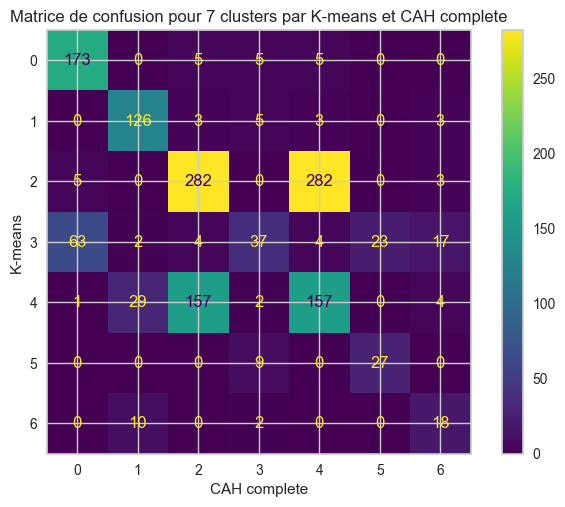

In [125]:
cm, clusters_pca_gmm= matchClasses(clusters7, clusters_ac_complete_init)

ConfusionMatrixDisplay(cm).plot()
plt.xlabel('CAH complete')
plt.ylabel('K-means')
plt.title('Matrice de confusion pour 7 clusters par K-means et CAH complete')
plt.show()

En analysant cette matrice, on observe que les clusters 2 de K-means et 2 de CAH complète ont le plus grand nombre de points en commun, ce qui suggère une forte correspondance. Cependnat, contrairement à la matrice de confusion précédente avec CAH ward, on remarque également une forte correspondance dans la cellule (2,4) avec la même valeur, ce qui pourrait indiquer une sorte de "duplication" dans la classification par CAH complète.

Les différences dans la structure des clusters identifiés par les deux méthodes de liaison peuvent être dues à la sensibilité de la CAH complète à la présence d'outliers, conduisant à des clusters potentiellement plus fragmentés, tandis que la liaison Ward tend à créer des clusters plus homogènes.

In [126]:
plot_cluster_comparison(coord, clusters7, clusters_ac_complete_init, method1_name='K-means', method2_name='CAH complete')


Taille de la classe : [173 126  37  85 282  18  27]
Classe (dans la numérotation de la classification): [0 1 3 5 2 6 5]



Le nombre de stations dont la classification est différente d'une méthode à l'autre est plus importante que dans les autres comparaisons avec la méthode K-means. Ces points restent éparpillés, même si de manière moins uniforme que pour les comparaisons précédentes. La tendance des quartiers concernés permet de regrouper les quartiers des Halles, Popincourt, le quartier Latin, Faubourg Saint-Jacques, Vaugirard et République qui sont assez centraux dans la ville. On note aussi quelques quartiers résidentiels au nord et au sud de la ville.

## 5.4 - Comparaison GMM et CAH avec 7 clusters sur les données initiales

### 5.4.1 - CAH avec liaisons Ward


Taille de la classe : [ 99 129  69 255 135 138 104]
Classe (dans la numérotation de la classification): [2 4 5 1 3 6 0]



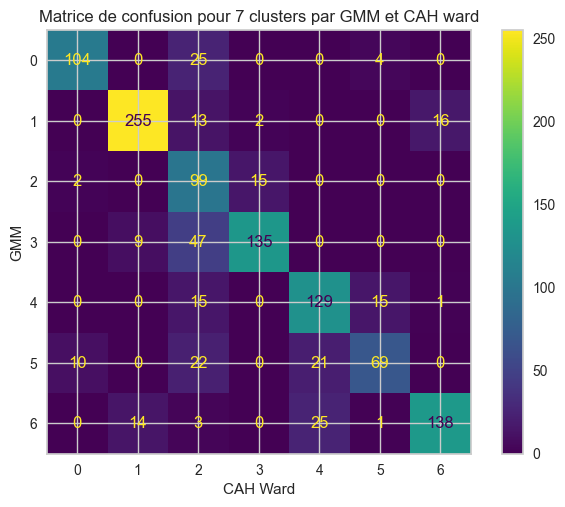

In [127]:
cm, clusters_pca_gmm= matchClasses(clusters_gmm_init7, clusters_ac_ward_init)

ConfusionMatrixDisplay(cm).plot()
plt.xlabel('CAH Ward')
plt.ylabel('GMM')
plt.title('Matrice de confusion pour 7 clusters par GMM et CAH ward')
plt.show()

Sur cette matrice de confusion entre la méthode GMM et CAH avec liaison Ward, on observe que : 

* Les valeurs élevées sur la diagonale (par exemple, les cellules (0,0), (1,1), et (2,2)) indiquent un bon accord entre GMM et CAH Ward pour ces clusters.

* Les valeurs élevées hors de la diagonale (par exemple, les cellules (0,3) et (3,0)) montrent des points où GMM et CAH Ward ne sont pas d'accord sur le cluster assigné.

* Si des valeurs élevées se répartissent entre plusieurs colonnes ou lignes pour un même cluster de l'une des méthodes, cela peut indiquer une différence significative dans la perception de la structure des clusters entre les deux méthodes.

Pour cette matrice, la plupart des clusters montrent une correspondance raisonnablement élevée sur la diagonale, suggérant une certaine cohérence dans le clustering par GMM et CAH Ward, avec quelques divergences notables. Le manque de cohérence est accentué par rapport aux comparaisons avec la méthode K-means, suggérant encore plus de différences entre GMM et CAH avec Ward.

In [128]:
plot_cluster_comparison(coord, clusters_gmm_init7, clusters_ac_ward_init, method1_name='GMM', method2_name='CAH Ward')


Taille de la classe : [ 99 129  69 255 135 138 104]
Classe (dans la numérotation de la classification): [2 4 5 1 3 6 0]



A l'image de la comparaison entre K-means et CAH Ward, les stations dont le clustering est différent sont uniformément éparpillées sur la carte, sans significayion apparente spécifique.

### 5.4.2 - CAH avec liaisons complètes


Taille de la classe : [173 133  25  84 276  24  33]
Classe (dans la numérotation de la classification): [3 4 2 0 1 5 0]



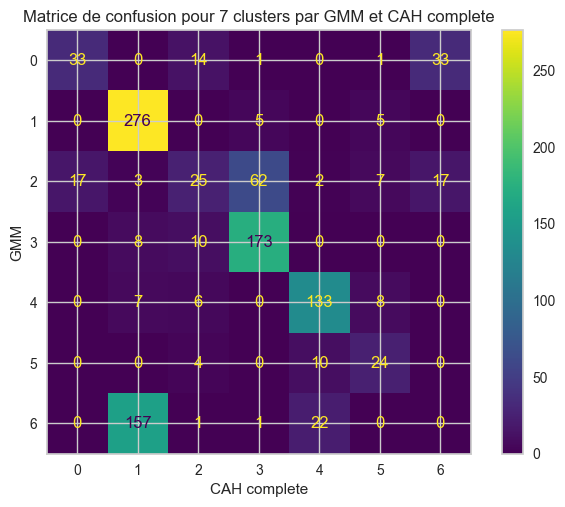

In [129]:
cm, clusters_pca_gmm= matchClasses(clusters_gmm_init7, clusters_ac_complete_init)

ConfusionMatrixDisplay(cm).plot()
plt.xlabel('CAH complete')
plt.ylabel('GMM')
plt.title('Matrice de confusion pour 7 clusters par GMM et CAH complete')
plt.show()

Les observations sur cette matrice de confusion sont dans la même tendance que celles de la matrice de confusion entre GMM et CAH Ward, et sont même accentuées. C'est à dire que les coefficients diagonnaux sur les premiers clusters ont des valeurs assez importantes montrant un clustering similaire. A l'inverse, pour les derniers clusters, les coefficients diagonnaux sont très faibles, et il n'y a pas d'autre coefficient qui se dégage nettement. Cela peut donc indiquer des clusterisations très différentes entre les méthodes pour les derniers clusters.

In [130]:
plot_cluster_comparison(coord, clusters_gmm_init7, clusters_ac_complete_init, method1_name='GMM', method2_name='CAH complete')


Taille de la classe : [173 133  25  84 276  24  33]
Classe (dans la numérotation de la classification): [3 4 2 0 1 5 0]



L'observation ci-dessus est confirmée sur la carte de Paris. On observe de nombreuses stations dont le clustering est différent d'une méthode à l'autre. Les stations différentes sont globalement regroupées au centre et au nord de la ville.

## 5.5 - Comparaison des classifications en utilisant l'analyse en composantes multiples (MCA)

La MCA est une technique d'analyse de données qui peut être utilisée pour réduire la dimensionnalité et explorer la structure sous-jacente des données. En utilisant les résultats de la MCA, nous pouvons visualiser les relations entre les variables et les observations dans un espace de dimensions réduites, ce qui peut faciliter la comparaison des clusters générés par différentes méthodes de clustering.

### 5.5.1 - Regroupement de tous les résultats des classifications

Nous construisons un DataFrame qui regroupe tous les résultats de nos clusterings en fonction des méthodes utilisées et nombres de clusters implémentés.

In [131]:
list_class = [clusters_pca7, clusters_pca6, clusters_pca3, clusters_gmm7, clusters_gmm6, clusters_gmm3, clusters_ac_ward, clusters_ac_complete, clusters_ac_ward7, clusters_ac_complete7,
              clusters7, clusters2, clusters_gmm_init7, clusters_gmm_init2, clusters_ac_ward_init, clusters_ac_complete_init]
name_class = ['clusters_pca7', 'clusters_pca6', 'clusters_pca3', 'clusters_gmm7', 'clusters_gmm6', 'clusters_gmm3', 'clusters_ac_ward', 'clusters_ac_complete', 'clusters_ac_ward7', 
              'clusters_ac_complete7', 'clusters7', 'clusters2', 'clusters_gmm_init7', 'clusters_gmm_init2', 'clusters_ac_ward_init', 'clusters_ac_complete_init']

mat_results = np.zeros((len(list_class[0]),len(list_class)))
for classe in range(len(list_class)):
    mat_results[:,classe] = list_class[classe]

df_results = pd.DataFrame(mat_results)
df_results.columns = name_class

df_results.head()
    

,clusters_pca7,clusters_pca6,clusters_pca3,clusters_gmm7,clusters_gmm6,clusters_gmm3,clusters_ac_ward,clusters_ac_complete,clusters_ac_ward7,clusters_ac_complete7,clusters7,clusters2,clusters_gmm_init7,clusters_gmm_init2,clusters_ac_ward_init,clusters_ac_complete_init
0,4.0,4.0,2.0,3.0,4.0,2.0,0.0,2.0,4.0,0.0,4.0,1.0,6.0,0.0,1.0,1.0
1,1.0,1.0,1.0,3.0,4.0,2.0,0.0,0.0,5.0,2.0,1.0,0.0,4.0,1.0,1.0,1.0
2,6.0,5.0,0.0,5.0,1.0,2.0,2.0,1.0,2.0,1.0,3.0,0.0,2.0,1.0,0.0,0.0
3,0.0,0.0,0.0,5.0,2.0,0.0,2.0,1.0,2.0,1.0,0.0,1.0,3.0,0.0,0.0,0.0
4,6.0,5.0,0.0,5.0,1.0,2.0,1.0,1.0,6.0,1.0,3.0,0.0,2.0,1.0,0.0,2.0


### 5.5.2 - Mise en place de la MCA sur les résultats des classifications

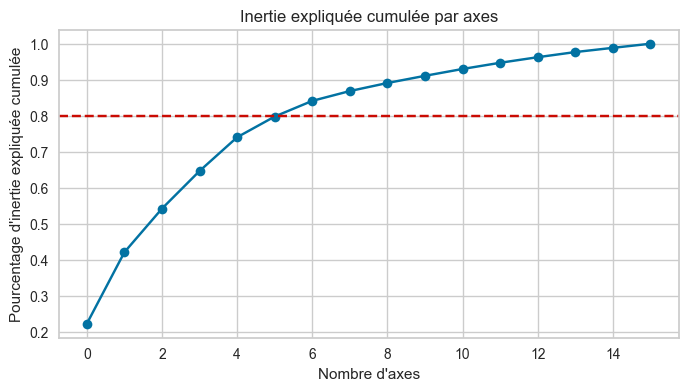

In [132]:
# Initialisation de l'analyse MCA 
mca = prince.MCA(
    n_components=16,  # Nombre de dimensions initiales de notre dataframe
    n_iter=3,         # Nombre d'itérations pour l'optimisation
    copy=True,        # Pour éviter de modifier les données d'origine
    check_input=True,
    random_state=42
)

# Ajustement de la MCA aux données
mca = mca.fit(df_results)

# Calcul de l'inertie expliquée à partir des valeurs propres
eigenvalues = mca.eigenvalues_ 
total_inertia = sum(eigenvalues)  
explained_inertia = [val / total_inertia for val in eigenvalues] 

# Affichage de l'inertie cumulée expliquée
plt.figure(figsize=(8, 4))
plt.plot(np.cumsum(explained_inertia), marker='o')
plt.xlabel('Nombre d\'axes')
plt.ylabel('Pourcentage d\'inertie expliquée cumulée')
plt.title('Inertie expliquée cumulée par axes')
plt.axhline(y=0.8, color='r', linestyle='--')  # Ligne pour le seuil de 80%
plt.show()

Toujours dans un objectifs de conserver au moins 80% de l'inertie totale cumulée, nous allons conserver 6 axes.

In [133]:
# Effectuer une nouvelle MCA sur les données de classification
mca = prince.MCA(n_components=6)  
mca.fit(df_results)

# Obtenir les coordonnées des stations dans l'espace de dimensions réduites
coordinates = mca.transform(df_results)

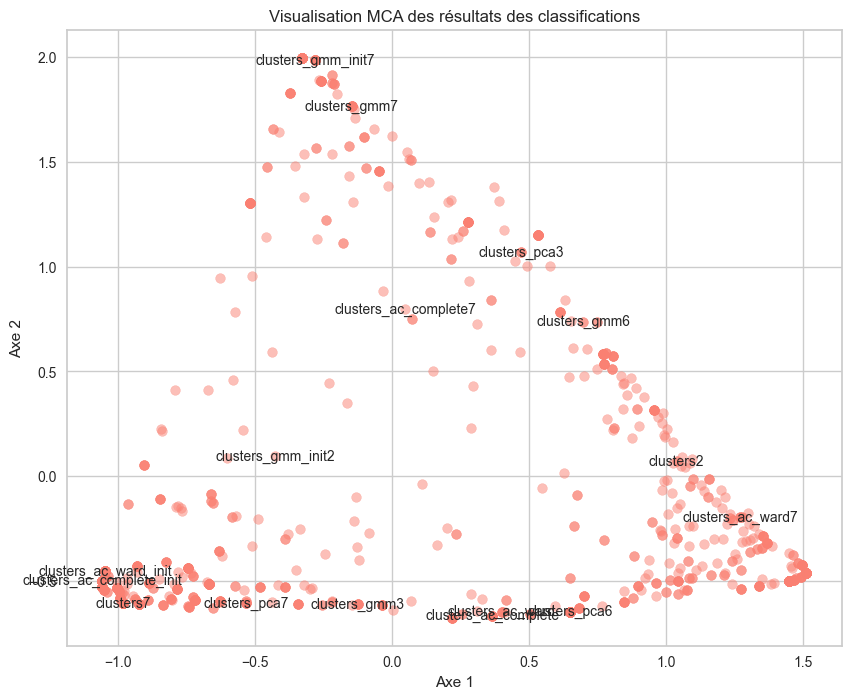

In [134]:
# Obtenir les coordonnées des stations dans l'espace de dimensions réduites
coordinates = mca.transform(df_results)

# Visualiser les résultats de la MCA
plt.figure(figsize=(10, 8))
plt.scatter(coordinates.iloc[:, 0], coordinates.iloc[:, 1], alpha=0.5, color='salmon')  # Visualisation sur les deux premiers axes

# Ajouter les noms des stations en tant qu'étiquettes
for i, methods in enumerate(df_results.columns):
    x_offset = 0.05 
    y_offset = 0.05  
    plt.text(coordinates.iloc[i, 0], coordinates.iloc[i, 1], methods, fontsize=10, ha='center', va='center')

plt.xlabel('Axe 1')
plt.ylabel('Axe 2')
plt.title('Visualisation MCA des résultats des classifications')

plt.show()

On peut voir une certaine séparation entre les points, ce qui suggère que les stations ont des profils de fréquentation différents et que les deux premiers axes de la MCA capturent certaines de ces différences. On a des stations avec des profils similaires (en termes de fréquentation, de plages horaires, et de bonus) ont tendance à être regroupées, indiquant qu'elles partagent des caractéristiques communes.

Les méthodes sont réparties aux extrémités, avec des différences de densité et de structure selon la méthode utilisée. Les clusters créés par K-means et GMM diffèrent visuellement, suggérant que les méthodes capturent les profils des stations de manières légèrement différentes. On observe des groupes aux coins du sctatter qui a une tendance triangulaire. Certaines similitudes auraient pu être anticipées, comme celle entre GMM avec 7 clusters sur les données initiales et les données issues de l'ACP. De même, on aurait pu prévoir que GMM avec 2 clusters sur les données initiales et CAH avec liaisons complètes auraient des comportements proches. On voit aussi la différence entre K-means et GMM, notamment avec 7 clusters, car les méthodes sont très éloignées sur le graphe.


## 5.6 - Bilan des comparaisons

Finalement, nous observons que lorsqu'il y a moins de clusters, nous avons moins de différences entre deux méthodes (ce qui est logique et évident). De plus, les comparaisons des méthodes avec la méthode K-means présentent moins de différences de clustering des stations que les comparaisons avec la méthode GMM. Cela est cohérent avec les observations que nous avions faites dans la partie 4. Les stations aux classifications différentes entre deux méthodes sont uniformément réparties sur la carte de Paris, nous n'avons pas d'interprétation particulière à fournir. Nous avons pu constater une légère concentration des stations aux classifications différentes vers le centre de la ville lors des comparaisons incluant la méthode GMM. Généralement, les stations Vélib du Nord-Ouest de la ville ont la même classification entre les différentes méthodes. Lors de l'exploration des quartiers, nous avons pu voir que cette zone regroupait des quartiers résidentiels. Peut être que l'unicité de cette activité permet peut être d'avoir une classification franche. A l'inverse les quartiers centraux peuvent avoir plusieurs activité majeures (culture, tourisme, bureaux...). Cela peut peut-être expliquer les différences de classifications observées. 

## 5.7 - Bilan général

### 5.7.1 - Comparaison entre les résultats en R et Python

Nous avons pu observer des différences entre les deux langages. Premièrement, les librairies utilisées ne fonctionnent pas de la même manière. Nous avons pu utiliser des fonctions déjà implimentées dans les librairies Python qui ne sont pas dans R, nécessitant alors une définition à la main, et inversement. De plus, nous avons du nous adapter aux affichages disponibles dans chaque langage : R ne permet pas d'afficher des matrices de corrélations avec des dégradés de couleurs en fonction des valeurs aussi aisément qu'en Python. L'affichage des cartes est différent. Il a été plus fastidieux d'afficher la carte de Paris en R.

Dans la partie de réduction de dimensions par ACP, nous avons remarqué que la base choisie était définie de la même manière en valeur absolue entre R et Python. Cependant, si on se penche sur les signes des coefficients de la base, on voit des différences de signes, qui se répercutent sur les signes des corrélations. Cette différence s'explique par le fait qu'il n'y a pas de signe mieux qu'un autre à partir du moment où les valeurs sont les mêmes. Nous nous sommes adaptés en restant cohérents avec les signes de chaque langage dans la suite du travail. 

Dans la partie classification, nous avons observé qu'une même méthode sur un même jeu de données ne donne pas forcément les mêmes résultats entre les deux langages. Cette observation est d'autant plus vraie pour la méthode GMM. Cela s'explique par le fait que R teste plusieurs configurations de clusters avec des tailles, orientations et formes qui peuvent être liées ou différentes. Il choisit alors la meilleure avec les meilleurs paramètres, alors que Pyhton ne prend qu'une seule combinaison possible (nous avons choisir la combinaison par défaut). 

### 5.7.2 - Utilités de ce projet

A travers les différentes étapes du projet, nous avons pu étudier les fréquentations des stations Vélib de la ville de Paris au cours de la semaine, en fonction des jours et des heures de la journée. Cette étude préliminaire nous a permis de mettre en avant les déplacements bi-pendulaires des utilisateurs des vélos pour la mobilité urbaine. Nous avons remarqué un déplacement général le matin des quartiers périphérique regroupant des zones résidentiels vers les quais de Seine et le centre-ville, regroupant des quartiers culturels, touristiques et de bureaux. Nous constatons le déplacement inverse en fin de journée. Aussi, nous avons vu que les quatiers situés en altitude étaient moins fréquentés par les utilisateurs des Vélib. Cela peut s'expliquer par la difficulté d'accés, rendant l'usage du vélo plus sportif. 

Puis, avec la réducton de dimension avec l'ACP et la MCA, nous avons pu donner des significations aux composantes principales. Nous avons distingué les sttaions dont le taux de chargement moyen était élevé, ou à l'inverse faible, tout au long de la semaine. Nous avons aussi pu caractériser les stations très fréquentés en journée et très peu la nuit, ou encore celles très fréquentées en début de semaine, et présentant plus de disponibilit à la fin de la semaine. Nous avons alors définit des variables retranscrivant nos hypothèses. L'étude des corrélations avec les dimensions principales nous a permis de les confirmer, tout comme l'analyse en composantes multiples.

Ensuite, la partie classification nous a permis de regrouper les stations aux activités similaires. En effet, la classification sur les données issues de l'ACP nous a permis de regrouper les stations aux fréquentations similaires, comme étudié avec les significations principales. Par la suite, la classification sur le jeu de données initial a permis de regrouper les stations aux activités similaires. Nous avons pu dégager les quartiers résidentiels, de bureaux ou culturels par exemple. 

Au final, cette étude apporte beaucoup d'informations pour les utilisateurs : nous pourrions supposer qu'il serait possible de développer une application pour les utilisateurs des Vélib leur perméttant de voir en temps réel la disponibilité des stations, mais aussi les prévisions de fréquentations en fonction des jours de la semaine ou des heures de la journée. De plus, cette étude peut être utile pour l'entreprise responsable des Vélib. Cela va leur permettre de connaître les stations qui doivent être vidées au profit des stations qui attendent de fortes fréquentations. En cas de dommages sur de plusieurs vélos ou stations, cela va leur permettre de savoir quelles sont les stations à prioriser pour répondre au mieux à la demande des utilisateurs. 

Pour améliorer ces éléments d'analyse, il serait pertinent de conduire cette étude sur plus de semaines, en faisant varier les périodes de l'année. Nous pourrions supposer que les parisiens se déplacent moins en vélo en hiver qu'en été compte tenu des conditions météorologiques. De plus, des périodes de vacances scolaires comme les vacances de Pâques ou d'été peuvent avoir des répercutions sur les fréquentations. Enfin, il faudrait vérifier que la semaine étudiée soit suffisemment représentative du mode de vie habituel de la population de Paris. Des événements particuliers comme des grandes compétitions sportives, des concerts ou autres rassemblements pourraient influer sur la fréquentation des stations et les déplacements des populations.

### 5.7.3 - Bilan du groupe

Nous avons apprécié le fait de travailler sur un sujet concret. Cela donne du sens à notre travail et nous permet également de nous projeter dans nos futures missions d'ingénieurs. Nous avons aimé le fait d'être libres dans le plan choisi pour notre projet. Nous avons pu donner beaucoup d'interprétations et avons donné un sens concret et réel aux résultats observés. Nous avons choisi de fonctionner en paire-programming, c'est à dire que nous nous sommes séparés en un binôme et un étudiant travaillant seul. Le binôme avait pour mission d'avancer le plus possible sur le déroulé du projet, l'étudiant seul devait retranscrire le code Python en R. Puis, nous avons modifié régulièrement la constitution du binôme, afin que chacun puisse coder dans les deux langages, mais aussi travailler sur de la recherche ou de l'interprétation. Cela permettait également d'alterner le travail en binôme et le développement d'autonomie. Les compétences étaient donc multiples.